In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.7 MB/s eta 0:00:00


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 15.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=300b59047483c9a2455950abcc4fc44f7fd3567e128774d8f90524012a15c667
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, roc_auc_score, recall_score,f1_score, precision_recall_curve, roc_curve, auc
import numpy as np
import xgboost as xgb
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.base import BaseEstimator, ClassifierMixin
import numpy as np
from sklearn.model_selection import ShuffleSplit
from scipy import stats
from lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Cardiac Arrest Dataset

In [ ]:
dfca = pd.read_csv('/content/drive/My Drive/capstone/undersampled_CDARREST_Knee_21_22_23(modified).csv')

In [ ]:
dfca.head()

,SEX,RACE_NEW,INOUT,Age,ASACLAS,CPT,ANESTHES,SMOKE,HXCOPD,HXCHF,...,PRSODM,PRCREAT,PRWBC,PRHCT,PRPTT,CDARREST,CDMI,DIABETES,BMI,Year
0,0,6,1,3,3,2,1,0,0,0,...,136,0.84,8.22,37.0,29.4,0,0,0,41.62,2023
1,0,1,1,4,3,2,3,0,1,0,...,139,0.90,8.48,44.0,29.7,0,0,1,33.41,2022
2,0,1,0,2,2,2,1,1,0,0,...,129,0.70,14.20,42.3,29.0,0,0,0,31.00,2021
3,0,1,0,3,2,2,1,0,0,0,...,140,0.54,7.79,40.0,29.7,0,0,0,21.76,2022
4,0,1,1,3,3,2,3,0,0,0,...,139,0.80,8.26,41.3,29.7,0,0,0,39.38,2022


# CDMI Dataset

In [ ]:
dfcdmi = pd.read_csv('/content/drive/My Drive/capstone/undersampled_CDMI_Knee_21_22_23(modified).csv')

In [ ]:
dfcdmi.head()

,SEX,RACE_NEW,INOUT,Age,ASACLAS,CPT,ANESTHES,SMOKE,HXCOPD,HXCHF,...,PRSODM,PRCREAT,PRWBC,PRHCT,PRPTT,CDARREST,CDMI,DIABETES,BMI,Year
0,0,1,1,3,3,2,1,0,0,0,...,139,0.80,5.06,35.9,29.7,0,0,0,29.45,2022
1,1,6,1,3,2,2,2,0,0,0,...,140,0.98,7.90,48.0,29.0,0,0,0,44.35,2021
2,1,1,0,3,3,2,2,0,0,0,...,141,1.02,5.57,42.0,29.4,0,0,0,25.84,2023
3,1,1,0,3,3,2,1,0,0,0,...,141,0.68,7.60,41.6,29.4,0,0,1,34.21,2023
4,0,1,0,3,2,2,2,0,0,0,...,140,0.60,6.70,41.1,29.7,0,0,0,34.95,2022


# Random Forest

## Cardiac Arrest

[I 2025-12-13 19:44:42,318] A new study created in memory with name: no-name-c8fbdcf1-6ea5-426f-b13e-d18ff584ec13
[I 2025-12-13 19:44:47,862] Trial 0 finished with value: 0.7259735349716446 and parameters: {'n_estimators': 194, 'max_depth': 19, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': None}. Best is trial 0 with value: 0.7259735349716446.
[I 2025-12-13 19:44:49,654] Trial 1 finished with value: 0.7152362948960302 and parameters: {'n_estimators': 176, 'max_depth': 18, 'min_samples_split': 9, 'min_samples_leaf': 14, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7259735349716446.
[I 2025-12-13 19:44:50,933] Trial 2 finished with value: 0.7207561436672968 and parameters: {'n_estimators': 154, 'max_depth': 13, 'min_samples_split': 17, 'min_samples_leaf': 13, 'max_features': 'log2'}. Best is trial 0 with value: 0.7259735349716446.
[I 2025-12-13 19:44:52,198] Trial 3 finished with value: 0.7144045368620038 and parameters: {'n_estimators': 155, 'max_depth': 20, '

Best hyperparameters:  {'n_estimators': 84, 'max_depth': 7, 'min_samples_split': 20, 'min_samples_leaf': 6, 'max_features': 'sqrt'}


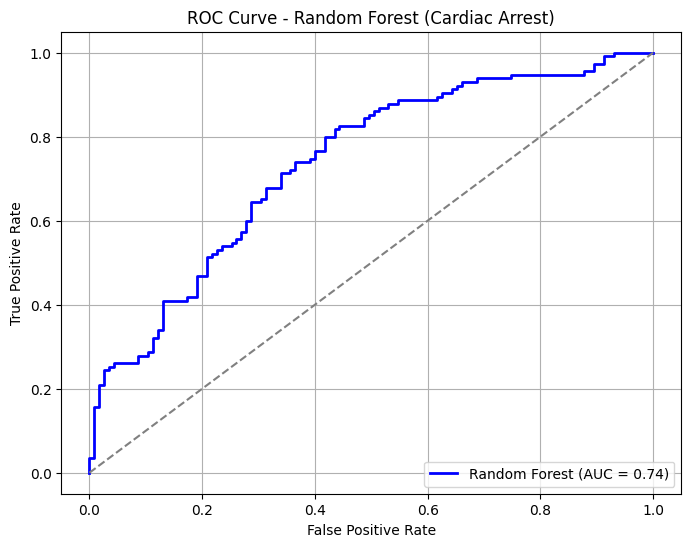

Random Forest Metrics for Cardiac Arrest: 
AUC Score: 0.7367
Accuracy: 0.6783
F1 Score: 0.6667
Recall: 0.6435
Precision: 0.6916


In [ ]:
# Define unique feature (X) and target (y) variables
X_RF_CA = dfca.drop(columns=['CDARREST', 'CDMI'])
y_RF_CA = dfca['CDARREST']

# Define the objective function for Optuna to optimize Random Forest hyperparameters
def objective(trial):
    # Suggest hyperparameters for this trial
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])

    # Initialize Random Forest classifier with suggested hyperparameters
    rf_classifier_CA = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        class_weight='balanced',
        random_state=42
)

    # Perform K-Fold cross-validation (K=5)
    kf_RF_CA = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA, y_RF_CA, cv=kf_RF_CA, method="predict_proba")[:, 1]

    # Compute AUC (ROC curve)
    fpr_RF_CA, tpr_RF_CA, _ = roc_curve(y_RF_CA, y_pred_prob_RF_CA)
    roc_auc_RF_CA = auc(fpr_RF_CA, tpr_RF_CA)

    # Return the AUC score as the objective for optimization
    return roc_auc_RF_CA

# Create and optimize the study using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters found
print('Best hyperparameters: ', study.best_params)

# Use the best hyperparameters for the final Random Forest model
best_params = study.best_params
rf_classifier_CA = RandomForestClassifier(**best_params, random_state=42)

# Perform K-Fold cross-validation with the optimized model
kf_RF_CA = KFold(n_splits=5, shuffle=True, random_state=42)
y_pred_prob_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA, y_RF_CA, cv=kf_RF_CA, method="predict_proba")[:, 1]
y_pred_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA, y_RF_CA, cv=kf_RF_CA, method="predict")

# Compute AUC (ROC curve)
fpr_RF_CA, tpr_RF_CA, _ = roc_curve(y_RF_CA, y_pred_prob_RF_CA)
roc_auc_RF_CA = auc(fpr_RF_CA, tpr_RF_CA)

# Compute additional metrics
accuracy_RF_CA = accuracy_score(y_RF_CA, y_pred_RF_CA)
f1_RF_CA = f1_score(y_RF_CA, y_pred_RF_CA)
recall_RF_CA = recall_score(y_RF_CA, y_pred_RF_CA)
precision_RF_CA = precision_score(y_RF_CA, y_pred_RF_CA)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_RF_CA, tpr_RF_CA, color='blue', lw=2, label=f'Random Forest (AUC = {roc_auc_RF_CA:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (Cardiac Arrest)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print all metrics with unique variable names
print(f'Random Forest Metrics for Cardiac Arrest: ')
print(f'AUC Score: {roc_auc_RF_CA:.4f}')
print(f'Accuracy: {accuracy_RF_CA:.4f}')
print(f'F1 Score: {f1_RF_CA:.4f}')
print(f'Recall: {recall_RF_CA:.4f}')
print(f'Precision: {precision_RF_CA:.4f}')

In [ ]:
rf_classifier_CA.fit(X_RF_CA, y_RF_CA)

RandomForestClassifier(max_depth=7, min_samples_leaf=6, min_samples_split=20,
                       n_estimators=84, random_state=42)

<Figure size 1800x600 with 0 Axes>

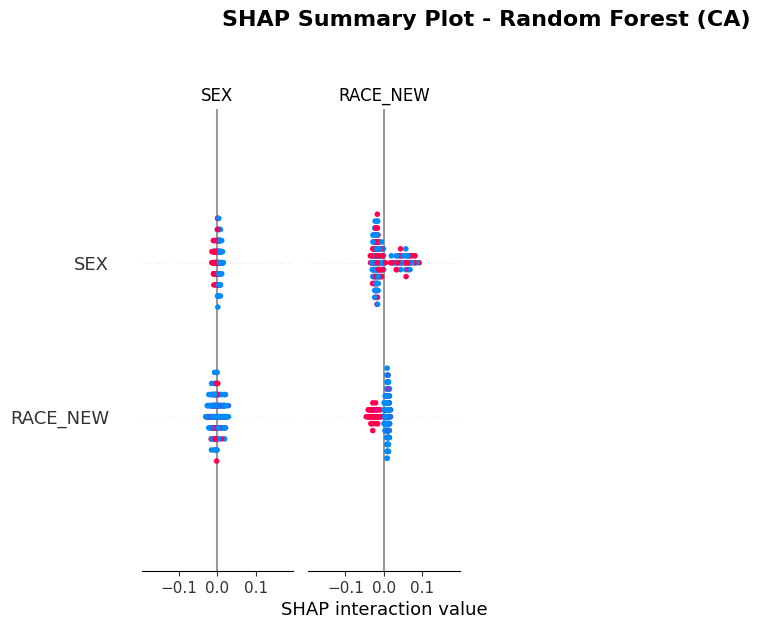

In [ ]:
# Use TreeExplainer which is optimized for tree-based models
explainer_RF_CA = shap.TreeExplainer(rf_classifier_CA)  # Pass the trained Random Forest model
shap_values_RF_CA = explainer_RF_CA.shap_values(X_RF_CA)  # Calculate SHAP values for the dataset

# Ensure feature names are correctly passed from dataset
feature_names = X_RF_CA.columns  # Get feature names from dataset

# Plot SHAP summary plot
plt.figure(figsize=(18, 6))  # Adjusted width for better visibility
shap.summary_plot(shap_values_RF_CA, X_RF_CA, feature_names=feature_names, plot_size=(2, 0.5), show=False)

# Add title above the plot for better positioning
plt.suptitle("SHAP Summary Plot - Random Forest (CA)", fontsize=16, fontweight="bold", y=1.05)

# Adjust layout and margins to prevent overlap
plt.subplots_adjust(top=0.90, right=1.2, bottom=0.2, left=0.2)

# Show the plot
plt.show()

/usr/local/lib/python3.12/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.12/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.12/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

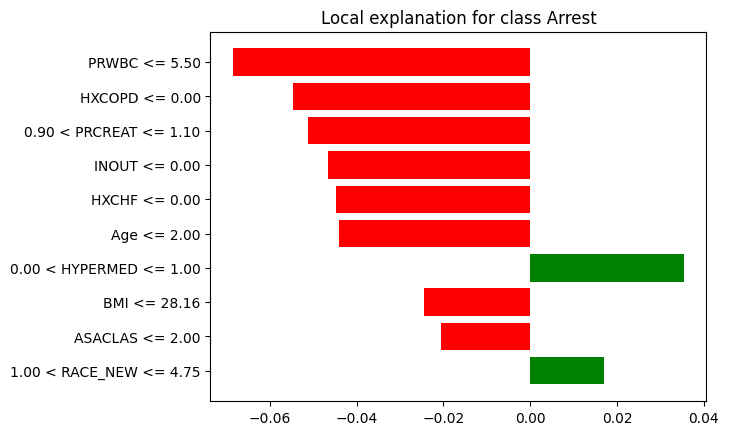

In [ ]:
# Initialize LIME Explainer for CA
lime_explainer_RF_CA = LimeTabularExplainer(
    training_data=X_RF_CA.values,  # Training data
    feature_names=X_RF_CA.columns.tolist(),  # Feature names
    class_names=['No Arrest', 'Arrest'],  # Class names (labels for the target variable)
    mode='classification'  # Mode is classification for the Random Forest model
)

# Randomly select an instance from the test data to explain
idx_RF_CA = np.random.randint(0, X_RF_CA.shape[0])
lime_exp_RF_CA = lime_explainer_RF_CA.explain_instance(
    X_RF_CA.iloc[idx_RF_CA],  # Instance to explain (using test data)
    rf_classifier_CA.predict_proba  # Use the Random Forest model to predict probabilities
)

# Show the explanation in the notebook
lime_exp_RF_CA.show_in_notebook()

# Plot the explanation as a figure
fig = lime_exp_RF_CA.as_pyplot_figure()
plt.show()

## CDMI

[I 2025-12-13 19:46:45,729] A new study created in memory with name: no-name-a7889056-5ddf-4220-8ef3-ae6c846c14cc
[I 2025-12-13 19:46:51,505] Trial 0 finished with value: 0.7737292912459562 and parameters: {'n_estimators': 113, 'max_depth': 8, 'min_samples_split': 16, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7737292912459562.
[I 2025-12-13 19:46:55,287] Trial 1 finished with value: 0.7705555827860013 and parameters: {'n_estimators': 107, 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7737292912459562.
[I 2025-12-13 19:47:05,284] Trial 2 finished with value: 0.7501041564552495 and parameters: {'n_estimators': 163, 'max_depth': 13, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': None}. Best is trial 0 with value: 0.7737292912459562.
[I 2025-12-13 19:47:08,043] Trial 3 finished with value: 0.757793353592785 and parameters: {'n_estimators': 79, 'max_depth': 9, 'min_sa

Best hyperparameters:  {'n_estimators': 91, 'max_depth': 4, 'min_samples_split': 19, 'min_samples_leaf': 2, 'max_features': 'sqrt'}


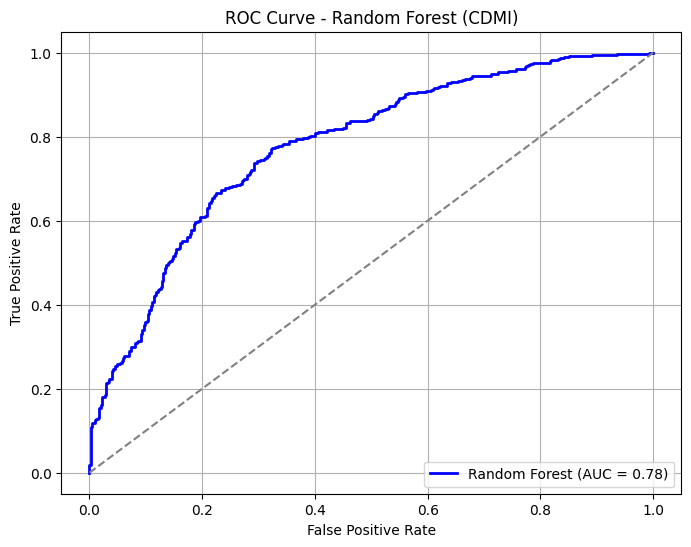

Random Forest Metrics for CDMI: 
AUC Score: 0.7781
Accuracy: 0.7228
F1 Score: 0.7282
Recall: 0.7426
Precision: 0.7143


In [ ]:
# Define unique feature (X) and target (y) variables for CDMI
X_RF_CDMI = dfcdmi.drop(columns=['CDMI', 'CDARREST'])
y_RF_CDMI = dfcdmi['CDMI']

# Define the objective function for Optuna to optimize Random Forest hyperparameters
def objective(trial):
    # Suggest hyperparameters for this trial
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])

    # Initialize Random Forest classifier with suggested hyperparameters
    rf_classifier_CDMI = RandomForestClassifier(
      n_estimators=n_estimators,
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      max_features=max_features,
      class_weight='balanced',
      random_state=42
  )

    # Perform K-Fold cross-validation (K=5)
    kf_RF_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob_RF_CDMI = cross_val_predict(rf_classifier_CDMI, X_RF_CDMI, y_RF_CDMI, cv=kf_RF_CDMI, method="predict_proba")[:, 1]

    # Compute AUC (ROC curve)
    fpr_RF_CDMI, tpr_RF_CDMI, _ = roc_curve(y_RF_CDMI, y_pred_prob_RF_CDMI)
    roc_auc_RF_CDMI = auc(fpr_RF_CDMI, tpr_RF_CDMI)

    # Return the AUC score as the objective for optimization
    return roc_auc_RF_CDMI

# Create and optimize the study using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters
print('Best hyperparameters: ', study.best_params)

# Use the best hyperparameters for the final Random Forest model
best_params = study.best_params
rf_classifier_CDMI = RandomForestClassifier(**best_params, random_state=42)

# Perform K-Fold cross-validation with the optimized model
kf_RF_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)
y_pred_prob_RF_CDMI = cross_val_predict(rf_classifier_CDMI, X_RF_CDMI, y_RF_CDMI, cv=kf_RF_CDMI, method="predict_proba")[:, 1]
y_pred_RF_CDMI = cross_val_predict(rf_classifier_CDMI, X_RF_CDMI, y_RF_CDMI, cv=kf_RF_CDMI, method="predict")

# Compute AUC (ROC curve)
fpr_RF_CDMI, tpr_RF_CDMI, _ = roc_curve(y_RF_CDMI, y_pred_prob_RF_CDMI)
roc_auc_RF_CDMI = auc(fpr_RF_CDMI, tpr_RF_CDMI)

# Compute additional metrics
accuracy_RF_CDMI = accuracy_score(y_RF_CDMI, y_pred_RF_CDMI)
f1_RF_CDMI = f1_score(y_RF_CDMI, y_pred_RF_CDMI)
recall_RF_CDMI = recall_score(y_RF_CDMI, y_pred_RF_CDMI)
precision_RF_CDMI = precision_score(y_RF_CDMI, y_pred_RF_CDMI)


# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_RF_CDMI, tpr_RF_CDMI, color='blue', lw=2, label=f'Random Forest (AUC = {roc_auc_RF_CDMI:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (CDMI)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print all metrics with unique variable names
print(f'Random Forest Metrics for CDMI: ')
print(f'AUC Score: {roc_auc_RF_CDMI:.4f}')
print(f'Accuracy: {accuracy_RF_CDMI:.4f}')
print(f'F1 Score: {f1_RF_CDMI:.4f}')
print(f'Recall: {recall_RF_CDMI:.4f}')
print(f'Precision: {precision_RF_CDMI:.4f}')

In [ ]:
rf_classifier_CDMI.fit(X_RF_CDMI, y_RF_CDMI)

RandomForestClassifier(max_depth=4, min_samples_leaf=2, min_samples_split=19,
                       n_estimators=91, random_state=42)

<Figure size 1800x600 with 0 Axes>

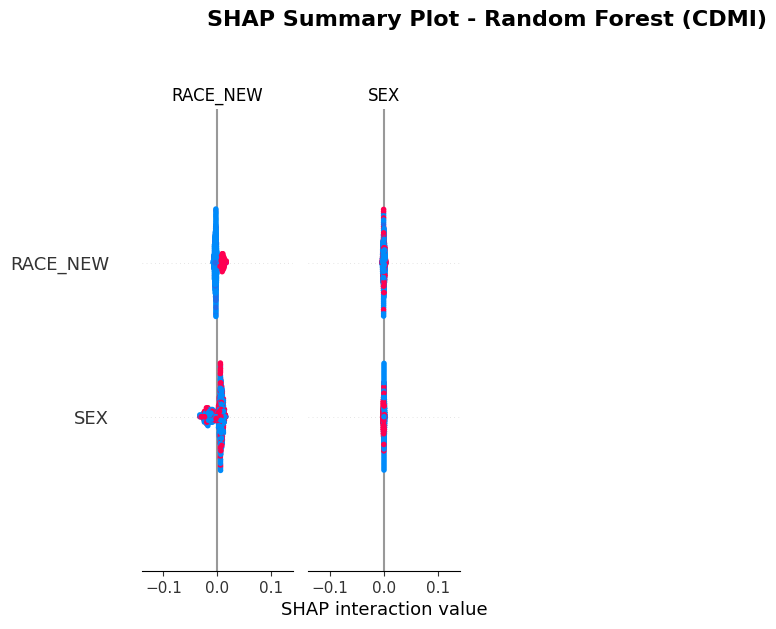

In [ ]:
# Use TreeExplainer which is optimized for tree-based models
explainer_RF_CDMI = shap.TreeExplainer(rf_classifier_CDMI)  # Pass the trained Random Forest model
shap_values_RF_CDMI = explainer_RF_CDMI.shap_values(X_RF_CDMI)  # Calculate SHAP values for the dataset

# Ensure feature names are correctly passed from your dataset
feature_names = X_RF_CDMI.columns  # Get feature names from dataset

# Plot SHAP summary plot
plt.figure(figsize=(18, 6))  # Adjusted width for better visibility
shap.summary_plot(shap_values_RF_CDMI, X_RF_CDMI, feature_names=feature_names, plot_size=(2, 0.5), show=False)

# Add title above the plot for better positioning
plt.suptitle("SHAP Summary Plot - Random Forest (CDMI)", fontsize=16, fontweight="bold", y=1.05)

# Adjust layout and margins to prevent overlap
plt.subplots_adjust(top=0.90, right=1.2, bottom=0.2, left=0.2)

# Show the plot
plt.show()

/usr/local/lib/python3.12/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.12/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.12/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

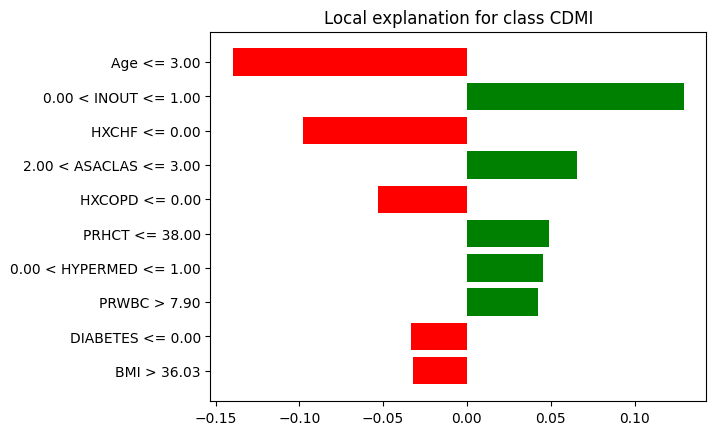

In [ ]:
# Initialize LIME Explainer for CDMI
lime_explainer_RF_CDMI = LimeTabularExplainer(
    training_data=X_RF_CDMI.values,  # Training data
    feature_names=X_RF_CDMI.columns.tolist(),  # Feature names
    class_names=['No CDMI', 'CDMI'],  # Class names (labels for the target variable)
    mode='classification'  # Mode is classification for the Random Forest model
)

# Randomly select an instance from the test data to explain
idx_RF_CDMI = np.random.randint(0, X_RF_CDMI.shape[0])
lime_exp_RF_CDMI = lime_explainer_RF_CDMI.explain_instance(
    X_RF_CDMI.iloc[idx_RF_CDMI],  # Instance to explain (using test data)
    rf_classifier_CDMI.predict_proba  # Use the Random Forest model to predict probabilities
)

# Show the explanation in the notebook
lime_exp_RF_CDMI.show_in_notebook()

# Plot the explanation as a figure
fig = lime_exp_RF_CDMI.as_pyplot_figure()
plt.show()

## Combined

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [ ]:
X_RF_CA_resampled = dfca.drop(['CDARREST','CDMI'], axis=1)
y_RF_CA_resampled = dfca['CDARREST']

X_RF_CDMI_resampled = dfcdmi.drop(['CDMI', 'CDARREST'], axis=1)
y_RF_CDMI_resampled = dfcdmi['CDMI']

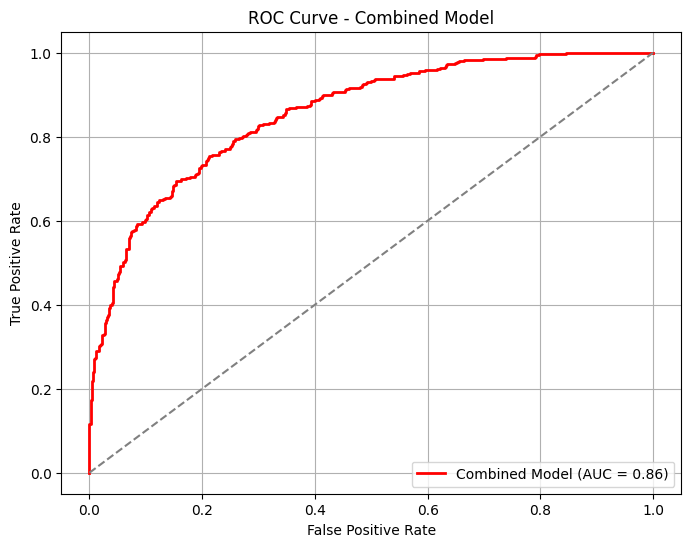

Combined Model Metrics: 
Accuracy: 0.7640
F1 Score: 0.7624
Recall: 0.7572
AUC Score: 0.8563
Precision: 0.7676


In [ ]:
# Combine the feature datasets
X_RF_Combined = np.concatenate((X_RF_CA_resampled, X_RF_CDMI_resampled), axis=0)
y_RF_Combined = np.concatenate((y_RF_CA_resampled, y_RF_CDMI_resampled), axis=0)

original_feature_names = X_RF_CA_resampled.columns.tolist()

# Convert the combined features into a DataFrame with the original feature names
X_RF_Combined_df = pd.DataFrame(X_RF_Combined, columns=original_feature_names)

# Combine the models using VotingClassifier
voting_classifier_RF_Combined = VotingClassifier(estimators=[
    ('rf_CA', rf_classifier_CA),  # Random Forest for CDARREST
    ('rf_CDMI', rf_classifier_CDMI)  # Random Forest for CDMI
], voting='soft')  # 'soft' voting uses predicted probabilities

# Fit the combined model using the resampled data
voting_classifier_RF_Combined.fit(X_RF_Combined, y_RF_Combined)

# Make predictions using the combined model
y_pred_combined_labels = voting_classifier_RF_Combined.predict(X_RF_Combined)

# Compute metrics for the combined model
accuracy_combined = accuracy_score(y_RF_Combined, y_pred_combined_labels)
f1_combined = f1_score(y_RF_Combined, y_pred_combined_labels)
recall_combined = recall_score(y_RF_Combined, y_pred_combined_labels)
precision_combined = precision_score(y_RF_Combined, y_pred_combined_labels)

# Compute the ROC curve and AUC for the combined model
y_pred_combined_prob = voting_classifier_RF_Combined.predict_proba(X_RF_Combined)[:, 1]
fpr_combined, tpr_combined, _ = roc_curve(y_RF_Combined, y_pred_combined_prob)
roc_auc_combined = auc(fpr_combined, tpr_combined)

# Plot ROC Curve for the combined model
plt.figure(figsize=(8, 6))
plt.plot(fpr_combined, tpr_combined, color='red', lw=2, label=f'Combined Model (AUC = {roc_auc_combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined Model')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print metrics for the combined model
print(f'Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined:.4f}')
print(f'F1 Score: {f1_combined:.4f}')
print(f'Recall: {recall_combined:.4f}')
print(f'AUC Score: {roc_auc_combined:.4f}')
print(f'Precision: {precision_combined:.4f}')

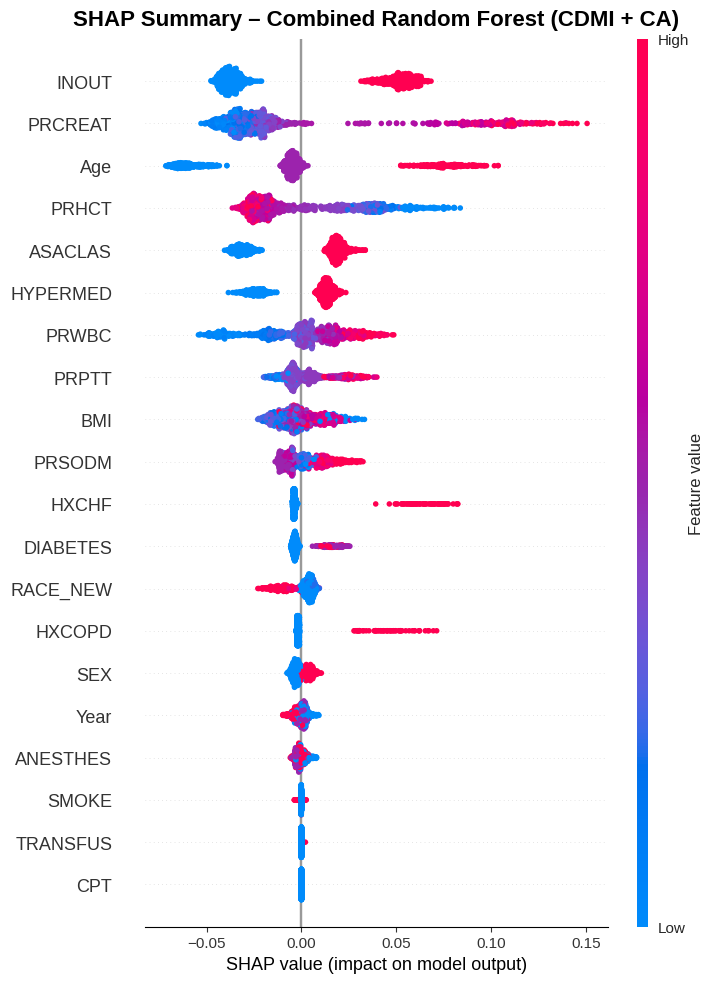

In [ ]:
plt.style.use('default')  # white background and default colors
fig, ax = plt.subplots(figsize=(8, 6), facecolor='white')
ax.set_facecolor('white')

# Combined SHAP beeswarm (CDMI + CA)
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt

# Ensure feature DataFrame has proper column names
X_RF_Combined_df = pd.DataFrame(X_RF_Combined, columns=X_RF_CA_resampled.columns)

# Get model-specific feature lists
ca_cols   = getattr(rf_classifier_CA, "feature_names_in_", X_RF_Combined_df.columns)
cdmi_cols = getattr(rf_classifier_CDMI, "feature_names_in_", X_RF_Combined_df.columns)

X_ca   = X_RF_Combined_df.reindex(columns=ca_cols, fill_value=0)
X_cdmi = X_RF_Combined_df.reindex(columns=cdmi_cols, fill_value=0)

# Background samples for TreeExplainer
bg_ca   = X_ca.sample(min(1000, len(X_ca)), random_state=42)
bg_cdmi = X_cdmi.sample(min(1000, len(X_cdmi)), random_state=42)

explainer_CA = shap.TreeExplainer(
    rf_classifier_CA, data=bg_ca, feature_perturbation="interventional", model_output="probability"
)
explainer_CDMI = shap.TreeExplainer(
    rf_classifier_CDMI, data=bg_cdmi, feature_perturbation="interventional", model_output="probability"
)

# Helper to select correct class SHAPs
def select_positive_class_shap(sv, model):
    if hasattr(model, "classes_"):
        if 1 in model.classes_:
            pos_idx = int(np.where(model.classes_ == 1)[0][0])
        else:
            pos_idx = len(model.classes_) - 1
    else:
        pos_idx = 1

    if isinstance(sv, list):
        return sv[pos_idx]
    sv = np.asarray(sv)
    if sv.ndim == 3 and sv.shape[2] >= 2:
        return sv[:, :, pos_idx]
    elif sv.ndim == 2:
        return sv
    else:
        raise ValueError(f"Unexpected SHAP shape: {sv.shape}")

# Compute SHAP values with relaxed additivity
sv_ca_raw   = explainer_CA.shap_values(X_ca,   check_additivity=False)
sv_cdmi_raw = explainer_CDMI.shap_values(X_cdmi, check_additivity=False)

sv_ca   = select_positive_class_shap(sv_ca_raw,   rf_classifier_CA)
sv_cdmi = select_positive_class_shap(sv_cdmi_raw, rf_classifier_CDMI)

# Convert to DataFrames
sv_ca_df   = pd.DataFrame(sv_ca,   columns=ca_cols,   index=X_RF_Combined_df.index)
sv_cdmi_df = pd.DataFrame(sv_cdmi, columns=cdmi_cols, index=X_RF_Combined_df.index)

# Align columns (union of both models' features)
all_cols = sorted(set(sv_ca_df.columns).union(set(sv_cdmi_df.columns)))
sv_ca_df   = sv_ca_df.reindex(columns=all_cols, fill_value=0.0)
sv_cdmi_df = sv_cdmi_df.reindex(columns=all_cols, fill_value=0.0)
X_for_plot = X_RF_Combined_df.reindex(columns=all_cols, fill_value=0.0)

# Combine (average SHAPs)
shap_values_combined = 0.5 * (sv_ca_df.values + sv_cdmi_df.values)

# Create beeswarm summary visual
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 12})

shap.summary_plot(
    shap_values_combined,
    X_for_plot,
    feature_names=all_cols,
    max_display=20,
    plot_size=(7.5, 10),
    show=False
)

plt.title("SHAP Summary – Combined Random Forest (CDMI + CA)", fontsize=16, fontweight="bold", pad=10)
plt.tight_layout()
plt.show()


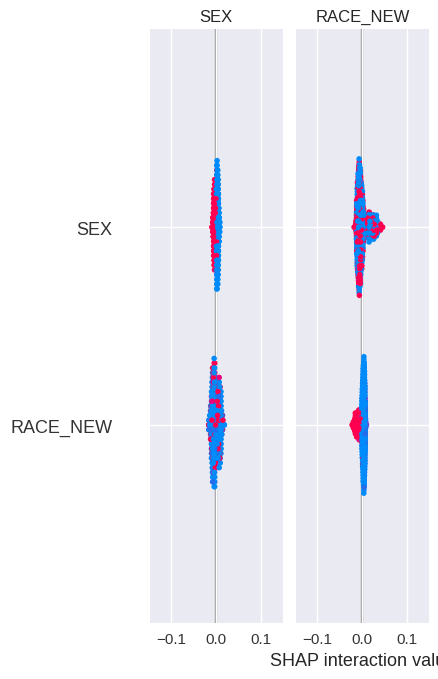

In [ ]:
# Create the DataFrame
X_RF_Combined_df = pd.DataFrame(X_RF_Combined, columns=X_RF_CA_resampled.columns)

# Create SHAP explainers for both Random Forest models
explainer_RF_CA = shap.TreeExplainer(rf_classifier_CA)
explainer_RF_CDMI = shap.TreeExplainer(rf_classifier_CDMI)

# Get SHAP values for both models on the combined dataset
shap_values_RF_CA = explainer_RF_CA.shap_values(X_RF_Combined)
shap_values_RF_CDMI = explainer_RF_CDMI.shap_values(X_RF_Combined)

# Combine the SHAP values from both models (average or other aggregation methods)
shap_values_Combined = (shap_values_RF_CA + shap_values_RF_CDMI) / 2

# Ensure the SHAP values have the same shape as the features matrix
assert shap_values_Combined.shape[1] == X_RF_Combined_df.shape[1], \
    f"Shape mismatch: SHAP values ({shap_values_Combined.shape[1]} features) and data ({X_RF_Combined_df.shape[1]} features)"

# Visualize SHAP values for the combined model
shap.summary_plot(shap_values_Combined, X_RF_Combined_df, plot_type="bar", title="SHAP Summary Plot - Combined Model")

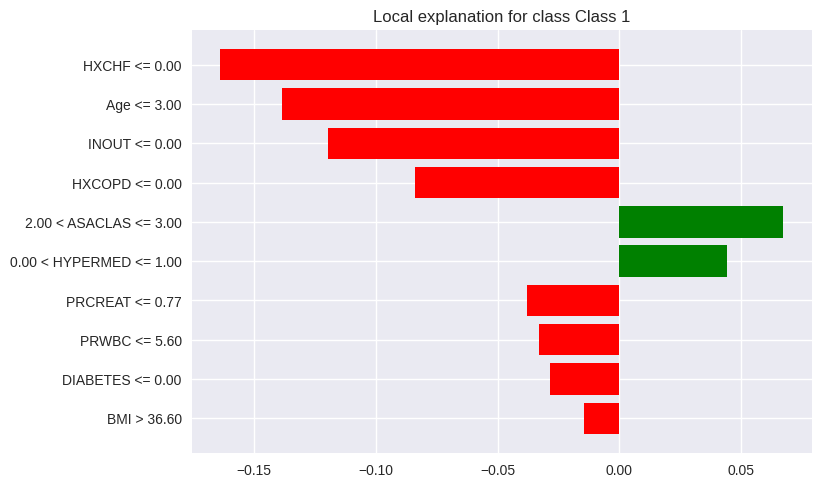

In [ ]:
# Create an explainer using LIME for the combined model
explainer_LIME = LimeTabularExplainer(
    training_data=X_RF_Combined_df.values,
    training_labels=y_RF_Combined,
    mode="classification",
    feature_names=X_RF_Combined_df.columns,
    class_names=["Class 0", "Class 1"],
    discretize_continuous=True
)

# Select an instance to explain
instance_to_explain_RF = X_RF_Combined_df.iloc[10]

# Create a prediction function that works for the combined model
def predict_combined(X):
    return voting_classifier_RF_Combined.predict_proba(X)

# Get explanation from LIME for the selected instance
explanation_RF = explainer_LIME.explain_instance(
    instance_to_explain_RF.values,
    predict_combined,
    num_features=10
)

# Display explanation in Jupyter Notebook
explanation_RF.show_in_notebook(show_table=True, show_all=False)

# Visualize the explanation for the selected instance
explanation_RF.as_pyplot_figure()
plt.show()

# Random Forest w/ OOB

## Cardiac Arrest

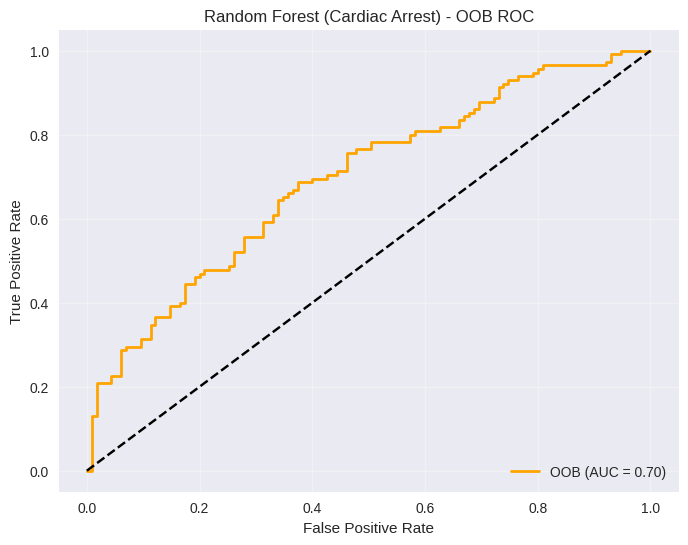


=== Out-of-Bag (OOB) Metrics ===
OOB AUC       : 0.6958
OOB Accuracy  : 0.6348
OOB Precision : 0.6449
OOB Recall    : 0.6000
OOB F1 Score  : 0.6216


In [ ]:
# Out-of-Bag (OOB) Evaluation
from sklearn.metrics import roc_auc_score

# Fit the final OOB model
rf_oob = RandomForestClassifier(
    **best_params,
    class_weight='balanced',
    oob_score=True,     # Enable OOB evaluation
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)
rf_oob.fit(X_RF_CA, y_RF_CA)

# Extract OOB probabilities (for AUC)
oob_dec = rf_oob.oob_decision_function_
if oob_dec.ndim == 2 and oob_dec.shape[1] >= 2:
    y_oob_prob = oob_dec[:, 1]
else:
    y_oob_prob = oob_dec.ravel()

# Handle missing OOB predictions
mask_valid = ~np.isnan(y_oob_prob)
y_true_valid = y_RF_CA[mask_valid]
y_oob_prob_valid = y_oob_prob[mask_valid]
y_oob_pred_valid = (y_oob_prob_valid >= 0.5).astype(int)

# OOB metrics
oob_auc = roc_auc_score(y_true_valid, y_oob_prob_valid)
oob_acc = accuracy_score(y_true_valid, y_oob_pred_valid)
oob_prec = precision_score(y_true_valid, y_oob_pred_valid, zero_division=0)
oob_rec = recall_score(y_true_valid, y_oob_pred_valid, zero_division=0)
oob_f1 = f1_score(y_true_valid, y_oob_pred_valid, zero_division=0)

# ROC curve for OOB
fpr_oob, tpr_oob, _ = roc_curve(y_true_valid, y_oob_prob_valid)
plt.figure(figsize=(8, 6))
plt.plot(fpr_oob, tpr_oob, lw=2, color='orange', label=f'OOB (AUC = {oob_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Random Forest (Cardiac Arrest) - OOB ROC")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

# Print metrics
print("\n=== Out-of-Bag (OOB) Metrics ===")
print(f"OOB AUC       : {oob_auc:.4f}")
print(f"OOB Accuracy  : {oob_acc:.4f}")
print(f"OOB Precision : {oob_prec:.4f}")
print(f"OOB Recall    : {oob_rec:.4f}")
print(f"OOB F1 Score  : {oob_f1:.4f}")


## CDMI


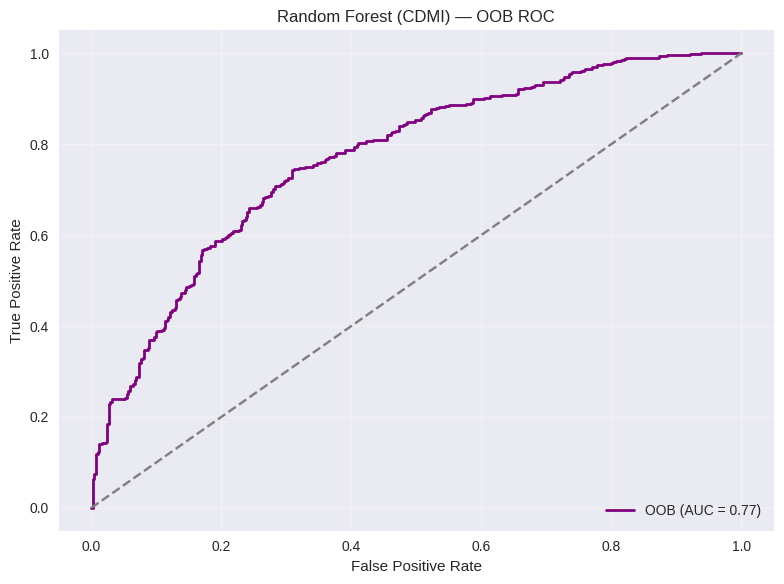


=== OOB Metrics (CDMI) ===
OOB AUC       : 0.7705
OOB Accuracy  : 0.7129
OOB Precision : 0.7038
OOB Recall    : 0.7351
OOB F1 Score  : 0.7191


In [ ]:
from sklearn.metrics import roc_auc_score

# Fit final model with OOB enabled
rf_oob = RandomForestClassifier(
    **best_params,
    class_weight='balanced',
    oob_score=True,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)
rf_oob.fit(X_RF_CDMI, y_RF_CDMI)

# OOB probabilities for positive class
oob_dec = getattr(rf_oob, "oob_decision_function_", None)
if oob_dec is None:
    raise RuntimeError("OOB decision function not available. Ensure bootstrap=True and sufficient trees/samples.")

if oob_dec.ndim == 2 and oob_dec.shape[1] >= 2:
    y_prob_oob = oob_dec[:, 1]
else:
    y_prob_oob = oob_dec.ravel()

# Handle any NaNs (samples without OOB votes)
mask_valid = ~np.isnan(y_prob_oob)
if mask_valid.sum() < len(y_prob_oob):
    print(f"[OOB] Excluding {len(y_prob_oob) - mask_valid.sum()} samples with no OOB estimate.")

y_true_oob = np.asarray(y_RF_CDMI)[mask_valid]
y_prob_oob = y_prob_oob[mask_valid]
y_pred_oob = (y_prob_oob >= 0.5).astype(int)

# OOB metrics
auc_oob  = roc_auc_score(y_true_oob, y_prob_oob)
acc_oob  = accuracy_score(y_true_oob, y_pred_oob)
prec_oob = precision_score(y_true_oob, y_pred_oob, zero_division=0)
rec_oob  = recall_score(y_true_oob, y_pred_oob, zero_division=0)
f1_oob   = f1_score(y_true_oob, y_pred_oob, zero_division=0)

# OOB ROC curve
fpr_oob, tpr_oob, _ = roc_curve(y_true_oob, y_prob_oob)
plt.figure(figsize=(8, 6))
plt.plot(fpr_oob, tpr_oob, lw=2, color='purple', label=f'OOB (AUC = {auc_oob:.2f})')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('Random Forest (CDMI) — OOB ROC')
plt.legend(loc='lower right'); plt.grid(alpha=0.3); plt.tight_layout()
plt.show()

# Print OOB metrics
print("\n=== OOB Metrics (CDMI) ===")
print(f"OOB AUC       : {auc_oob:.4f}")
print(f"OOB Accuracy  : {acc_oob:.4f}")
print(f"OOB Precision : {prec_oob:.4f}")
print(f"OOB Recall    : {rec_oob:.4f}")
print(f"OOB F1 Score  : {f1_oob:.4f}")


## Combined

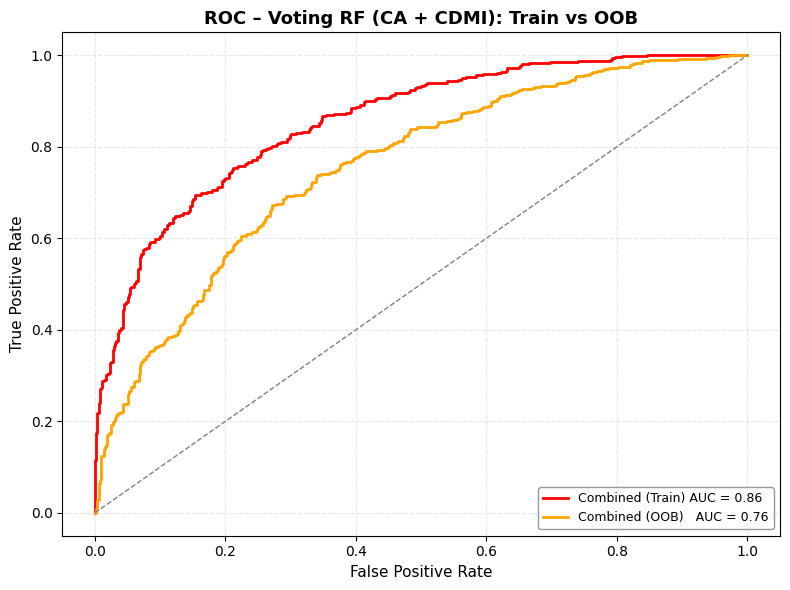

=== Combined Voting RF (Train/In-sample) Metrics ===
Accuracy : 0.7640
Precision: 0.7676
Recall   : 0.7572
F1 Score : 0.7624
AUC      : 0.8563

=== Combined Voting RF (OOB) Metrics ===
OOB Accuracy : 0.6908
OOB Precision: 0.6897
OOB Recall   : 0.6936
OOB F1 Score : 0.6916
OOB AUC      : 0.7575


In [ ]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, f1_score, recall_score, precision_score
from sklearn.base import clone
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Prepare data
X_RF_CA_resampled  = dfca.drop(['CDARREST','CDMI'], axis=1)
y_RF_CA_resampled  = dfca['CDARREST']

X_RF_CDMI_resampled = dfcdmi.drop(['CDMI', 'CDARREST'], axis=1)
y_RF_CDMI_resampled = dfcdmi['CDMI']

# Combine datasets
X_RF_Combined = np.concatenate((X_RF_CA_resampled, X_RF_CDMI_resampled), axis=0)
y_RF_Combined = np.concatenate((y_RF_CA_resampled, y_RF_CDMI_resampled), axis=0)

original_feature_names = X_RF_CA_resampled.columns.tolist()
X_RF_Combined_df = pd.DataFrame(X_RF_Combined, columns=original_feature_names)

# Build base RFs with OOB enabled
try:
    rf_ca_base   = clone(rf_classifier_CA)
except NameError:
    rf_ca_base = RandomForestClassifier(n_estimators=300, class_weight='balanced', random_state=42, n_jobs=-1)

try:
    rf_cdmi_base = clone(rf_classifier_CDMI)
except NameError:
    rf_cdmi_base = RandomForestClassifier(n_estimators=300, class_weight='balanced', random_state=42, n_jobs=-1)

# Ensure OOB is on for both (required for OOB analysis)
rf_ca_base.set_params(oob_score=True, bootstrap=True, n_jobs=-1, random_state=42)
rf_cdmi_base.set_params(oob_score=True, bootstrap=True, n_jobs=-1, random_state=42)

# VotingClassifier (soft voting to average probabilities)
voting_classifier_RF_Combined = VotingClassifier(
    estimators=[('rf_CA', rf_ca_base), ('rf_CDMI', rf_cdmi_base)],
    voting='soft'
)

# Fit on the combined data
voting_classifier_RF_Combined.fit(X_RF_Combined_df, y_RF_Combined)

# Training metrics for the combined model
y_pred_combined_labels = voting_classifier_RF_Combined.predict(X_RF_Combined_df)
y_pred_combined_prob   = voting_classifier_RF_Combined.predict_proba(X_RF_Combined_df)[:, 1]

accuracy_combined = accuracy_score(y_RF_Combined, y_pred_combined_labels)
f1_combined       = f1_score(y_RF_Combined, y_pred_combined_labels)
recall_combined   = recall_score(y_RF_Combined, y_pred_combined_labels)
precision_combined= precision_score(y_RF_Combined, y_pred_combined_labels)
fpr_combined, tpr_combined, _ = roc_curve(y_RF_Combined, y_pred_combined_prob)
roc_auc_combined  = auc(fpr_combined, tpr_combined)

# OOB analysis for the combined model
rf_ca_fitted   = voting_classifier_RF_Combined.named_estimators_['rf_CA']
rf_cdmi_fitted = voting_classifier_RF_Combined.named_estimators_['rf_CDMI']

oob_ca   = getattr(rf_ca_fitted,   "oob_decision_function_", None)
oob_cdmi = getattr(rf_cdmi_fitted, "oob_decision_function_", None)
if oob_ca is None or oob_cdmi is None:
    raise RuntimeError("OOB decision function missing. Ensure both base RFs have bootstrap=True and oob_score=True.")

# Get positive-class probabilities from OOB decision functions
def _to_pos_prob(oob_dec):
    if oob_dec.ndim == 2 and oob_dec.shape[1] >= 2:
        return oob_dec[:, 1]
    return oob_dec.ravel()

oob_ca_prob   = _to_pos_prob(oob_ca)
oob_cdmi_prob = _to_pos_prob(oob_cdmi)

mask_valid = (~np.isnan(oob_ca_prob)) & (~np.isnan(oob_cdmi_prob))
if mask_valid.sum() < len(y_RF_Combined):
    print(f"[OOB] Excluding {len(y_RF_Combined) - mask_valid.sum()} samples without complete OOB estimates.")

y_true_oob      = np.asarray(y_RF_Combined)[mask_valid]
oob_ca_prob     = oob_ca_prob[mask_valid]
oob_cdmi_prob   = oob_cdmi_prob[mask_valid]

# Soft-voted combined OOB probability
oob_combined_prob = 0.5 * (oob_ca_prob + oob_cdmi_prob)
oob_combined_pred = (oob_combined_prob >= 0.5).astype(int)

# OOB metrics
oob_auc  = roc_auc_score(y_true_oob, oob_combined_prob)
oob_acc  = accuracy_score(y_true_oob, oob_combined_pred)
oob_prec = precision_score(y_true_oob, oob_combined_pred, zero_division=0)
oob_rec  = recall_score(y_true_oob, oob_combined_pred, zero_division=0)
oob_f1   = f1_score(y_true_oob, oob_combined_pred, zero_division=0)
oob_fpr, oob_tpr, _ = roc_curve(y_true_oob, oob_combined_prob)

# Plot Style
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 6), facecolor='white')
ax.set_facecolor('white')

# ROC and OOB ROC
ax.plot(fpr_combined, tpr_combined, color='red', lw=2, label=f'Combined (Train) AUC = {roc_auc_combined:.2f}')
ax.plot(oob_fpr,      oob_tpr,      color='orange', lw=2, label=f'Combined (OOB)   AUC = {oob_auc:.2f}')
ax.plot([0,1],[0,1], '--', color='gray', lw=1)

ax.set_xlabel('False Positive Rate', fontsize=11)
ax.set_ylabel('True Positive Rate', fontsize=11)
ax.set_title('ROC – Voting RF (CA + CDMI): Train vs OOB', fontsize=13, fontweight='bold')
ax.legend(loc='lower right', fontsize=9, frameon=True, facecolor='white', edgecolor='gray')
ax.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# 7) Print metrics
print("=== Combined Voting RF (Train/In-sample) Metrics ===")
print(f"Accuracy : {accuracy_combined:.4f}")
print(f"Precision: {precision_combined:.4f}")
print(f"Recall   : {recall_combined:.4f}")
print(f"F1 Score : {f1_combined:.4f}")
print(f"AUC      : {roc_auc_combined:.4f}")

print("\n=== Combined Voting RF (OOB) Metrics ===")
print(f"OOB Accuracy : {oob_acc:.4f}")
print(f"OOB Precision: {oob_prec:.4f}")
print(f"OOB Recall   : {oob_rec:.4f}")
print(f"OOB F1 Score : {oob_f1:.4f}")
print(f"OOB AUC      : {oob_auc:.4f}")

Uncertainty

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Retrieve data
labels = ["OOB_CA", "OOB_CDMI", "Weighted_OOB", "CV_Accuracy"]
values = [oob_acc_ca, oob_acc_cdmi, weighted_oob, cv_acc]

# Style
plt.style.use('default')   # ensures default white background
fig, ax = plt.subplots(figsize=(8, 5), facecolor='white')  # explicitly white background

# Bar chart
x = np.arange(len(labels))
bars = ax.bar(x, values, color=['#1f77b4', '#1f77b4', '#1f77b4', '#1f77b4'])

# Annotate values on bars
for b in bars:
    h = b.get_height()
    ax.text(b.get_x() + b.get_width()/2, h + 0.01, f"{h:.3f}", ha='center', va='bottom', fontsize=10)

# Customize axes and labels
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylim(0, 1.05)
ax.set_ylabel("Accuracy", fontsize=12)
ax.set_title("Model Performance Comparison",
             fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3, linestyle='--')

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()

NameError: name 'oob_acc_ca' is not defined

[found] OOB_CA from 'oob_acc' = 0.8043
[found] OOB_CDMI from 'acc_oob' = 0.7351
[found] n_CA from 'y_RF_CA' = 230
[found] n_CDMI from 'y_RF_CDMI' = 808
[calc ] Weighted_OOB = 0.7505
[found] CV_Accuracy from 'accuracy_RF_CDMI' = 0.7587


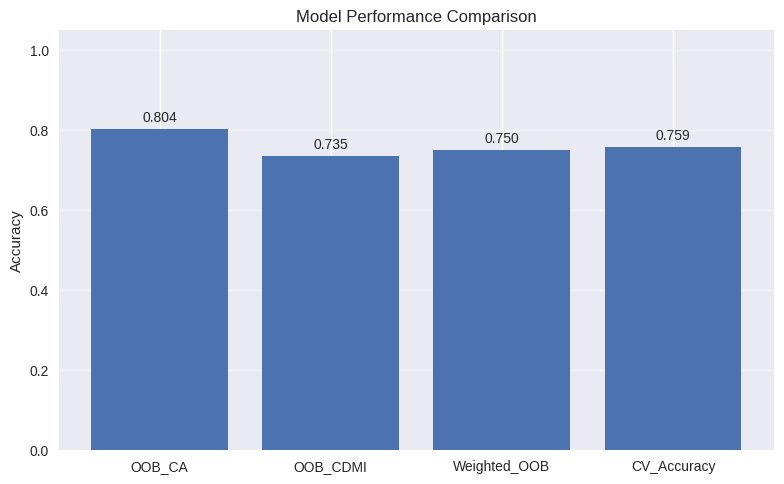

In [ ]:
# Model performance comparison: OOB_CA vs OOB_CDMI vs Weighted_OOB vs CV_Accuracy
import matplotlib.pyplot as plt
import numpy as np

def _get_first_defined(name_list, default=None):
    g = globals()
    for n in name_list:
        if n in g and g[n] is not None:
            return g[n], n
    return default, None

# Pull OOB accuracies from previously run cells
#    CA OOB accuracy
oob_acc_ca, src_ca = _get_first_defined(['oob_acc', 'oob_acc_ca', 'acc_oob_ca'])

#    CDMI OOB accuracy
oob_acc_cdmi, src_cdmi = _get_first_defined(['acc_oob', 'oob_acc_cdmi'])

if oob_acc_ca is None or oob_acc_cdmi is None:
    missing = []
    if oob_acc_ca is None:   missing.append("OOB accuracy for CA (e.g., 'oob_acc')")
    if oob_acc_cdmi is None: missing.append("OOB accuracy for CDMI (e.g., 'acc_oob')")
    raise RuntimeError("Missing required metric(s): " + ", ".join(missing))

print(f"[found] OOB_CA from '{src_ca}' = {oob_acc_ca:.4f}")
print(f"[found] OOB_CDMI from '{src_cdmi}' = {oob_acc_cdmi:.4f}")

# Dataset sizes for weighting
def _len_safe(candidates):
    val, src = _get_first_defined(candidates)
    if val is not None:
        return len(val), src
    return None, None

n_ca, n_src_ca = _len_safe(['y_RF_CA'])
if n_ca is None:
    n_ca, n_src_ca = _len_safe(['dfca'])
if n_ca is None:
    raise RuntimeError("Couldn't infer sample size for CA (need 'y_RF_CA' or 'dfca').")

n_cdmi, n_src_cdmi = _len_safe(['y_RF_CDMI'])
if n_cdmi is None:
    n_cdmi, n_src_cdmi = _len_safe(['dfcdmi'])
if n_cdmi is None:
    raise RuntimeError("Couldn't infer sample size for CDMI (need 'y_RF_CDMI' or 'dfcdmi').")

print(f"[found] n_CA from '{n_src_ca}' = {n_ca}")
print(f"[found] n_CDMI from '{n_src_cdmi}' = {n_cdmi}")

# Weighted OOB accuracy
weighted_oob = (oob_acc_ca * n_ca + oob_acc_cdmi * n_cdmi) / (n_ca + n_cdmi)
print(f"[calc ] Weighted_OOB = {weighted_oob:.4f}")

# Get a CV accuracy from earlier code (tries several common variable names)
cv_acc, src_cv = _get_first_defined([
    'acc_cv',
    'accuracy_RF_CDMI',
    'accuracy_RF_CA',
    'accuracy'
])

if cv_acc is None:
    print("[warn ] Could not find a CV accuracy variable (e.g., 'acc_cv' or 'accuracy_RF_CDMI'). "
          "Only OOB metrics will be plotted.")
    labels = ["OOB_CA", "OOB_CDMI", "Weighted_OOB"]
    values = [oob_acc_ca, oob_acc_cdmi, weighted_oob]
else:
    print(f"[found] CV_Accuracy from '{src_cv}' = {cv_acc:.4f}")
    labels = ["OOB_CA", "OOB_CDMI", "Weighted_OOB", "CV_Accuracy"]
    values = [oob_acc_ca, oob_acc_cdmi, weighted_oob, cv_acc]

# Plot bar chart
plt.figure(figsize=(8, 5))
x = np.arange(len(labels))
bars = plt.bar(x, values)

# Annotate bars with values
for b in bars:
    h = b.get_height()
    plt.text(b.get_x() + b.get_width()/2, h + 0.01, f"{h:.3f}", ha='center', va='bottom', fontsize=10)

plt.xticks(x, labels, rotation=0)
plt.ylim(0, 1.05)
plt.ylabel("Accuracy")
plt.title("Model Performance Comparison")
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


# XGBoost

## Cardiac Arrest

In [ ]:
from sklearn.model_selection import StratifiedKFold

[I 2025-12-13 19:54:15,672] A new study created in memory with name: no-name-eff74843-1f81-4095-85c2-3c9e36f8e902
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytre

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:16,325] Trial 0 finished with value: 0.6574669187145558 and parameters: {'max_depth': 7, 'learning_rate': 0.032391612729043236, 'n_estimators': 192, 'subsample': 0.7578004720634018, 'colsample_bytree': 0.8357741081172936}. Best is trial 0 with value: 0.6574669187145558.


Training fold 5
Training fold 1


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:16,884] Trial 1 finished with value: 0.6620037807183364 and parameters: {'max_depth': 9, 'learning_rate': 1.4859102639669551e-05, 'n_estimators': 184, 'subsample': 0.5839373894575781, 'colsample_bytree': 0.9511148454541997}. Best is trial 1 with value: 0.6620037807183364.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uni

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:17,966] Trial 2 finished with value: 0.6453686200378073 and parameters: {'max_depth': 9, 'learning_rate': 0.001638858679773626, 'n_estimators': 145, 'subsample': 0.8450396848843584, 'colsample_bytree': 0.8349651884843408}. Best is trial 1 with value: 0.6620037807183364.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_unifo

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:19,325] Trial 3 finished with value: 0.6574669187145558 and parameters: {'max_depth': 10, 'learning_rate': 0.0004979304663987727, 'n_estimators': 68, 'subsample': 0.5880674732595527, 'colsample_bytree': 0.9191960448664929}. Best is trial 1 with value: 0.6620037807183364.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_unif

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:21,027] Trial 4 finished with value: 0.6483931947069943 and parameters: {'max_depth': 8, 'learning_rate': 4.311493080108872e-05, 'n_estimators': 185, 'subsample': 0.8527659219868734, 'colsample_bytree': 0.9436347235890954}. Best is trial 1 with value: 0.6620037807183364.


Training fold 5


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:21,531] Trial 5 finished with value: 0.639319470699433 and parameters: {'max_depth': 6, 'learning_rate': 0.011907157073553538, 'n_estimators': 100, 'subsample': 0.8234968959105489, 'colsample_bytree': 0.9099115675287718}. Best is trial 1 with value: 0.6620037807183364.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_unifor

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-13 19:54:21,935] Trial 6 finished with value: 0.6468809073724008 and parameters: {'max_depth': 5, 'learning_rate': 0.03875441708639708, 'n_estimators': 146, 'subsample': 0.9537612047089595, 'colsample_bytree': 0.6489446142353519}. Best is trial 1 with value: 0.6620037807183364.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:22,488] Trial 7 finished with value: 0.6589792060491494 and parameters: {'max_depth': 10, 'learning_rate': 0.044455900201995864, 'n_estimators': 198, 'subsample': 0.5668519245466597, 'colsample_bytree': 0.8975200799969671}. Best is trial 1 with value: 0.6620037807183364.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_unif

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:22,833] Trial 8 finished with value: 0.6555765595463139 and parameters: {'max_depth': 9, 'learning_rate': 0.0015283086775345518, 'n_estimators': 84, 'subsample': 0.7314184198272546, 'colsample_bytree': 0.7170664246976912}. Best is trial 1 with value: 0.6620037807183364.


Training fold 5
Training fold 1
Training fold 2


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:23,239] Trial 9 finished with value: 0.6438563327032136 and parameters: {'max_depth': 9, 'learning_rate': 0.0012859845569923823, 'n_estimators': 135, 'subsample': 0.5128040764244899, 'colsample_bytree': 0.580923138101026}. Best is trial 1 with value: 0.6620037807183364.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_unifo

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-13 19:54:23,657] Trial 10 finished with value: 0.6729678638941399 and parameters: {'max_depth': 3, 'learning_rate': 1.0477437242637995e-05, 'n_estimators': 171, 'subsample': 0.6539643622169575, 'colsample_bytree': 0.7698335340632396}. Best is trial 10 with value: 0.6729678638941399.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:24,043] Trial 11 finished with value: 0.6621928166351607 and parameters: {'max_depth': 3, 'learning_rate': 1.7562435082798625e-05, 'n_estimators': 166, 'subsample': 0.6511302130453166, 'colsample_bytree': 0.7606269501149341}. Best is trial 10 with value: 0.6729678638941399.


Training fold 5
Training fold 1
Training fold 2


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:54:24,420] Trial 12 finished with value: 0.6646502835538752 and parameters: {'max_depth': 3, 'learning_rate': 8.360538028804778e-05, 'n_estimators': 163, 'subsample': 0.6701898647983612, 'colsample_bytree': 0.7562942056219438}. Best is trial 10 with value: 0.6729678638941399.
/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_un

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:24,754] Trial 13 finished with value: 0.6725897920604915 and parameters: {'max_depth': 3, 'learning_rate': 0.00010389991285077388, 'n_estimators': 114, 'subsample': 0.6805047166807779, 'colsample_bytree': 0.7349394789844625}. Best is trial 10 with value: 0.6729678638941399.


Training fold 5
Training fold 1
Training fold 2
Training fold 3


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree
[I 2025-12-13 19:54:25,078] Tria

Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:25,437] Trial 15 finished with value: 0.6612476370510396 and parameters: {'max_depth': 4, 'learning_rate': 0.0003177826463883188, 'n_estimators': 119, 'subsample': 0.7459671282988662, 'colsample_bytree': 0.6814986921622175}. Best is trial 10 with value: 0.6729678638941399.


Training fold 5
Training fold 1
Training fold 2
Training fold 3


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree
[I 2025-12-13 19:54:25,743] Tria

Training fold 4
Training fold 5
Training fold 1
Training fold 2


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree
[I 2025-12-13 19:54:26,066] Tria

Training fold 3
Training fold 4
Training fold 5


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 1
Training fold 2
Training fold 3


[I 2025-12-13 19:54:26,441] Trial 18 finished with value: 0.6502835538752363 and parameters: {'max_depth': 3, 'learning_rate': 4.380671239203082e-05, 'n_estimators': 159, 'subsample': 0.927148286034107, 'colsample_bytree': 0.7896297490730034}. Best is trial 10 with value: 0.6729678638941399.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-35206224.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
/tmp/ipython-input-35206224.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
/tmp/ipython-input-35206224.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:54:26,880] Trial 19 finished with value: 0.6449905482041588 and parameters: {'max_depth': 6, 'learning_rate': 0.00475344120222648, 'n_estimators': 124, 'subsample': 0.7069910090636521, 'colsample_bytree': 0.7139884171143555}. Best is trial 10 with value: 0.6729678638941399.


Training fold 5
Best hyperparameters: {'max_depth': 3, 'learning_rate': 1.0477437242637995e-05, 'n_estimators': 171, 'subsample': 0.6539643622169575, 'colsample_bytree': 0.7698335340632396}
Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5

Average accuracy from 5-fold cross-validation: 0.6565
Average precision: 0.7289
Average recall: 0.4957
Average F1 score: 0.5813
Average AUC-ROC: 0.6730


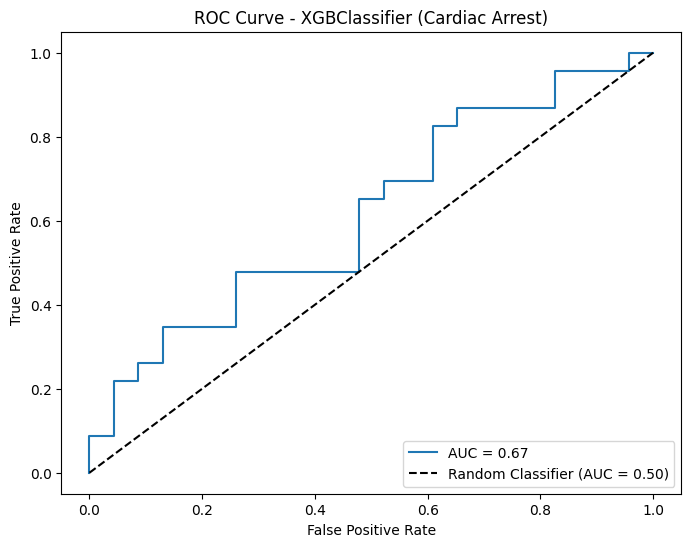

In [ ]:
# Define objective function for Optuna
def objective_XG_CA(trial):
    # Hyperparameter search space for XGBoost
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'max_depth': trial.suggest_int('max_depth', 3, 10),  # Tuning max_depth
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),  # Log scale for learning_rate
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),  # Number of estimators
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),  # Subsample ratio
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),  # Column sample by tree
        'verbosity': 0  # Silent mode
    }

    # Initialize StratifiedKFold with 5 splits
    kf_XG_CA = StratifiedKFold(n_splits=5, shuffle=False)

    # Store metrics for each fold
    fold_accuracies_XG_CA = []
    fold_precisions_XG_CA = []
    fold_recalls_XG_CA = []
    fold_f1_scores_XG_CA = []
    fold_roc_auc_XG_CA = []

    # Loop over each split
    for fold_idx, (train_index, test_index) in enumerate(kf_XG_CA.split(X_RF_CA, y_RF_CA)):
        print(f"Training fold {fold_idx + 1}")

        # Split data into training and test sets for this fold
        X_train_XG_CA, X_test_XG_CA = X_RF_CA.iloc[train_index], X_RF_CA.iloc[test_index]
        y_train_XG_CA, y_test_XG_CA = y_RF_CA.iloc[train_index], y_RF_CA.iloc[test_index]

        # Initialize the XGBClassifier with tuned hyperparameters
        xgb_classifier_XG_CA = xgb.XGBClassifier(**param)

        # Train the XGBoost model
        xgb_classifier_XG_CA.fit(X_train_XG_CA, y_train_XG_CA)

        # Make predictions on the test set
        y_pred_XG_CA = xgb_classifier_XG_CA.predict(X_test_XG_CA)
        y_pred_prob_XG_CA = xgb_classifier_XG_CA.predict_proba(X_test_XG_CA)[:, 1]  # Probabilities for AUC-ROC

        # Evaluate the model
        accuracy_XG_CA = accuracy_score(y_test_XG_CA, y_pred_XG_CA)
        precision_XG_CA = precision_score(y_test_XG_CA, y_pred_XG_CA)
        recall_XG_CA = recall_score(y_test_XG_CA, y_pred_XG_CA)
        f1_XG_CA = f1_score(y_test_XG_CA, y_pred_XG_CA)
        roc_auc_XG_CA = roc_auc_score(y_test_XG_CA, y_pred_prob_XG_CA)

        # Store metrics for this fold
        fold_accuracies_XG_CA.append(accuracy_XG_CA)
        fold_precisions_XG_CA.append(precision_XG_CA)
        fold_recalls_XG_CA.append(recall_XG_CA)
        fold_f1_scores_XG_CA.append(f1_XG_CA)
        fold_roc_auc_XG_CA.append(roc_auc_XG_CA)

    # Calculate the average metrics across all folds
    avg_accuracy_XG_CA = np.mean(fold_accuracies_XG_CA)
    avg_precision_XG_CA = np.mean(fold_precisions_XG_CA)
    avg_recall_XG_CA = np.mean(fold_recalls_XG_CA)
    avg_f1_XG_CA = np.mean(fold_f1_scores_XG_CA)
    avg_roc_auc_XG_CA = np.mean(fold_roc_auc_XG_CA)

    return avg_roc_auc_XG_CA  # Optimizing for AUC-ROC

# Run Optuna optimization to find the best hyperparameters
study_XG_CA = optuna.create_study(direction='maximize')
study_XG_CA.optimize(objective_XG_CA, n_trials=20)

# Print best hyperparameters
print("Best hyperparameters:", study_XG_CA.best_params)

# Now best hyperparameters found by Optuna to train the model
best_params_XG_CA = study_XG_CA.best_params

# Initialize StratifiedKFold with 5 splits
kf_XG_CA = StratifiedKFold(n_splits=5, shuffle=False)

# Store metrics for each fold
fold_accuracies_XG_CA = []
fold_precisions_XG_CA = []
fold_recalls_XG_CA = []
fold_f1_scores_XG_CA = []
fold_roc_auc_XG_CA = []

# Loop over each split
for fold_idx, (train_index, test_index) in enumerate(kf_XG_CA.split(X_RF_CA, y_RF_CA)):
    print(f"Training fold {fold_idx + 1}")

    # Split data into training and test sets for this fold
    X_train_XG_CA, X_test_XG_CA = X_RF_CA.iloc[train_index], X_RF_CA.iloc[test_index]
    y_train_XG_CA, y_test_XG_CA = y_RF_CA.iloc[train_index], y_RF_CA.iloc[test_index]

    # Initialize the XGBClassifier with the best hyperparameters
    xgb_classifier_XG_CA = xgb.XGBClassifier(**best_params_XG_CA)

    # Train the XGBoost model
    xgb_classifier_XG_CA.fit(X_train_XG_CA, y_train_XG_CA)

    # Make predictions on the test set
    y_pred_XG_CA = xgb_classifier_XG_CA.predict(X_test_XG_CA)
    y_pred_prob_XG_CA = xgb_classifier_XG_CA.predict_proba(X_test_XG_CA)[:, 1]  # Probabilities for AUC-ROC

    # Evaluate the model
    accuracy_XG_CA = accuracy_score(y_test_XG_CA, y_pred_XG_CA)
    precision_XG_CA = precision_score(y_test_XG_CA, y_pred_XG_CA)
    recall_XG_CA = recall_score(y_test_XG_CA, y_pred_XG_CA)
    f1_XG_CA = f1_score(y_test_XG_CA, y_pred_XG_CA)
    roc_auc_XG_CA = roc_auc_score(y_test_XG_CA, y_pred_prob_XG_CA)

    # Store metrics for this fold
    fold_accuracies_XG_CA.append(accuracy_XG_CA)
    fold_precisions_XG_CA.append(precision_XG_CA)
    fold_recalls_XG_CA.append(recall_XG_CA)
    fold_f1_scores_XG_CA.append(f1_XG_CA)
    fold_roc_auc_XG_CA.append(roc_auc_XG_CA)

# Calculate the average metrics across all folds
avg_accuracy_XG_CA = np.mean(fold_accuracies_XG_CA)
avg_precision_XG_CA = np.mean(fold_precisions_XG_CA)
avg_recall_XG_CA = np.mean(fold_recalls_XG_CA)
avg_f1_XG_CA = np.mean(fold_f1_scores_XG_CA)
avg_roc_auc_XG_CA = np.mean(fold_roc_auc_XG_CA)

print(f"\nAverage accuracy from 5-fold cross-validation: {avg_accuracy_XG_CA:.4f}")
print(f"Average precision: {avg_precision_XG_CA:.4f}")
print(f"Average recall: {avg_recall_XG_CA:.4f}")
print(f"Average F1 score: {avg_f1_XG_CA:.4f}")
print(f"Average AUC-ROC: {avg_roc_auc_XG_CA:.4f}")

# Plot AUC-ROC curve
fpr_XG_CA, tpr_XG_CA, _ = roc_curve(y_test_XG_CA, y_pred_prob_XG_CA)
plt.figure(figsize=(8, 6))
plt.plot(fpr_XG_CA, tpr_XG_CA, label=f'AUC = {avg_roc_auc_XG_CA:.2f}')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBClassifier (Cardiac Arrest)')
plt.legend(loc='lower right')
plt.show()

PermutationExplainer explainer: 47it [00:21,  2.08it/s]
/tmp/ipython-input-382503578.py:24: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


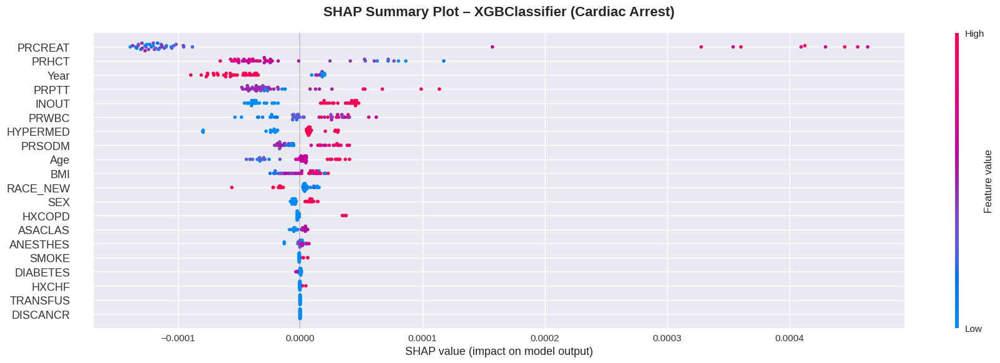

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Style
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 12})

X_bg = X_train_XG_CA
if hasattr(X_bg, "sample") and len(X_bg) > 500:
    X_bg = X_bg.sample(500, random_state=42)

# Prediction function returning probabilities
f = lambda X: xgb_classifier_XG_CA.predict_proba(X)[:, 1]

# Model-agnostic explainer (PermutationExplainer)
explainer_XG_CA = shap.Explainer(f, X_bg, algorithm="permutation")

# Compute SHAP values on test data
X_display = X_test_XG_CA
shap_values_XG_CA = explainer_XG_CA(X_display)

# Plot SHAP summary
shap.summary_plot(
    shap_values_XG_CA,
    X_display,
    feature_names=getattr(X_display, "columns", None),
    plot_size=(18, 6),
    show=False
)

plt.title("SHAP Summary Plot – XGBClassifier (Cardiac Arrest)", fontsize=16, fontweight="bold", pad=20)
plt.tight_layout()
plt.show()


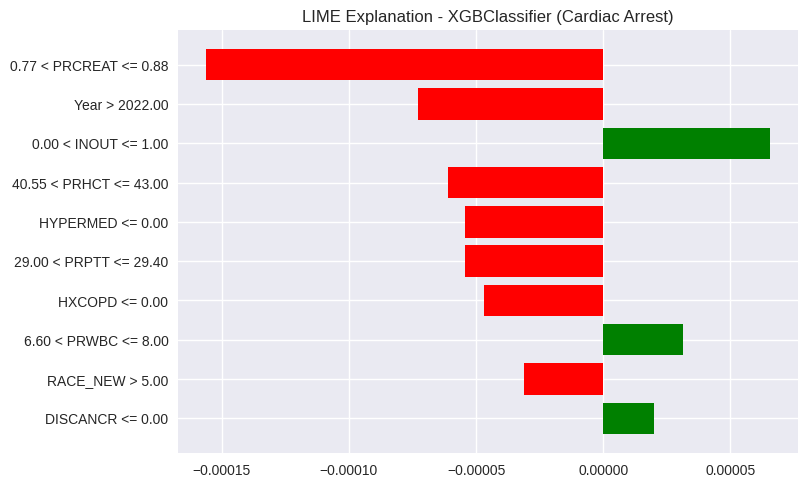

In [ ]:
# Initialize the LIME explainer for the XGBClassifier
lime_explainer_XG_CA = LimeTabularExplainer(
    training_data=X_train_XG_CA.values,
    feature_names=X_train_XG_CA.columns.tolist(),
    class_names=['No Arrest', 'Arrest'],
    mode='classification',
    discretize_continuous=True
)

# Select an instance from the test data to explain
idx_XG_CA = np.random.randint(0, X_test_XG_CA.shape[0])
instance_to_explain = X_test_XG_CA.iloc[idx_XG_CA]

# Explain the instance using LIME
lime_exp_XG_CA = lime_explainer_XG_CA.explain_instance(
    instance_to_explain.values,
    xgb_classifier_XG_CA.predict_proba
)

# Show the explanation in the notebook
lime_exp_XG_CA.show_in_notebook()

# Plot the explanation as a figure
fig = lime_exp_XG_CA.as_pyplot_figure()
plt.title("LIME Explanation - XGBClassifier (Cardiac Arrest)")
plt.show()

## CDMI

[I 2025-12-13 19:56:52,509] A new study created in memory with name: no-name-b49bac0f-0186-43de-a9f0-e954c5d82f2a
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:56:57,847] Trial 0 finished with value: 0.6955052583447646 and parameters: {'max_depth': 9, 'learning_rate': 0.03425603903954028, 'n_estimators': 165, 'subsample': 0.9676282572192898, 'colsample_bytree': 0.66513771675835}. Best is trial 0 with value: 0.6955052583447646.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
[I 2025-12-13 19:56:59,636] Trial 1 finished with value: 0.7170667581161407 and parameters: {'max_depth': 9, 'learning_rate': 2.1051720805333348e-05, 'n_estimators': 87, 'subsample': 0.5642441721107232, 'colsample_bytree': 0.7042132816382883}. Best is trial 1 with value: 0.7170667581161407.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecate

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:57:00,442] Trial 2 finished with value: 0.7310413808870599 and parameters: {'max_depth': 4, 'learning_rate': 0.000149330825639203, 'n_estimators': 106, 'subsample': 0.5233789964075841, 'colsample_bytree': 0.787221576914175}. Best is trial 2 with value: 0.7310413808870599.


Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:57:01,954] Trial 3 finished with value: 0.7113511659807955 and parameters: {'max_depth': 8, 'learning_rate': 0.002592715443083408, 'n_estimators': 62, 'subsample': 0.9201337450770317, 'colsample_bytree': 0.8254610369277806}. Best is trial 2 with value: 0.7310413808870599.


Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:03,271] Trial 4 finished with value: 0.7192901234567901 and parameters: {'max_depth': 7, 'learning_rate': 0.006041283456491262, 'n_estimators': 199, 'subsample': 0.8453227946351864, 'colsample_bytree': 0.6927869168820421}. Best is trial 2 with value: 0.7310413808870599.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature 

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:04,072] Trial 5 finished with value: 0.7277568206066147 and parameters: {'max_depth': 6, 'learning_rate': 0.007313414159204426, 'n_estimators': 103, 'subsample': 0.835740130338404, 'colsample_bytree': 0.6452275773880617}. Best is trial 2 with value: 0.7310413808870599.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature w

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:06,548] Trial 6 finished with value: 0.7114925316262765 and parameters: {'max_depth': 9, 'learning_rate': 0.00032032422120538515, 'n_estimators': 78, 'subsample': 0.5232857217247393, 'colsample_bytree': 0.8111763719465938}. Best is trial 2 with value: 0.7310413808870599.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:57:07,486] Trial 7 finished with value: 0.7299763755525073 and parameters: {'max_depth': 4, 'learning_rate': 0.00494303169899479, 'n_estimators': 114, 'subsample': 0.8457384326322785, 'colsample_bytree': 0.9017530613799998}. Best is trial 2 with value: 0.7310413808870599.


Training fold 5


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 1
Training fold 2
Training fold 3


[I 2025-12-13 19:57:08,124] Trial 8 finished with value: 0.7191483767718336 and parameters: {'max_depth': 7, 'learning_rate': 0.0016599048321404815, 'n_estimators': 64, 'subsample': 0.9359246192821196, 'colsample_bytree': 0.5987760666668076}. Best is trial 2 with value: 0.7310413808870599.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:09,636] Trial 9 finished with value: 0.7183112330437433 and parameters: {'max_depth': 10, 'learning_rate': 8.09975940550724e-05, 'n_estimators': 196, 'subsample': 0.7879620873529525, 'colsample_bytree': 0.5478936683639043}. Best is trial 2 with value: 0.7310413808870599.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature

Training fold 1
Training fold 2
Training fold 3


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
[I 2025-12-13 19:57:10,101] Trial 10 finished with value: 0.7311869379667733 and parameters: {'max_depth': 3, 'learning_rate': 1.1215722422444084e-05, 'n_estimators': 143, 'subsample': 0.6507282254923756, 'colsample_bytree': 0.9725254685508978}. Best is trial 10 with value: 0.7311869379667733.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
[I 2025-12-13 19:57:10,560] Trial 11 finished with value: 0.7292135345221765 and parameters: {'max_depth': 3, 'learning_rate': 1.0619898580104391e-05, 'n_estimators': 143, 'subsample': 0.6411702011729565, 'colsample_bytree': 0.9718851602406173}. Best is trial 10 with value: 0.7311869379667733.


Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:11,242] Trial 12 finished with value: 0.7223144337753392 and parameters: {'max_depth': 5, 'learning_rate': 0.00016396543827686743, 'n_estimators': 141, 'subsample': 0.6600027166094026, 'colsample_bytree': 0.9968675496976762}. Best is trial 10 with value: 0.7311869379667733.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feat

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-13 19:57:11,653] Trial 13 finished with value: 0.7375758268556621 and parameters: {'max_depth': 3, 'learning_rate': 4.3588257230983784e-05, 'n_estimators': 128, 'subsample': 0.6553980575248581, 'colsample_bytree': 0.8149140508692094}. Best is trial 13 with value: 0.7375758268556621.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3


[I 2025-12-13 19:57:12,178] Trial 14 finished with value: 0.7317080094497791 and parameters: {'max_depth': 3, 'learning_rate': 3.7451700952749624e-05, 'n_estimators': 162, 'subsample': 0.6840111199281736, 'colsample_bytree': 0.9054768266023554}. Best is trial 13 with value: 0.7375758268556621.


Training fold 4
Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:12,962] Trial 15 finished with value: 0.725752552964487 and parameters: {'max_depth': 5, 'learning_rate': 4.938591676091461e-05, 'n_estimators': 170, 'subsample': 0.6999632212688578, 'colsample_bytree': 0.8667283844626502}. Best is trial 13 with value: 0.7375758268556621.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This featur

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-13 19:57:13,453] Trial 16 finished with value: 0.7354656302392928 and parameters: {'max_depth': 3, 'learning_rate': 0.0002974838758300979, 'n_estimators': 172, 'subsample': 0.7429754942529886, 'colsample_bytree': 0.9042436500494281}. Best is trial 13 with value: 0.7375758268556621.


Training fold 4
Training fold 5


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:57:14,091] Trial 17 finished with value: 0.7379606767261089 and parameters: {'max_depth': 4, 'learning_rate': 0.0005774137241432236, 'n_estimators': 181, 'subsample': 0.7453094446210663, 'colsample_bytree': 0.7484331991297978}. Best is trial 17 with value: 0.7379606767261089.


Training fold 5
Training fold 1


/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-13 19:57:14,654] Trial 18 finished with value: 0.7288401158360006 and parameters: {'max_depth': 5, 'learning_rate': 0.0010375821863108402, 'n_estimators': 126, 'subsample': 0.5973231745276374, 'colsample_bytree': 0.7426716448190952}. Best is trial 17 with value: 0.7379606767261089.
/tmp/ipython-input-580820992.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
/tmp/ipython-input-580820992.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipython-input-580820992.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This featu

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-13 19:57:15,250] Trial 19 finished with value: 0.6708607681755829 and parameters: {'max_depth': 4, 'learning_rate': 0.0992891028014236, 'n_estimators': 181, 'subsample': 0.7513370782844794, 'colsample_bytree': 0.7557629817517195}. Best is trial 17 with value: 0.7379606767261089.


Training fold 5
Best hyperparameters: {'max_depth': 4, 'learning_rate': 0.0005774137241432236, 'n_estimators': 181, 'subsample': 0.7453094446210663, 'colsample_bytree': 0.7484331991297978}
Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5

Average accuracy from 5-fold cross-validation: 0.6720
Average precision: 0.6871
Average recall: 0.6286
Average F1 score: 0.6550
Average AUC-ROC: 0.7380


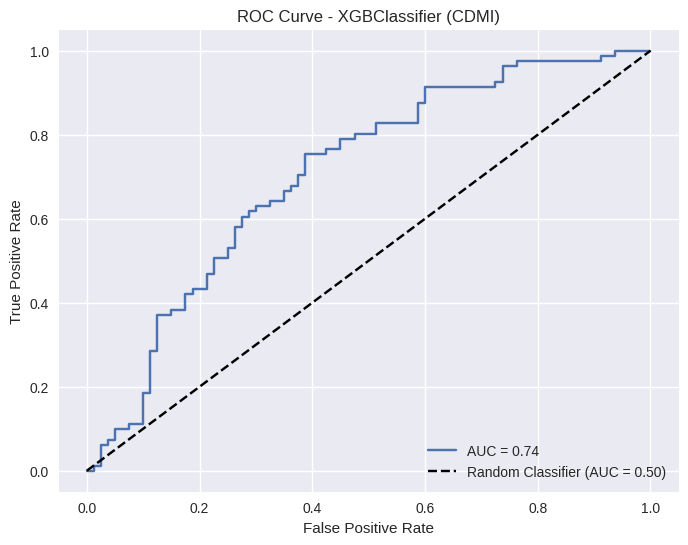

In [ ]:
# Define objective function for Optuna
def objective_XG_CDMI(trial):
    # Hyperparameter search space for XGBoost
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'verbosity': 0
    }

    # Initialize StratifiedKFold with 5 splits
    kf_XG_CDMI = StratifiedKFold(n_splits=5, shuffle=False)

    # Store metrics for each fold
    fold_accuracies_XG_CDMI = []
    fold_precisions_XG_CDMI = []
    fold_recalls_XG_CDMI = []
    fold_f1_scores_XG_CDMI = []
    fold_roc_auc_XG_CDMI = []

    # Loop over each split
    for fold_idx, (train_index, test_index) in enumerate(kf_XG_CDMI.split(X_RF_CDMI, y_RF_CDMI)):
        print(f"Training fold {fold_idx + 1}")

        # Split data into training and test sets for this fold
        X_train_XG_CDMI, X_test_XG_CDMI = X_RF_CDMI.iloc[train_index], X_RF_CDMI.iloc[test_index]
        y_train_XG_CDMI, y_test_XG_CDMI = y_RF_CDMI.iloc[train_index], y_RF_CDMI.iloc[test_index]

        # Initialize the XGBClassifier with tuned hyperparameters
        xgb_classifier_XG_CDMI = xgb.XGBClassifier(**param)

        # Train the XGBoost model
        xgb_classifier_XG_CDMI.fit(X_train_XG_CDMI, y_train_XG_CDMI)

        # Make predictions on the test set
        y_pred_XG_CDMI = xgb_classifier_XG_CDMI.predict(X_test_XG_CDMI)
        y_pred_prob_XG_CDMI = xgb_classifier_XG_CDMI.predict_proba(X_test_XG_CDMI)[:, 1]  # Probabilities for AUC-ROC

        # Evaluate the model
        accuracy_XG_CDMI = accuracy_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        precision_XG_CDMI = precision_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        recall_XG_CDMI = recall_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        f1_XG_CDMI = f1_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        roc_auc_XG_CDMI = roc_auc_score(y_test_XG_CDMI, y_pred_prob_XG_CDMI)

        # Store metrics for this fold
        fold_accuracies_XG_CDMI.append(accuracy_XG_CDMI)
        fold_precisions_XG_CDMI.append(precision_XG_CDMI)
        fold_recalls_XG_CDMI.append(recall_XG_CDMI)
        fold_f1_scores_XG_CDMI.append(f1_XG_CDMI)
        fold_roc_auc_XG_CDMI.append(roc_auc_XG_CDMI)

    # Calculate the average metrics across all folds
    avg_accuracy_XG_CDMI = np.mean(fold_accuracies_XG_CDMI)
    avg_precision_XG_CDMI = np.mean(fold_precisions_XG_CDMI)
    avg_recall_XG_CDMI = np.mean(fold_recalls_XG_CDMI)
    avg_f1_XG_CDMI = np.mean(fold_f1_scores_XG_CDMI)
    avg_roc_auc_XG_CDMI = np.mean(fold_roc_auc_XG_CDMI)

    return avg_roc_auc_XG_CDMI  # Optimizing for AUC-ROC

# Run Optuna optimization to find the best hyperparameters
study_XG_CDMI = optuna.create_study(direction='maximize')
study_XG_CDMI.optimize(objective_XG_CDMI, n_trials=20)

# Print the best hyperparameters
print("Best hyperparameters:", study_XG_CDMI.best_params)

best_params_XG_CDMI = study_XG_CDMI.best_params

# Initialize StratifiedKFold with 5 splits
kf_XG_CDMI = StratifiedKFold(n_splits=5, shuffle=False)

# Store metrics for each fold
fold_accuracies_XG_CDMI = []
fold_precisions_XG_CDMI = []
fold_recalls_XG_CDMI = []
fold_f1_scores_XG_CDMI = []
fold_roc_auc_XG_CDMI = []

# Loop over each split
for fold_idx, (train_index, test_index) in enumerate(kf_XG_CDMI.split(X_RF_CDMI, y_RF_CDMI)):
    print(f"Training fold {fold_idx + 1}")

    # Split data into training and test sets for this fold
    X_train_XG_CDMI, X_test_XG_CDMI = X_RF_CDMI.iloc[train_index], X_RF_CDMI.iloc[test_index]
    y_train_XG_CDMI, y_test_XG_CDMI = y_RF_CDMI.iloc[train_index], y_RF_CDMI.iloc[test_index]

    # Initialize the XGBClassifier with the best hyperparameters
    xgb_classifier_XG_CDMI = xgb.XGBClassifier(**best_params_XG_CDMI)

    # Train the XGBoost model
    xgb_classifier_XG_CDMI.fit(X_train_XG_CDMI, y_train_XG_CDMI)

    # Make predictions on the test set
    y_pred_XG_CDMI = xgb_classifier_XG_CDMI.predict(X_test_XG_CDMI)
    y_pred_prob_XG_CDMI = xgb_classifier_XG_CDMI.predict_proba(X_test_XG_CDMI)[:, 1]  # Probabilities for AUC-ROC

    # Evaluate the model
    accuracy_XG_CDMI = accuracy_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    precision_XG_CDMI = precision_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    recall_XG_CDMI = recall_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    f1_XG_CDMI = f1_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    roc_auc_XG_CDMI = roc_auc_score(y_test_XG_CDMI, y_pred_prob_XG_CDMI)

    # Store metrics for this fold
    fold_accuracies_XG_CDMI.append(accuracy_XG_CDMI)
    fold_precisions_XG_CDMI.append(precision_XG_CDMI)
    fold_recalls_XG_CDMI.append(recall_XG_CDMI)
    fold_f1_scores_XG_CDMI.append(f1_XG_CDMI)
    fold_roc_auc_XG_CDMI.append(roc_auc_XG_CDMI)

# Calculate the average metrics across all folds
avg_accuracy_XG_CDMI = np.mean(fold_accuracies_XG_CDMI)
avg_precision_XG_CDMI = np.mean(fold_precisions_XG_CDMI)
avg_recall_XG_CDMI = np.mean(fold_recalls_XG_CDMI)
avg_f1_XG_CDMI = np.mean(fold_f1_scores_XG_CDMI)
avg_roc_auc_XG_CDMI = np.mean(fold_roc_auc_XG_CDMI)

print(f"\nAverage accuracy from 5-fold cross-validation: {avg_accuracy_XG_CDMI:.4f}")
print(f"Average precision: {avg_precision_XG_CDMI:.4f}")
print(f"Average recall: {avg_recall_XG_CDMI:.4f}")
print(f"Average F1 score: {avg_f1_XG_CDMI:.4f}")
print(f"Average AUC-ROC: {avg_roc_auc_XG_CDMI:.4f}")

# Plot AUC-ROC curve
fpr_XG_CDMI, tpr_XG_CDMI, _ = roc_curve(y_test_XG_CDMI, y_pred_prob_XG_CDMI)
plt.figure(figsize=(8, 6))
plt.plot(fpr_XG_CDMI, tpr_XG_CDMI, label=f'AUC = {avg_roc_auc_XG_CDMI:.2f}')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBClassifier (CDMI)')
plt.legend(loc='lower right')
plt.show()

PermutationExplainer explainer: 162it [00:31,  3.77it/s]
/tmp/ipython-input-2667306753.py:25: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


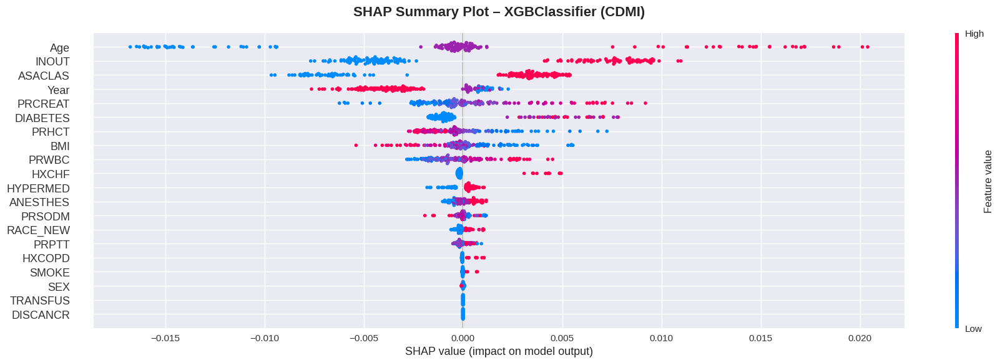

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Plot style
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 12})

# Background data for SHAP
X_bg = X_train_XG_CDMI
if hasattr(X_bg, "sample") and len(X_bg) > 500:
    X_bg = X_bg.sample(500, random_state=42)

# Prediction function returning class-1 probability
predict_fn = lambda X: xgb_classifier_XG_CDMI.predict_proba(X)[:, 1]

# Model-agnostic SHAP explainer
explainer_XG_CDMI = shap.Explainer(predict_fn, X_bg, algorithm="permutation")

# Compute SHAP values for the test split from the last fold
X_display = X_test_XG_CDMI
shap_values_XG_CDMI = explainer_XG_CDMI(X_display)

# Summary plot
shap.summary_plot(
    shap_values_XG_CDMI,
    X_display,
    feature_names=getattr(X_display, "columns", None),
    plot_size=(18, 6),
    show=False
)

plt.title("SHAP Summary Plot – XGBClassifier (CDMI)", fontsize=16, fontweight="bold", pad=20)
plt.tight_layout()
plt.show()


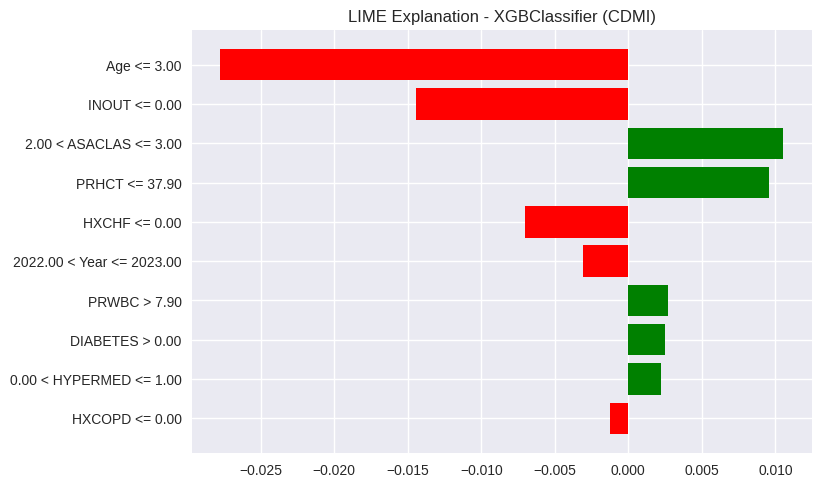

In [ ]:
# Initialize the LIME for the XGBClassifier
lime_explainer_XG_CDMI = LimeTabularExplainer(
    training_data=X_train_XG_CDMI.values,
    feature_names=X_train_XG_CDMI.columns.tolist(),
    class_names=['No CDMI', 'CDMI'],
    mode='classification',
    discretize_continuous=True
)

idx_XG_CDMI = np.random.randint(0, X_test_XG_CDMI.shape[0])
instance_to_explain = X_test_XG_CDMI.iloc[idx_XG_CDMI]

# Explain instance using LIME
lime_exp_XG_CDMI = lime_explainer_XG_CDMI.explain_instance(
    instance_to_explain.values,
    xgb_classifier_XG_CDMI.predict_proba
)

# Show the explanation in the notebook
lime_exp_XG_CDMI.show_in_notebook()

# Plot the explanation as a figure
fig = lime_exp_XG_CDMI.as_pyplot_figure()
plt.title("LIME Explanation - XGBClassifier (CDMI)")
plt.show()

## Combined

In [ ]:
from sklearn.utils import resample

In [ ]:
X_XG_CA_resampled, y_XG_CA_resampled = resample(dfca.drop(columns=['CDARREST', 'CDMI']),
                                                  dfca['CDARREST'],
                                                  replace=True,
                                                  n_samples=1000,
                                                  random_state=42)

X_XG_CDMI_resampled, y_XG_CDMI_resampled = resample(dfcdmi.drop(columns=['CDMI', 'CDARREST']),
                                                    dfcdmi['CDMI'],
                                                    replace=True,
                                                    n_samples=1000,
                                                    random_state=42)

# Combine the resampled data
X_XG_Combined = pd.concat([X_XG_CA_resampled, X_XG_CDMI_resampled], axis=0)
y_XG_Combined = pd.concat([y_XG_CA_resampled, y_XG_CDMI_resampled], axis=0)

# Ensure the combined data has consistent feature names
original_feature_names_XG = X_XG_CA_resampled.columns.tolist()

# Convert the combined features into a DataFrame with original feature names
X_XG_Combined_df = pd.DataFrame(X_XG_Combined, columns=original_feature_names_XG)

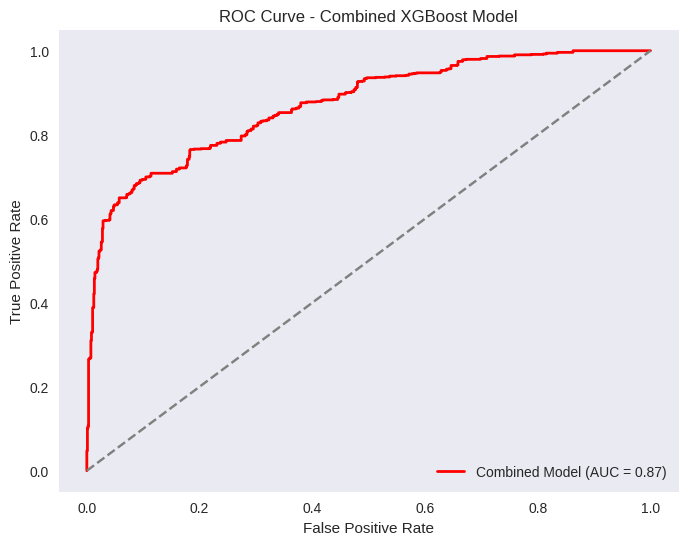

Combined Model Metrics: 
Accuracy: 0.5990
F1 Score: 0.7176
Recall: 0.9941
Precision: 0.5614
AUC Score: 0.8720


In [ ]:
xg_classifier_CA = xgb.XGBClassifier(**best_params_XG_CA)
xg_classifier_CDMI = xgb.XGBClassifier(**best_params_XG_CDMI)

# Extract feature names
original_feature_names_XG = X_XG_CA_resampled.columns.tolist()
X_XG_Combined_df = pd.DataFrame(X_XG_Combined, columns=original_feature_names_XG)

# Combine the models using VotingClassifier
voting_classifier_XG_Combined = VotingClassifier(estimators=[
    ('xg_CA', xg_classifier_CA),
    ('xg_CDMI', xg_classifier_CDMI)
], voting='soft')

# Fit the combined model using resampled data
voting_classifier_XG_Combined.fit(X_XG_Combined, y_XG_Combined)

# Make predictions using the combined model
y_pred_combined_labels_XG_Combined = voting_classifier_XG_Combined.predict(X_XG_Combined)

# Compute metrics for the combined model
accuracy_combined_XG_Combined = accuracy_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)
f1_combined_XG_Combined = f1_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)
recall_combined_XG_Combined = recall_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)
precision_combined_XG_Combined = precision_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)

# Compute the ROC curve and AUC for the combined model
y_pred_combined_prob_XG_Combined = voting_classifier_XG_Combined.predict_proba(X_XG_Combined)[:, 1]
fpr_combined_XG_Combined, tpr_combined_XG_Combined, _ = roc_curve(y_XG_Combined, y_pred_combined_prob_XG_Combined)
roc_auc_combined_XG_Combined = auc(fpr_combined_XG_Combined, tpr_combined_XG_Combined)

# Plot ROC Curve for the combined model
plt.figure(figsize=(8, 6))
plt.plot(fpr_combined_XG_Combined, tpr_combined_XG_Combined, color='red', lw=2, label=f'Combined Model (AUC = {roc_auc_combined_XG_Combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined XGBoost Model')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print metrics for the combined model
print(f'Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined_XG_Combined:.4f}')
print(f'F1 Score: {f1_combined_XG_Combined:.4f}')
print(f'Recall: {recall_combined_XG_Combined:.4f}')
print(f'Precision: {precision_combined_XG_Combined:.4f}')
print(f'AUC Score: {roc_auc_combined_XG_Combined:.4f}')

PermutationExplainer explainer: 162it [00:31,  3.12it/s]
/tmp/ipython-input-1214762242.py:22: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(
/tmp/ipython-input-1214762242.py:22: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


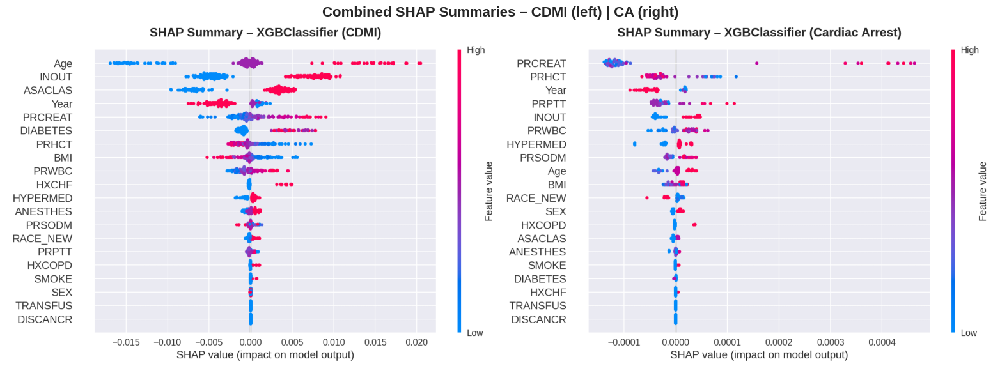

Saved combined figure to: shap_summary_combined.png


In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 12})

def make_shap_summary_image(model, X_train, X_test, title, out_path, bg_max=500):
    X_bg = X_train
    if hasattr(X_bg, "sample") and len(X_bg) > bg_max:
        X_bg = X_bg.sample(bg_max, random_state=42)

    # Prediction function class-1 probability
    predict_fn = lambda X: model.predict_proba(X)[:, 1]

    # Model-agnostic explainer
    explainer = shap.Explainer(predict_fn, X_bg, algorithm="permutation")
    shap_values = explainer(X_test)

    # Plot
    shap.summary_plot(
        shap_values,
        X_test,
        feature_names=getattr(X_test, "columns", None),
        plot_size=(9, 6),
        show=False
    )
    plt.title(title, fontsize=15, fontweight="bold", pad=16)
    plt.tight_layout()
    plt.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.close()

make_shap_summary_image(
    xgb_classifier_XG_CDMI, X_train_XG_CDMI, X_test_XG_CDMI,
    "SHAP Summary – XGBClassifier (CDMI)",
    "shap_cdmi.png"
)
make_shap_summary_image(
    xgb_classifier_XG_CA, X_train_XG_CA, X_test_XG_CA,
    "SHAP Summary – XGBClassifier (Cardiac Arrest)",
    "shap_ca.png"
)

img_left = Image.open("shap_cdmi.png")
img_right = Image.open("shap_ca.png")

h = max(img_left.height, img_right.height)
def resize_to_height(img, new_h):
    w = int(img.width * (new_h / img.height))
    return img.resize((w, new_h), Image.BICUBIC)

img_left = resize_to_height(img_left, h)
img_right = resize_to_height(img_right, h)

combined = Image.new("RGB", (img_left.width + img_right.width, h), (255, 255, 255))
combined.paste(img_left, (0, 0))
combined.paste(img_right, (img_left.width, 0))
combined_path = "shap_summary_combined.png"
combined.save(combined_path, "PNG")

# Show combined image in the notebook
plt.figure(figsize=(18, 6))
plt.imshow(combined)
plt.axis("off")
plt.title("Combined SHAP Summaries – CDMI (left) | CA (right)", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

print(f"Saved combined figure to: {combined_path}")


# Logistic Regression

## Cardiac Arrest

[I 2025-12-13 20:05:58,298] A new study created in memory with name: no-name-d7d6b50e-cf64-4e42-acdb-9f3832c99660
/tmp/ipython-input-3347861099.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)
[I 2025-12-13 20:05:58,372] Trial 0 finished with value: 0.686578449905482 and parameters: {'C': 2.5390706631386206, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.686578449905482.
/tmp/ipython-input-3347861099.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)
[I 2025-12-13 20:05:58,454] Trial 1 finished with value: 0.6873345935727787 and parameters: {'C': 2.1403361424666087, 'solver'

Best hyperparameters for Logistic Regression: {'C': 0.10238719866680338, 'solver': 'lbfgs'}


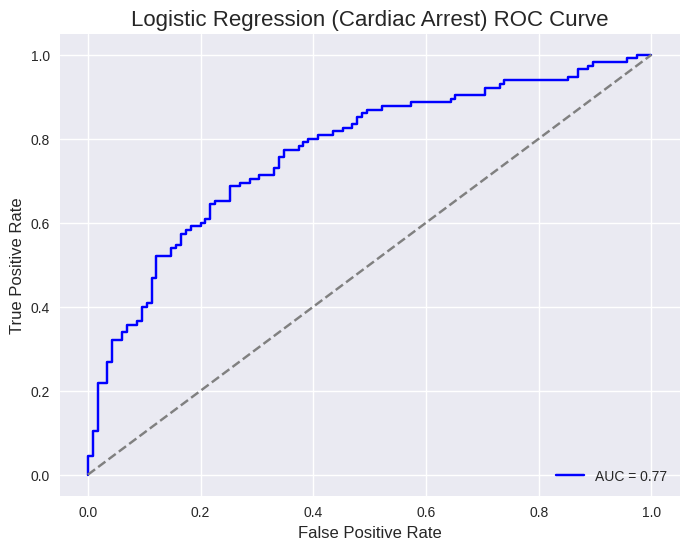

              precision    recall  f1-score   support

           0       0.69      0.75      0.72       115
           1       0.73      0.67      0.70       115

    accuracy                           0.71       230
   macro avg       0.71      0.71      0.71       230
weighted avg       0.71      0.71      0.71       230

AUC-ROC: 0.7687712665406427
Overall Accuracy (Logistic Regression (Cardiac Arrest)): 0.7087
F1 Score (Logistic Regression (Cardiac Arrest)): 0.6968
Recall Score (Logistic Regression (Cardiac Arrest)): 0.6696
Precision Score (Logistic Regression (Cardiac Arrest)): 0.6696


In [ ]:
# Prepare data
X_LR_CA = dfca.drop(columns=['CDARREST', 'CDMI'])
y_LR_CA = dfca['CDARREST']

# Standardize features
scaler_LR_CA = StandardScaler()
X_scaled_LR_CA = scaler_LR_CA.fit_transform(X_LR_CA)

# Define Stratified K-Fold Cross Validation
kf_LR_CA = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define Optuna objective function
def lr_ca_objective(trial):
    C = trial.suggest_loguniform('C', 1e-4, 10)
    solver = trial.suggest_categorical('solver', ['liblinear', 'lbfgs', 'newton-cg'])
    auc_scores = []

    for train_index, test_index in kf_LR_CA.split(X_scaled_LR_CA, y_LR_CA):
        X_train_LR_CA, X_test_LR_CA = X_scaled_LR_CA[train_index], X_scaled_LR_CA[test_index]
        y_train_LR_CA, y_test_LR_CA = y_LR_CA[train_index], y_LR_CA[test_index]

        model = LogisticRegression(C=C, solver=solver, max_iter=1000, random_state=42)
        model.fit(X_train_LR_CA, y_train_LR_CA)

        y_prob_LR_CA = model.predict_proba(X_test_LR_CA)[:, 1]
        auc_score = roc_auc_score(y_test_LR_CA, y_prob_LR_CA)
        auc_scores.append(auc_score)

    return np.mean(auc_scores)

# Run Optuna optimization
study_LR_CA = optuna.create_study(direction="maximize")
study_LR_CA.optimize(lr_ca_objective, n_trials=50)

# Train final Logistic Regression model with best hyperparameters
best_params_LR_CA = study_LR_CA.best_params
print("Best hyperparameters for Logistic Regression:", best_params_LR_CA)

log_reg_LR_CA = LogisticRegression(**best_params_LR_CA, max_iter=1000, random_state=42)

# Train on entire dataset
log_reg_LR_CA.fit(X_scaled_LR_CA, y_LR_CA)

# Make predictions
y_pred_LR_CA = log_reg_LR_CA.predict(X_scaled_LR_CA)
y_prob_LR_CA = log_reg_LR_CA.predict_proba(X_scaled_LR_CA)[:, 1]


# ROC Curve
LR_CA_fpr, LR_CA_tpr, _ = roc_curve(y_LR_CA, y_prob_LR_CA)
roc_auc_LR_CA = roc_auc_score(y_LR_CA, y_prob_LR_CA)

plt.figure(figsize=(8, 6))
plt.plot(LR_CA_fpr, LR_CA_tpr, color='blue', label=f'AUC = {roc_auc_LR_CA:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('Logistic Regression (Cardiac Arrest) ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.legend(loc="lower right")
plt.show()


# Print Classification Report and AUC Score
print(classification_report(y_LR_CA, y_pred_LR_CA))
print("AUC-ROC:", roc_auc_LR_CA)
accuracy_LR_CA = accuracy_score(y_LR_CA, y_pred_LR_CA)
print(f"Overall Accuracy (Logistic Regression (Cardiac Arrest)): {accuracy_LR_CA:.4f}")
f1_LR_CA = f1_score(y_LR_CA, y_pred_LR_CA)
print(f"F1 Score (Logistic Regression (Cardiac Arrest)): {f1_LR_CA:.4f}")
recall_LR_CA = recall_score(y_LR_CA, y_pred_LR_CA)
print(f"Recall Score (Logistic Regression (Cardiac Arrest)): {recall_LR_CA:.4f}")
precision_LR_CA = recall_score(y_LR_CA, y_pred_LR_CA)
print(f"Precision Score (Logistic Regression (Cardiac Arrest)): {precision_LR_CA:.4f}")

/tmp/ipython-input-2347122075.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_LR_CA, X_scaled_LR_CA, feature_names=feature_names, show=False)


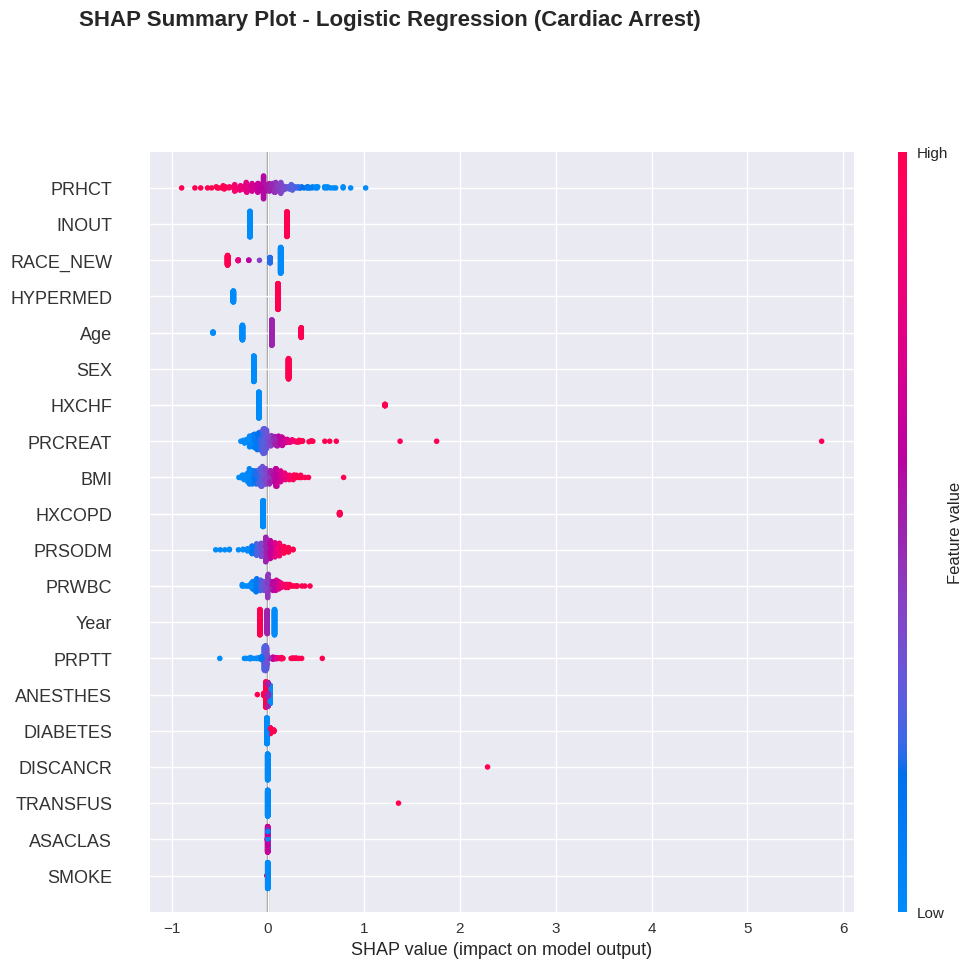

In [ ]:
# SHAP for Logistic Regression
explainer_LR_CA = shap.Explainer(log_reg_LR_CA, X_scaled_LR_CA)
shap_values_LR_CA = explainer_LR_CA(X_scaled_LR_CA)

# Ensure feature names are correctly passed
feature_names = X_LR_CA.columns

# Create SHAP summary plot
plt.figure(figsize=(22, 10))  # Make the plot larger
shap.summary_plot(shap_values_LR_CA, X_scaled_LR_CA, feature_names=feature_names, show=False)

# Title
plt.suptitle("SHAP Summary Plot - Logistic Regression (Cardiac Arrest)", fontsize=16, fontweight="bold", y=1.05)
plt.subplots_adjust(top=0.90, right=1.3, bottom=0.1, left=0.2)

# Show plot
plt.show()

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Saved LIME HTML: lime_lr_ca_idx_50.html


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Saved LIME HTML: lime_lr_ca_idx_35.html


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Saved LIME HTML: lime_lr_ca_idx_204.html


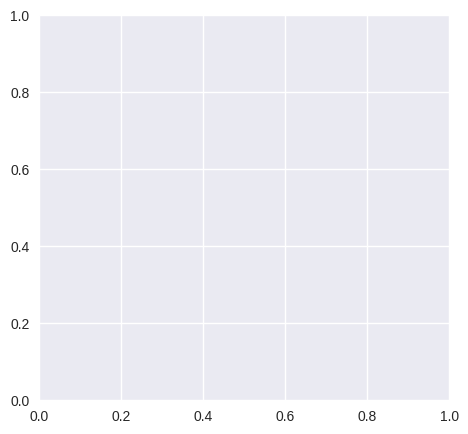

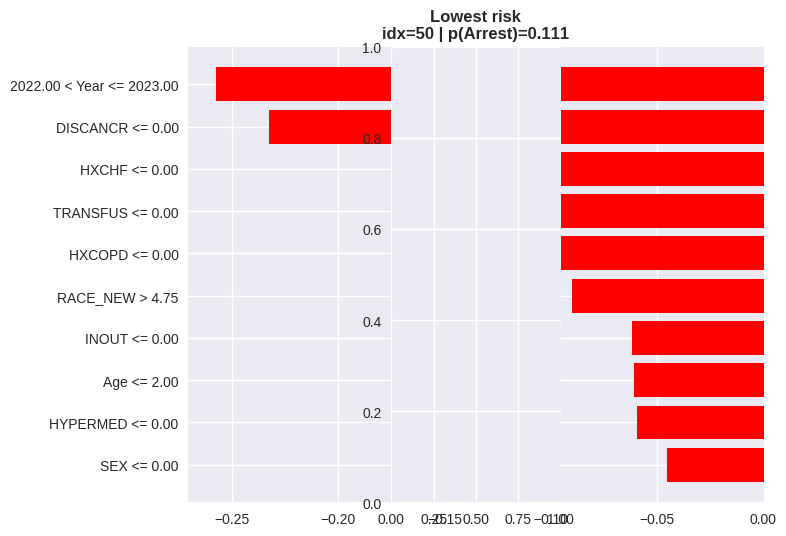

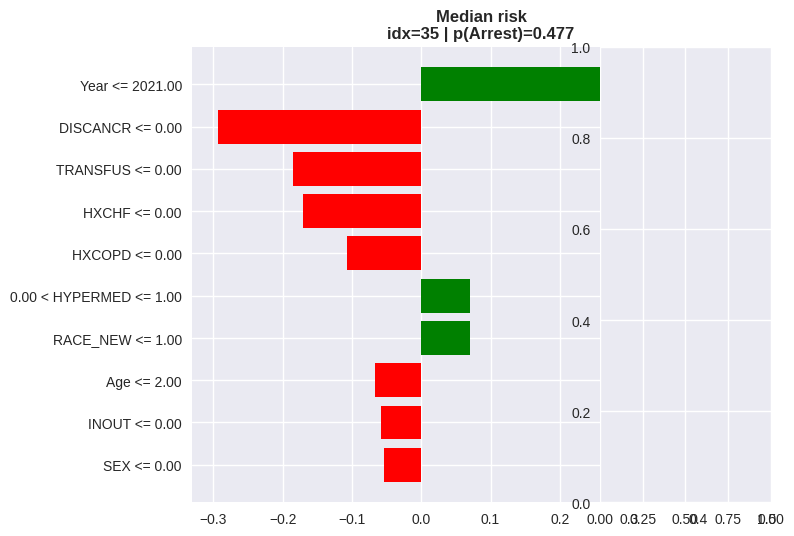

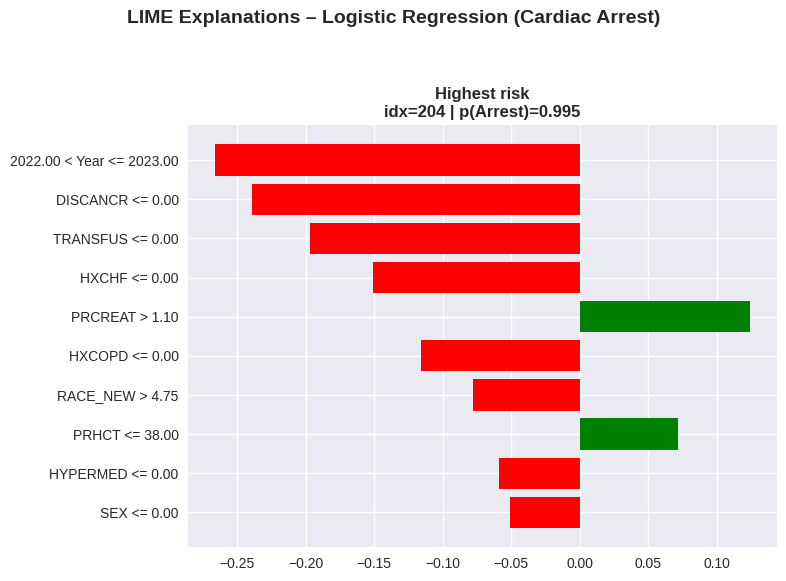

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_tabular

# LIME features
X_train_lime = X_LR_CA.values
feature_names = list(X_LR_CA.columns)

# Class names
class_names = ["No Arrest", "Arrest"] if set(np.unique(y_LR_CA)) == {0, 1} else [str(c) for c in np.unique(y_LR_CA)]
def predict_proba_on_raw(X_raw: np.ndarray) -> np.ndarray:
    X_scaled = scaler_LR_CA.transform(X_raw)
    return log_reg_LR_CA.predict_proba(X_scaled)

# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_lime,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True,
    mode="classification",
    random_state=42
)

probs = y_prob_LR_CA
order = np.argsort(probs)
idx_low   = int(order[0])
idx_mid   = int(order[len(order)//2])
idx_high  = int(order[-1])
chosen = [("Lowest risk", idx_low), ("Median risk", idx_mid), ("Highest risk", idx_high)]

#Generate LIME explanations and plot side-by-side
figs = []
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 11})

plt.figure(figsize=(18, 5))
for i, (label, idx) in enumerate(chosen, 1):
    instance_raw = X_LR_CA.iloc[idx].values  # original-scale row
    exp = explainer.explain_instance(
        data_row=instance_raw,
        predict_fn=predict_proba_on_raw,
        num_features=min(10, len(feature_names))
    )

    # Matplotlib figure from LIME
    ax = plt.subplot(1, 3, i)
    fig = exp.as_pyplot_figure(label=1)
    plt.title(f"{label}\nidx={idx} | p(Arrest)={probs[idx]:.3f}", fontsize=12, fontweight="bold")
    plt.tight_layout()

    # Save interactive HTML per instance
    html_path = f"lime_lr_ca_idx_{idx}.html"
    with open(html_path, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"Saved LIME HTML: {html_path}")

plt.suptitle("LIME Explanations – Logistic Regression (Cardiac Arrest)", fontsize=14, fontweight="bold", y=1.05)
plt.tight_layout()
plt.show()


## CDMI

[I 2025-12-13 20:10:11,890] A new study created in memory with name: no-name-6952fb82-45cc-4b55-b6b5-2e100443da5f
/tmp/ipython-input-2339335650.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)
[I 2025-12-13 20:10:12,316] Trial 0 finished with value: 0.7901249809480262 and parameters: {'C': 2.0634355922504546, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.7901249809480262.
/tmp/ipython-input-2339335650.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)
[I 2025-12-13 20:10:12,481] Trial 1 finished with value: 0.7899710409998476 and parameters: {'C': 8.864976210570752, 'solver

Best hyperparameters for Logistic Regression: {'C': 0.00381792907166264, 'solver': 'lbfgs'}


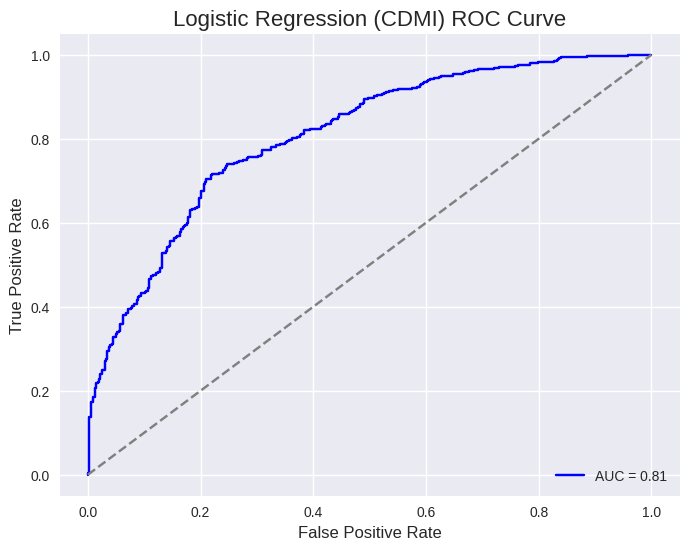

              precision    recall  f1-score   support

           0       0.73      0.76      0.75       404
           1       0.75      0.72      0.73       404

    accuracy                           0.74       808
   macro avg       0.74      0.74      0.74       808
weighted avg       0.74      0.74      0.74       808

AUC-ROC: 0.8067713949612781
Overall Accuracy (Logistic Regression (CDMI)): 0.7401
F1 Score (Logistic Regression (CDMI)): 0.7348
Recall Score (Logistic Regression (CDMI)): 0.7203
Precision Score (Logistic Regression (CDMI)): 0.7500


In [ ]:
# Prepare data
X_LR_CDMI = dfcdmi.drop(columns=['CDMI', 'CDARREST'])
y_LR_CDMI = dfcdmi['CDMI']

# Standardize features
scaler_LR_CDMI = StandardScaler()
X_scaled_LR_CDMI = scaler_LR_CDMI.fit_transform(X_LR_CDMI)

# Define Stratified K-Fold Cross Validation
kf_LR_CDMI = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define Optuna objective function for Logistic Regression (CDMI)
def lr_cdmi_objective(trial):
    C = trial.suggest_loguniform('C', 1e-4, 10)
    solver = trial.suggest_categorical('solver', ['liblinear', 'lbfgs', 'newton-cg'])
    auc_scores = []

    for train_index, test_index in kf_LR_CDMI.split(X_scaled_LR_CDMI, y_LR_CDMI):
        X_train_LR_CDMI, X_test_LR_CDMI = X_scaled_LR_CDMI[train_index], X_scaled_LR_CDMI[test_index]
        y_train_LR_CDMI, y_test_LR_CDMI = y_LR_CDMI[train_index], y_LR_CDMI[test_index]

        model = LogisticRegression(C=C, solver=solver, max_iter=1000, random_state=42)
        model.fit(X_train_LR_CDMI, y_train_LR_CDMI)

        y_prob_LR_CDMI = model.predict_proba(X_test_LR_CDMI)[:, 1]
        auc_score = roc_auc_score(y_test_LR_CDMI, y_prob_LR_CDMI)
        auc_scores.append(auc_score)

    return np.mean(auc_scores)

# Run Optuna optimization
study_LR_CDMI = optuna.create_study(direction="maximize")
study_LR_CDMI.optimize(lr_cdmi_objective, n_trials=50)

# Train final Logistic Regression model with best hyperparameters
best_params_LR_CDMI = study_LR_CDMI.best_params
print("Best hyperparameters for Logistic Regression:", best_params_LR_CDMI)

log_reg_LR_CDMI = LogisticRegression(**best_params_LR_CDMI, max_iter=1000, random_state=42)

# Train on entire dataset
log_reg_LR_CDMI.fit(X_scaled_LR_CDMI, y_LR_CDMI)

# Make predictions
y_pred_LR_CDMI = log_reg_LR_CDMI.predict(X_scaled_LR_CDMI)
y_prob_LR_CDMI = log_reg_LR_CDMI.predict_proba(X_scaled_LR_CDMI)[:, 1]


# ROC Curve
_R_CDMI_fpr, LR_CDMI_tpr, _ = roc_curve(y_LR_CDMI, y_prob_LR_CDMI)
roc_auc_LR_CDMI = roc_auc_score(y_LR_CDMI, y_prob_LR_CDMI)

plt.figure(figsize=(8, 6))
plt.plot(_R_CDMI_fpr, LR_CDMI_tpr, color='blue', label=f'AUC = {roc_auc_LR_CDMI:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('Logistic Regression (CDMI) ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.legend(loc="lower right")
plt.show()


# Print Classification Report and AUC Score
print(classification_report(y_LR_CDMI, y_pred_LR_CDMI))
print("AUC-ROC:", roc_auc_LR_CDMI)
accuracy_LR_CDMI = accuracy_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"Overall Accuracy (Logistic Regression (CDMI)): {accuracy_LR_CDMI:.4f}")
f1_LR_CDMI = f1_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"F1 Score (Logistic Regression (CDMI)): {f1_LR_CDMI:.4f}")
recall_LR_CDMI = recall_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"Recall Score (Logistic Regression (CDMI)): {recall_LR_CDMI:.4f}")
precision_LR_CDMI = precision_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"Precision Score (Logistic Regression (CDMI)): {precision_LR_CDMI:.4f}")

/tmp/ipython-input-800717613.py:9: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_LR_CDMI, X_scaled_LR_CDMI, feature_names=feature_names, show=False)


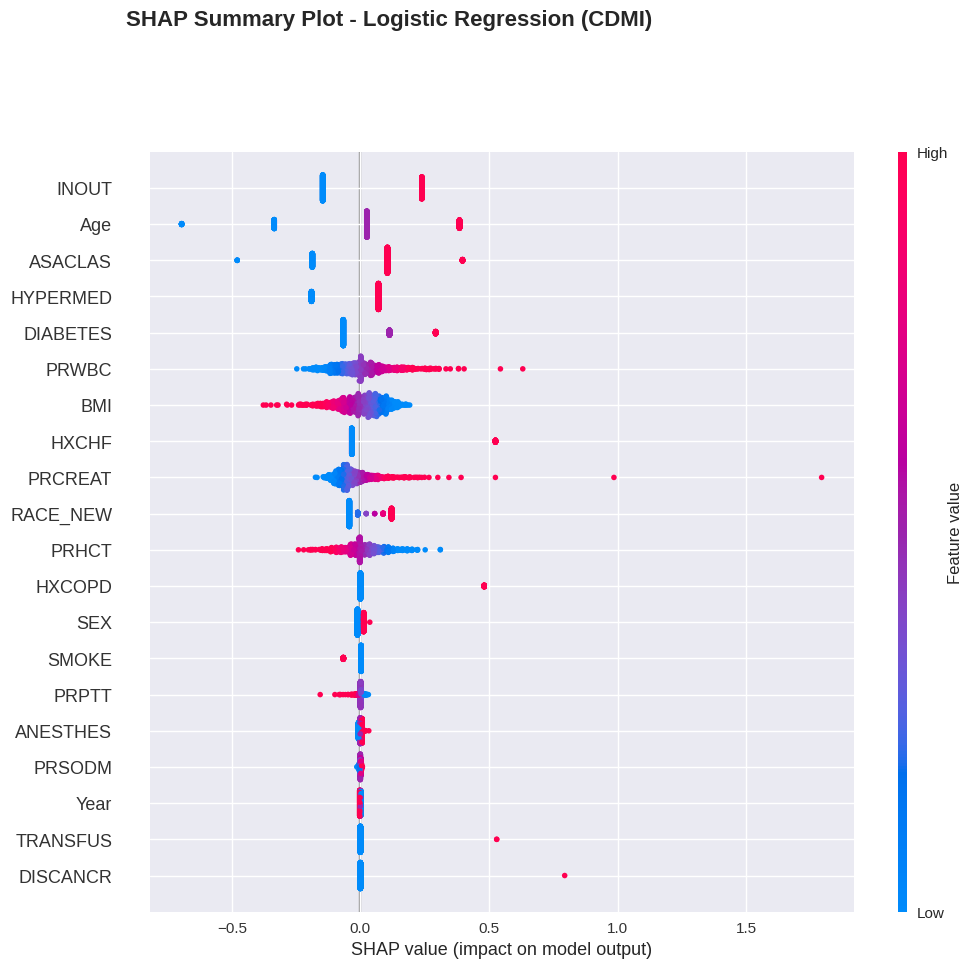

In [ ]:
explainer_LR_CDMI = shap.Explainer(log_reg_LR_CDMI, X_scaled_LR_CDMI)
shap_values_LR_CDMI = explainer_LR_CDMI(X_scaled_LR_CDMI)

# Ensure feature names are correctly passed
feature_names = X_LR_CDMI.columns

# Create SHAP summary plot with  increased figure size
plt.figure(figsize=(22, 10))  # Make the plot larger
shap.summary_plot(shap_values_LR_CDMI, X_scaled_LR_CDMI, feature_names=feature_names, show=False)

# Add a title with adjusted positioning
plt.suptitle("SHAP Summary Plot - Logistic Regression (CDMI)", fontsize=16, fontweight="bold", y=1.05)

# Adjust margins further to make room for labels and title
plt.subplots_adjust(top=0.90, right=1.3, bottom=0.1, left=0.2)

# Show the plot
plt.show()

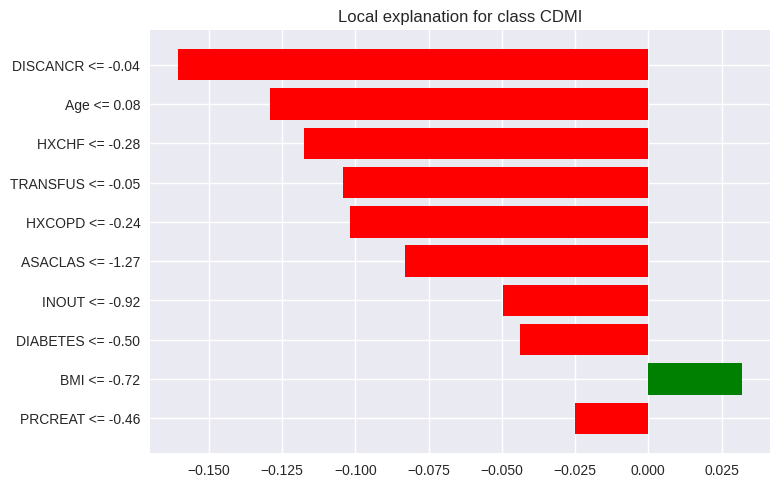

In [ ]:
explainer_LR_CDMI = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_scaled_LR_CDMI,
    feature_names=X_LR_CDMI.columns,
    class_names=['No CDMI', 'CDMI'],
    mode='classification'
)

# Select a random instance from the data
i = np.random.randint(0, X_scaled_LR_CDMI.shape[0])
sample_instance = X_scaled_LR_CDMI[i]

# Explain the selected instance
explanation_LR_CDMI = explainer_LR_CDMI.explain_instance(
    sample_instance,
    log_reg_LR_CDMI.predict_proba,
    num_features=10
)

# Display the explanation in a readable format
explanation_LR_CDMI.show_in_notebook()

# Plot the explanation
fig = explanation_LR_CDMI.as_pyplot_figure()
plt.show()

## Combined

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

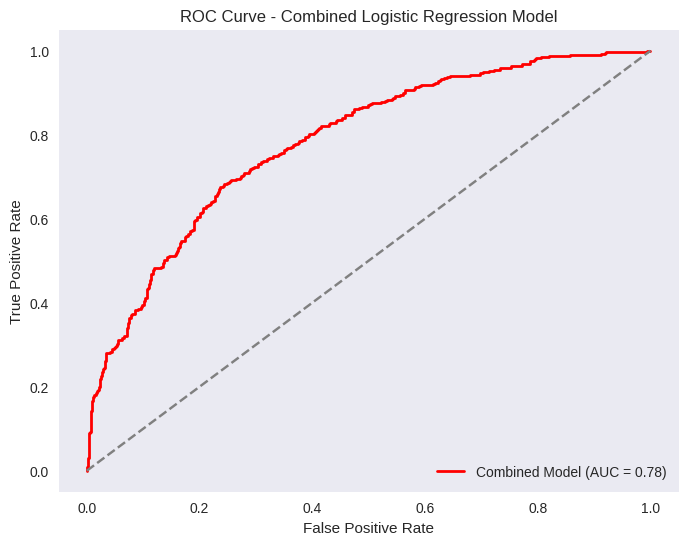

Combined Model Metrics: 
Accuracy: 0.7177
F1 Score: 0.7102
Recall: 0.6917
AUC Score: 0.7839
Precision: 0.7297


In [ ]:
# CDARREST
X_LR_CA_resampled = dfca.drop(['CDARREST', 'CDMI'], axis=1)
y_LR_CA_resampled = dfca['CDARREST']

# CDMI
X_LR_CDMI_resampled = dfcdmi.drop(['CDMI', 'CDARREST'], axis=1)
y_LR_CDMI_resampled = dfcdmi['CDMI']

# Combine the feature datasets (X_LR_CA and X_LR_CDMI)
X_LR_Combined = np.concatenate((X_LR_CA_resampled, X_LR_CDMI_resampled), axis=0)
y_LR_Combined = np.concatenate((y_LR_CA_resampled, y_LR_CDMI_resampled), axis=0)

# Extract original feature names from one of the original DataFrames
original_feature_names = X_LR_CA_resampled.columns.tolist()

# Convert the combined features into a DataFrame with the original feature names
X_LR_Combined_df = pd.DataFrame(X_LR_Combined, columns=original_feature_names)

# Create Logistic Regression models for each target
log_reg_CA = LogisticRegression(max_iter=1000)
log_reg_CDMI = LogisticRegression(max_iter=1000)

# Combine the models using VotingClassifier
voting_classifier_LR_Combined = VotingClassifier(estimators=[
    ('log_reg_CA', log_reg_CA),
    ('log_reg_CDMI', log_reg_CDMI)
], voting='soft')

# Fit the combined model using the resampled data
voting_classifier_LR_Combined.fit(X_LR_Combined, y_LR_Combined)

# Make predictions using the combined model
y_pred_combined_labels = voting_classifier_LR_Combined.predict(X_LR_Combined)

# Compute metrics for the combined model
accuracy_combined = accuracy_score(y_LR_Combined, y_pred_combined_labels)
f1_combined = f1_score(y_LR_Combined, y_pred_combined_labels)
recall_combined = recall_score(y_LR_Combined, y_pred_combined_labels)
precision_combined = precision_score(y_LR_Combined, y_pred_combined_labels)

# Compute the ROC curve and AUC for the combined model
y_pred_combined_prob = voting_classifier_LR_Combined.predict_proba(X_LR_Combined)[:, 1]
fpr_combined, tpr_combined, _ = roc_curve(y_LR_Combined, y_pred_combined_prob)
roc_auc_combined = auc(fpr_combined, tpr_combined)

# Plot ROC Curve for the combined model
plt.figure(figsize=(8, 6))
plt.plot(fpr_combined, tpr_combined, color='red', lw=2, label=f'Combined Model (AUC = {roc_auc_combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined Logistic Regression Model')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print metrics for the combined model
print(f'Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined:.4f}')
print(f'F1 Score: {f1_combined:.4f}')
print(f'Recall: {recall_combined:.4f}')
print(f'AUC Score: {roc_auc_combined:.4f}')
print(f'Precision: {precision_combined:.4f}')

In [ ]:
# Train the Logistic Regression models
log_reg_CA.fit(X_LR_CA_resampled, y_RF_CA_resampled)
log_reg_CDMI.fit(X_LR_CDMI_resampled, y_RF_CDMI_resampled)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

LogisticRegression(max_iter=1000)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

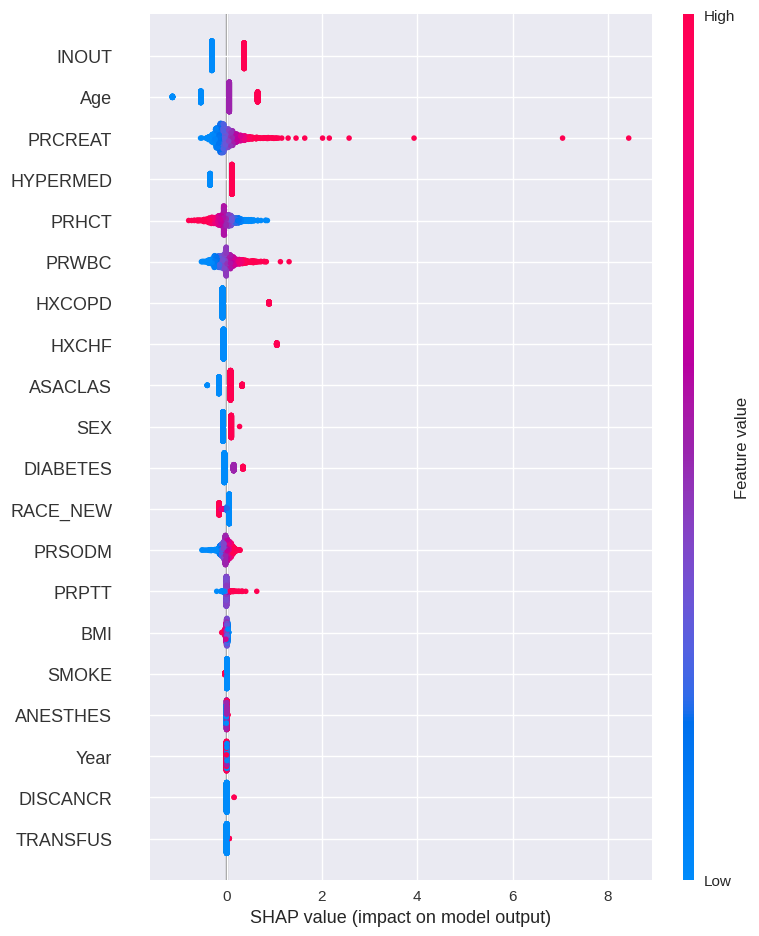

<Figure size 800x550 with 0 Axes>

In [ ]:
# Train the Logistic Regression models
log_reg_CA.fit(X_LR_CA_resampled, y_RF_CA_resampled)
log_reg_CDMI.fit(X_LR_CDMI_resampled, y_RF_CDMI_resampled)

# Create the DataFrame for the features
X_LR_Combined_df = pd.DataFrame(X_LR_Combined, columns=X_LR_CA_resampled.columns)

# Create SHAP explainers for both Logistic Regression models using LinearExplainer
explainer_LR_CA = shap.LinearExplainer(log_reg_CA, X_LR_Combined_df)
explainer_LR_CDMI = shap.LinearExplainer(log_reg_CDMI, X_LR_Combined_df)

# Get SHAP values for both Logistic Regression models on the combined dataset
shap_values_LR_CA = explainer_LR_CA.shap_values(X_LR_Combined_df)
shap_values_LR_CDMI = explainer_LR_CDMI.shap_values(X_LR_Combined_df)

# Combine the SHAP values from both models
shap_values_Combined = (shap_values_LR_CA + shap_values_LR_CDMI) / 2

# Ensure the SHAP values have the same shape as the features matrix
assert shap_values_Combined.shape[1] == X_LR_Combined_df.shape[1], \
    f"Shape mismatch: SHAP values ({shap_values_Combined.shape[1]} features) and data ({X_LR_Combined_df.shape[1]} features)"

# Visualize SHAP values for the combined model using the dot plot
shap.summary_plot(shap_values_Combined, X_LR_Combined_df, plot_type="dot")

# Add a title using matplotlib to the existing plot
plt.suptitle('SHAP Summary Plot - Combined Logistic Regression Model', fontsize=16)
plt.show()

In [ ]:
log_reg_CA.fit(X_LR_CA_resampled, y_RF_CA_resampled)
log_reg_CDMI.fit(X_LR_CDMI_resampled, y_RF_CDMI_resampled)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

LogisticRegression(max_iter=1000)

Saved LIME HTML: lime_combined_idx_519.html
Saved LIME HTML: lime_combined_idx_767.html
Saved LIME HTML: lime_combined_idx_204.html


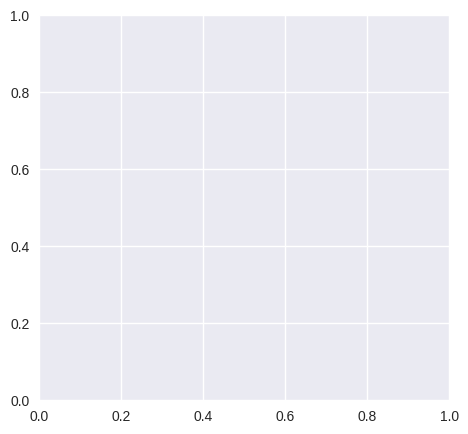

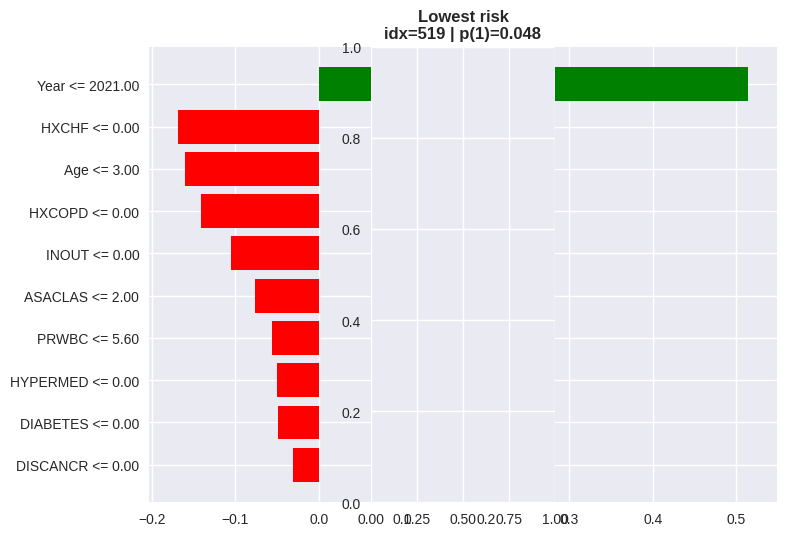

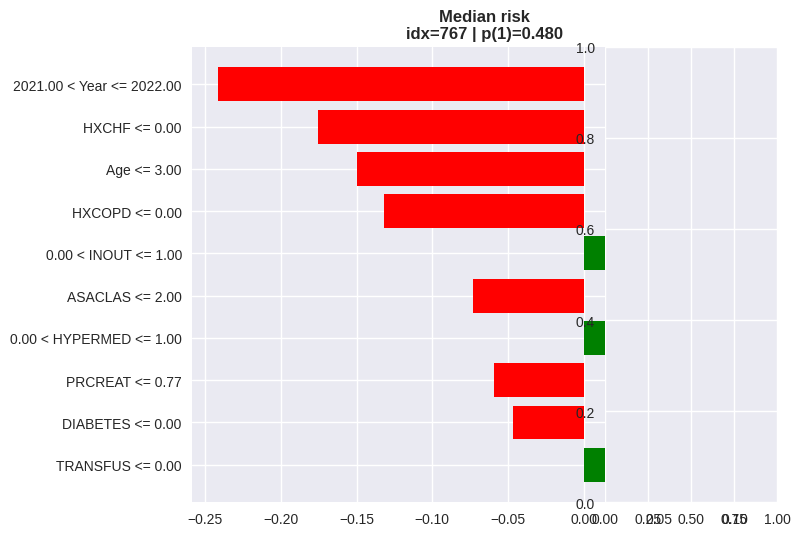

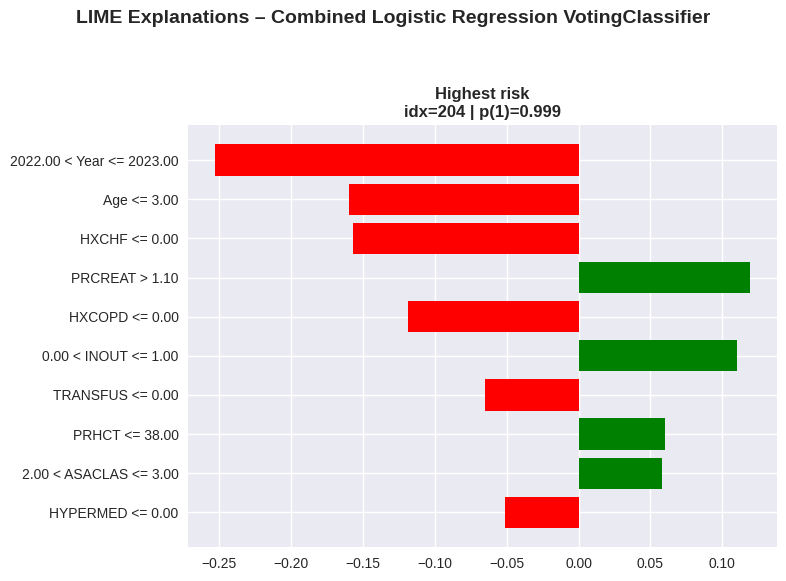

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_tabular

# Use original features
X_train_lime = X_LR_Combined_df.values
feature_names = list(X_LR_Combined_df.columns)

# Class names from combined target
unique_classes = np.unique(y_LR_Combined)
class_names = [str(c) for c in unique_classes]
positive_label = unique_classes[-1]

# Prediction function for LIME
def predict_fn(X):
    return voting_classifier_LR_Combined.predict_proba(X)

# Build the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_lime,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True,
    mode="classification",
    random_state=42
)

# Pick representative examples
probs = voting_classifier_LR_Combined.predict_proba(X_LR_Combined_df.values)[:, list(unique_classes).index(positive_label)]
order = np.argsort(probs)
idx_low = int(order[0])
idx_mid = int(order[len(order)//2])
idx_high = int(order[-1])
chosen = [("Lowest risk", idx_low), ("Median risk", idx_mid), ("Highest risk", idx_high)]

# Plot style
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 11})

# Generate and visualize LIME explanations
plt.figure(figsize=(18, 5))
for i, (label, idx) in enumerate(chosen, 1):
    instance = X_LR_Combined_df.iloc[idx].values

    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=predict_fn,
        num_features=min(10, len(feature_names))
    )

    # Draw each explanation as a Matplotlib figure
    plt.subplot(1, 3, i)
    exp.as_pyplot_figure(label=list(unique_classes).index(positive_label))
    plt.title(f"{label}\nidx={idx} | p({positive_label})={probs[idx]:.3f}",
              fontsize=12, fontweight="bold")
    plt.tight_layout()

    # Also save interactive HTML
    html_path = f"lime_combined_idx_{idx}.html"
    with open(html_path, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"Saved LIME HTML: {html_path}")

plt.suptitle("LIME Explanations – Combined Logistic Regression VotingClassifier",
             fontsize=14, fontweight="bold", y=1.05)
plt.tight_layout()
plt.show()


# Neural Network

## Cardiac Arrest

[I 2025-12-13 20:19:06,968] A new study created in memory with name: no-name-e7a495be-0431-468e-a9bd-bb898f655d42
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:19:09,982] Trial 0 finished with value: 0.9231758034026466 and parameters: {'units_1': 119, 'dropout_1': 0.22407013630027195, 'units_2': 68, 'learning_rate': 0.0022812454648163554}. Best is trial 0 with value: 0.9231758034026466.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-12-13 20:19:12,939] Trial 1 finished with value: 0.6257844990548205 and parameters: {'units_1': 256, 'dropout_1': 0.25930388130416426, 'units_2': 92, 'learning_rate': 1.2507977804768814e-05}. Best is trial 0 with value: 0.9231758034026466.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:15,549] Trial 2 finished with value: 0.9677126654064272 and parameters: {'units_1': 178, 'dropout_1': 0.4085466708194646, 'units_2': 127, 'learning_rate': 0.007309097185373906}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:17,647] Trial 3 finished with value: 0.7849527410207939 and parameters: {'units_1': 214, 'dropout_1': 0.20608836026779523, 'units_2': 54, 'learning_rate': 0.00020800771977657045}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:19,808] Trial 4 finished with value: 0.7973534971644614 and parameters: {'units_1': 245, 'dropout_1': 0.35118556982938814, 'units_2': 76, 'learning_rate': 0.00033968119083479007}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:21,880] Trial 5 finished with value: 0.8837807183364839 and parameters: {'units_1': 152, 'dropout_1': 0.37556372842920116, 'units_2': 94, 'learning_rate': 0.0014474173808449921}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:19:23,961] Trial 6 finished with value: 0.4157277882797732 and parameters: {'units_1': 89, 'dropout_1': 0.3140060443316709, 'units_2': 62, 'learning_rate': 1.157640788089233e-05}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


[I 2025-12-13 20:19:27,057] Trial 7 finished with value: 0.6246502835538753 and parameters: {'units_1': 229, 'dropout_1': 0.4322655622332252, 'units_2': 34, 'learning_rate': 5.486314836944276e-05}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:29,559] Trial 8 finished with value: 0.845897920604915 and parameters: {'units_1': 213, 'dropout_1': 0.4121946857751989, 'units_2': 118, 'learning_rate': 0.0007868498464300571}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:31,635] Trial 9 finished with value: 0.7786767485822307 and parameters: {'units_1': 154, 'dropout_1': 0.308361681961951, 'units_2': 79, 'learning_rate': 0.0001633909760835214}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:34,387] Trial 10 finished with value: 0.9589413988657844 and parameters: {'units_1': 190, 'dropout_1': 0.49786693060088255, 'units_2': 119, 'learning_rate': 0.00832970366622951}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:36,638] Trial 11 finished with value: 0.9571266540642722 and parameters: {'units_1': 189, 'dropout_1': 0.49312968801582024, 'units_2': 127, 'learning_rate': 0.008747331582688665}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-12-13 20:19:39,283] Trial 12 finished with value: 0.9464650283553875 and parameters: {'units_1': 179, 'dropout_1': 0.4973676493058669, 'units_2': 110, 'learning_rate': 0.006516915285989157}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:19:42,241] Trial 13 finished with value: 0.9149338374291115 and parameters: {'units_1': 129, 'dropout_1': 0.4464108073566955, 'units_2': 105, 'learning_rate': 0.003449677634526252}. Best is trial 2 with value: 0.9677126654064272.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:44,416] Trial 14 finished with value: 0.9702079395085066 and parameters: {'units_1': 188, 'dropout_1': 0.3969866286380013, 'units_2': 128, 'learning_rate': 0.009825275689218635}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:46,549] Trial 15 finished with value: 0.8539886578449906 and parameters: {'units_1': 176, 'dropout_1': 0.39457397318625903, 'units_2': 128, 'learning_rate': 0.0009353569502631496}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:48,693] Trial 16 finished with value: 0.879773156899811 and parameters: {'units_1': 67, 'dropout_1': 0.45313796421364166, 'units_2': 100, 'learning_rate': 0.003621882379024615}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:50,826] Trial 17 finished with value: 0.803780718336484 and parameters: {'units_1': 135, 'dropout_1': 0.32984891931918425, 'units_2': 113, 'learning_rate': 0.0005502484531912384}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


[I 2025-12-13 20:19:53,926] Trial 18 finished with value: 0.6896030245746692 and parameters: {'units_1': 211, 'dropout_1': 0.3739698736349212, 'units_2': 89, 'learning_rate': 6.958363981039016e-05}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:56,498] Trial 19 finished with value: 0.9424574669187146 and parameters: {'units_1': 167, 'dropout_1': 0.41025672449396483, 'units_2': 128, 'learning_rate': 0.004283522770413309}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:19:58,604] Trial 20 finished with value: 0.8775803402646504 and parameters: {'units_1': 107, 'dropout_1': 0.27974485531674714, 'units_2': 39, 'learning_rate': 0.0017400292434220806}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:00,729] Trial 21 finished with value: 0.9641587901701323 and parameters: {'units_1': 198, 'dropout_1': 0.4734956988949223, 'units_2': 119, 'learning_rate': 0.009157109079162883}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 20:20:03,690] Trial 22 finished with value: 0.9529678638941399 and parameters: {'units_1': 199, 'dropout_1': 0.4669094083936808, 'units_2': 119, 'learning_rate': 0.009940115603389713}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


[I 2025-12-13 20:20:07,604] Trial 23 finished with value: 0.9504725897920605 and parameters: {'units_1': 227, 'dropout_1': 0.4271527255507142, 'units_2': 104, 'learning_rate': 0.004805652578941099}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:10,371] Trial 24 finished with value: 0.9485822306238185 and parameters: {'units_1': 162, 'dropout_1': 0.3808367846531318, 'units_2': 118, 'learning_rate': 0.0033198760670453517}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:12,558] Trial 25 finished with value: 0.9145557655954631 and parameters: {'units_1': 199, 'dropout_1': 0.4707446940245825, 'units_2': 123, 'learning_rate': 0.002108808926476003}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:20:14,751] Trial 26 finished with value: 0.9668052930056711 and parameters: {'units_1': 144, 'dropout_1': 0.35065549394700707, 'units_2': 111, 'learning_rate': 0.005470768920497871}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:16,853] Trial 27 finished with value: 0.9608317580340264 and parameters: {'units_1': 146, 'dropout_1': 0.33737736730610507, 'units_2': 109, 'learning_rate': 0.005879636553393396}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:18,951] Trial 28 finished with value: 0.865179584120983 and parameters: {'units_1': 140, 'dropout_1': 0.36637276951466896, 'units_2': 85, 'learning_rate': 0.0012923341273357687}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 20:20:22,231] Trial 29 finished with value: 0.8936105860113421 and parameters: {'units_1': 116, 'dropout_1': 0.4014467240238359, 'units_2': 100, 'learning_rate': 0.002694413620829655}. Best is trial 14 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:20:24,536] Trial 30 finished with value: 0.9777693761814745 and parameters: {'units_1': 170, 'dropout_1': 0.3536091323666349, 'units_2': 112, 'learning_rate': 0.005716565212113624}. Best is trial 30 with value: 0.9777693761814745.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:20:26,690] Trial 31 finished with value: 0.9750472589792061 and parameters: {'units_1': 169, 'dropout_1': 0.29133582771656075, 'units_2': 114, 'learning_rate': 0.005388542602366841}. Best is trial 30 with value: 0.9777693761814745.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:28,878] Trial 32 finished with value: 0.9404914933837429 and parameters: {'units_1': 172, 'dropout_1': 0.2612377029344234, 'units_2': 114, 'learning_rate': 0.0023173552770503}. Best is trial 30 with value: 0.9777693761814745.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 20:20:31,055] Trial 33 finished with value: 0.981398865784499 and parameters: {'units_1': 182, 'dropout_1': 0.30112826571532014, 'units_2': 123, 'learning_rate': 0.005336994360007398}. Best is trial 33 with value: 0.981398865784499.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-12-13 20:20:33,678] Trial 34 finished with value: 0.9850283553875236 and parameters: {'units_1': 185, 'dropout_1': 0.2914562536658647, 'units_2': 97, 'learning_rate': 0.005493989527719424}. Best is trial 34 with value: 0.9850283553875236.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:20:36,765] Trial 35 finished with value: 0.8693383742911154 and parameters: {'units_1': 160, 'dropout_1': 0.2883442359380308, 'units_2': 96, 'learning_rate': 0.001100369327331203}. Best is trial 34 with value: 0.9850283553875236.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:20:39,008] Trial 36 finished with value: 0.8425708884688091 and parameters: {'units_1': 181, 'dropout_1': 0.2313915052114763, 'units_2': 105, 'learning_rate': 0.0006245892582194042}. Best is trial 34 with value: 0.9850283553875236.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:41,125] Trial 37 finished with value: 0.5863894139886578 and parameters: {'units_1': 167, 'dropout_1': 0.24139938467872996, 'units_2': 88, 'learning_rate': 2.8204316203243242e-05}. Best is trial 34 with value: 0.9850283553875236.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step


[I 2025-12-13 20:20:44,148] Trial 38 finished with value: 0.9444234404536862 and parameters: {'units_1': 222, 'dropout_1': 0.2977740624038645, 'units_2': 74, 'learning_rate': 0.002591454118547353}. Best is trial 34 with value: 0.9850283553875236.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-12-13 20:20:46,728] Trial 39 finished with value: 0.8034782608695651 and parameters: {'units_1': 157, 'dropout_1': 0.26605672884579884, 'units_2': 98, 'learning_rate': 0.00035750813879034573}. Best is trial 34 with value: 0.9850283553875236.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 20:20:50,013] Trial 40 finished with value: 0.987296786389414 and parameters: {'units_1': 245, 'dropout_1': 0.31967433604513146, 'units_2': 93, 'learning_rate': 0.005069449272158995}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-12-13 20:20:52,273] Trial 41 finished with value: 0.9835160680529301 and parameters: {'units_1': 250, 'dropout_1': 0.3248382076618176, 'units_2': 94, 'learning_rate': 0.005524453607974069}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:54,551] Trial 42 finished with value: 0.9091871455576558 and parameters: {'units_1': 255, 'dropout_1': 0.32665984741230125, 'units_2': 92, 'learning_rate': 0.001591367729706356}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:56,679] Trial 43 finished with value: 0.974820415879017 and parameters: {'units_1': 240, 'dropout_1': 0.3113840274447542, 'units_2': 81, 'learning_rate': 0.00656638329416967}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:20:58,871] Trial 44 finished with value: 0.972476370510397 and parameters: {'units_1': 242, 'dropout_1': 0.33583156780775825, 'units_2': 82, 'learning_rate': 0.004044871770119727}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-12-13 20:21:01,689] Trial 45 finished with value: 0.960226843100189 and parameters: {'units_1': 249, 'dropout_1': 0.2756082686918291, 'units_2': 74, 'learning_rate': 0.003027069054616003}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:21:04,389] Trial 46 finished with value: 0.9852551984877127 and parameters: {'units_1': 235, 'dropout_1': 0.317779421576794, 'units_2': 94, 'learning_rate': 0.0065663819781847195}. Best is trial 40 with value: 0.987296786389414.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:21:06,529] Trial 47 finished with value: 0.9892627599243857 and parameters: {'units_1': 238, 'dropout_1': 0.3047674285210056, 'units_2': 61, 'learning_rate': 0.007428383044586182}. Best is trial 47 with value: 0.9892627599243857.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:21:08,677] Trial 48 finished with value: 0.9794328922495275 and parameters: {'units_1': 236, 'dropout_1': 0.3169711363969661, 'units_2': 59, 'learning_rate': 0.007576015060957648}. Best is trial 47 with value: 0.9892627599243857.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-12-13 20:21:10,717] Trial 49 finished with value: 0.7711153119092627 and parameters: {'units_1': 230, 'dropout_1': 0.24911722809351913, 'units_2': 50, 'learning_rate': 0.00016213656588222794}. Best is trial 47 with value: 0.9892627599243857.


Running K-fold Cross-validation...



/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Fold ROC AUC: 0.6269 | Accuracy: 0.6522 | Precision: 0.7778 | Recall: 0.5385 | F1: 0.6364
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Fold ROC AUC: 0.9423 | Accuracy: 0.8696 | Precision: 0.8889 | Recall: 0.8000 | F1: 0.8421
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Fold ROC AUC: 0.9981 | Accuracy: 0.9783 | Precision: 0.9600 | Recall: 1.0000 | F1: 0.9796
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Fold ROC AUC: 0.9886 | Accuracy: 0.9130 | Precision: 0.8696 | Recall: 0.9524 | F1: 0.9091
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Fold ROC AUC: 1.0000 | Accuracy: 0.9783 | Precision: 1.0000 | Recall: 0.9583 | F1: 0.9787

Average metrics across all folds:
Average ROC AUC: 0.9112
Average Accuracy: 0.8783
Average Precision: 0.8992
Average Recall: 0.8498
Average F1 Score: 0.8692
Average ROC AUC: 0.9112
Average Accuracy: 0.8783
Average Precision: 0.8992
Average Recall: 0.8498
Average F1 Score: 0.8692


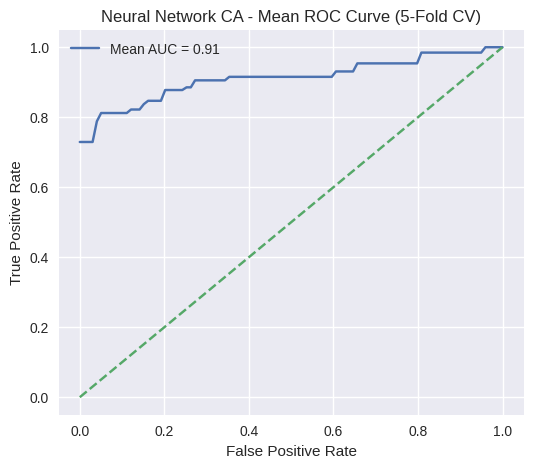

In [ ]:
X_NN_CA = dfca.drop(['CDARREST', 'CDMI'], axis=1).values
y_NN_CA = dfca['CDARREST'].values

# Scale the features
scaler_NN_CA = StandardScaler()
X_scaled_NN_CA = scaler_NN_CA.fit_transform(X_NN_CA)

# Define the model creation function
def build_nn_CA_Model(input_dim, best_params_NN_CA):
    model_NN_CA = Sequential()
    model_NN_CA.add(Dense(best_params_NN_CA['units_1'], input_dim=input_dim, activation='relu'))
    model_NN_CA.add(Dropout(best_params_NN_CA['dropout_1']))
    model_NN_CA.add(Dense(best_params_NN_CA['units_2'], activation='relu'))
    model_NN_CA.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

    model_NN_CA.compile(optimizer=Adam(learning_rate=best_params_NN_CA['learning_rate']),
                          loss='binary_crossentropy', metrics=['accuracy'])
    return model_NN_CA

# Define the objective function for hyperparameter optimization
def optimize_nn_CA_with_optuna():
    def objective(trial):
        units_1 = trial.suggest_int('units_1', 64, 256)
        dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
        units_2 = trial.suggest_int('units_2', 32, 128)
        learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

        model_NN_CA = build_nn_CA_Model(X_scaled_NN_CA.shape[1],
                                            {'units_1': units_1, 'dropout_1': dropout_1, 'units_2': units_2, 'learning_rate': learning_rate})

        model_NN_CA.fit(X_scaled_NN_CA, y_NN_CA, epochs=10, batch_size=32, verbose=0)
        y_prob_NN_CA = model_NN_CA.predict(X_scaled_NN_CA).flatten()
        roc_auc_NN_CA = roc_auc_score(y_NN_CA, y_prob_NN_CA)

        return roc_auc_NN_CA

    study_NN_CA = optuna.create_study(direction='maximize')
    study_NN_CA.optimize(objective, n_trials=50)

    return study_NN_CA.best_params

# K-fold Cross-validation with additional metrics
def kfold_cross_validation_NN_CA(X_NN_CA, y_NN_CA, model_NN_CA, n_splits=5):
    kf_NN_CA = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    roc_auc_scores_NN_CA = []
    accuracy_scores_NN_CA = []
    precision_scores_NN_CA = []
    recall_scores_NN_CA = []
    f1_scores_NN_CA = []

    fpr_list_NN_CA, tpr_list_NN_CA = [], []

    for train_index, test_index in kf_NN_CA.split(X_NN_CA):
        X_train_NN_CA, X_test_NN_CA = X_NN_CA[train_index], X_NN_CA[test_index]
        y_train_NN_CA, y_test_NN_CA = y_NN_CA[train_index], y_NN_CA[test_index]

        model_NN_CA.fit(X_train_NN_CA, y_train_NN_CA, epochs=20, batch_size=32, verbose=0)
        y_prob_NN_CA = model_NN_CA.predict(X_test_NN_CA).flatten()
        y_pred_NN_CA = (y_prob_NN_CA > 0.5).astype(int)

        # Collect ROC metrics
        fpr_NN_CA, tpr_NN_CA, _ = roc_curve(y_test_NN_CA, y_prob_NN_CA)
        roc_auc_NN_CA = roc_auc_score(y_test_NN_CA, y_prob_NN_CA)

        fpr_list_NN_CA.append(fpr_NN_CA)
        tpr_list_NN_CA.append(tpr_NN_CA)
        roc_auc_scores_NN_CA.append(roc_auc_NN_CA)

        # Evaluation metrics
        accuracy_NN_CA = accuracy_score(y_test_NN_CA, y_pred_NN_CA)
        precision_NN_CA = precision_score(y_test_NN_CA, y_pred_NN_CA)
        recall_NN_CA = recall_score(y_test_NN_CA, y_pred_NN_CA)
        f1_NN_CA = f1_score(y_test_NN_CA, y_pred_NN_CA)

        accuracy_scores_NN_CA.append(accuracy_NN_CA)
        precision_scores_NN_CA.append(precision_NN_CA)
        recall_scores_NN_CA.append(recall_NN_CA)
        f1_scores_NN_CA.append(f1_NN_CA)

        print(f"Fold ROC AUC: {roc_auc_NN_CA:.4f} | Accuracy: {accuracy_NN_CA:.4f} | Precision: {precision_NN_CA:.4f} | Recall: {recall_NN_CA:.4f} | F1: {f1_NN_CA:.4f}")

    # Average ROC metrics across folds
    mean_fpr_NN_CA = np.linspace(0, 1, 100)
    mean_tpr_NN_CA = np.zeros_like(mean_fpr_NN_CA)

    # Interpolating ROC curves
    for fpr_NN_CA, tpr_NN_CA in zip(fpr_list_NN_CA, tpr_list_NN_CA):
        mean_tpr_NN_CA += np.interp(mean_fpr_NN_CA, fpr_NN_CA, tpr_NN_CA)

    mean_tpr_NN_CA /= len(fpr_list_NN_CA)
    mean_roc_auc_NN_CA = np.mean(roc_auc_scores_NN_CA)

    # Calculate the mean of other metrics
    mean_accuracy_NN_CA = np.mean(accuracy_scores_NN_CA)
    mean_precision_NN_CA = np.mean(precision_scores_NN_CA)
    mean_recall_NN_CA = np.mean(recall_scores_NN_CA)
    mean_f1_NN_CA = np.mean(f1_scores_NN_CA)

    print(f"\nAverage metrics across all folds:")
    print(f"Average ROC AUC: {mean_roc_auc_NN_CA:.4f}")
    print(f"Average Accuracy: {mean_accuracy_NN_CA:.4f}")
    print(f"Average Precision: {mean_precision_NN_CA:.4f}")
    print(f"Average Recall: {mean_recall_NN_CA:.4f}")
    print(f"Average F1 Score: {mean_f1_NN_CA:.4f}")

    return mean_fpr_NN_CA, mean_tpr_NN_CA, mean_roc_auc_NN_CA, mean_accuracy_NN_CA, mean_precision_NN_CA, mean_recall_NN_CA, mean_f1_NN_CA


# Running the Final Model with K-fold Cross-validation
def run_nn_CA_Model():
    best_params_NN_CA = optimize_nn_CA_with_optuna()
    model_NN_CA = build_nn_CA_Model(X_scaled_NN_CA.shape[1], best_params_NN_CA)

    print("Running K-fold Cross-validation...\n")
    mean_fpr_NN_CA, mean_tpr_NN_CA, mean_roc_auc_NN_CA, mean_accuracy_NN_CA, mean_precision_NN_CA, mean_recall_NN_CA, mean_f1_NN_CA = kfold_cross_validation_NN_CA(X_scaled_NN_CA, y_NN_CA, model_NN_CA, n_splits=5)

    # Print the results
    print(f"Average ROC AUC: {mean_roc_auc_NN_CA:.4f}")
    print(f"Average Accuracy: {mean_accuracy_NN_CA:.4f}")
    print(f"Average Precision: {mean_precision_NN_CA:.4f}")
    print(f"Average Recall: {mean_recall_NN_CA:.4f}")
    print(f"Average F1 Score: {mean_f1_NN_CA:.4f}")

    # Plot the mean ROC curve across folds
    plt.figure(figsize=(6, 5))
    plt.plot(mean_fpr_NN_CA, mean_tpr_NN_CA, label=f'Mean AUC = {mean_roc_auc_NN_CA:.2f}')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Neural Network CA - Mean ROC Curve (5-Fold CV)')
    plt.legend()
    plt.show()

    return model_NN_CA, mean_fpr_NN_CA, mean_tpr_NN_CA, mean_roc_auc_NN_CA


if __name__ == "__main__":
    model_NN_CA, mean_fpr_NN_CA, mean_tpr_NN_CA, mean_roc_auc_NN_CA = run_nn_CA_Model()

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_550
Received: inputs=['Tensor(shape=(200, 21))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_550
Received: inputs=['Tensor(shape=(400, 21))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_550
Received: inputs=['Tensor(shape=(230, 21))']
  warn

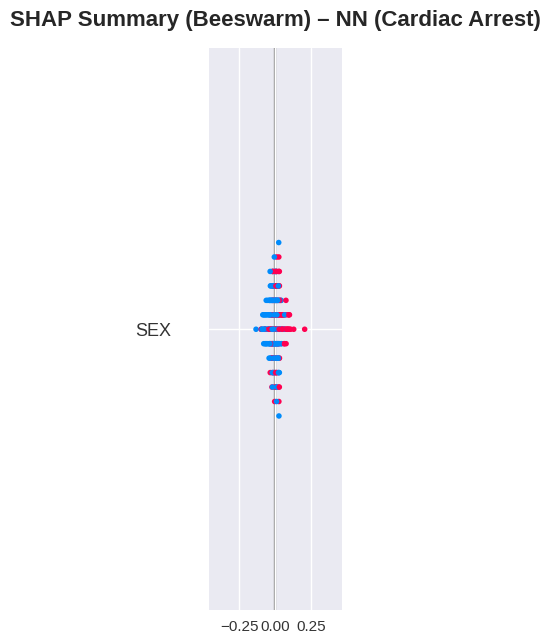

/tmp/ipython-input-2193590871.py:49: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(
/usr/local/lib/python3.12/dist-packages/shap/plots/_beeswarm.py:723: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(


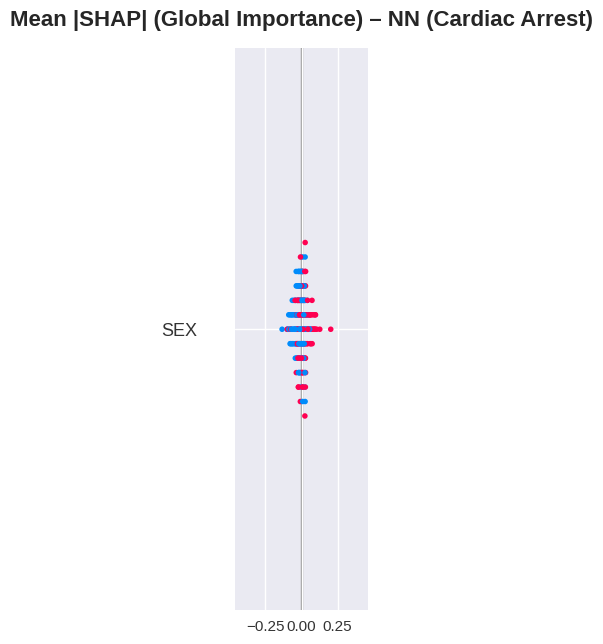

In [ ]:
import numpy as np
import shap
import matplotlib.pyplot as plt

# Feature names
feature_names = dfca.drop(['CDARREST', 'CDMI'], axis=1).columns.tolist()

# Choose a small background set for SHAP
rng = np.random.default_rng(42)
bg_n = min(200, X_scaled_NN_CA.shape[0])
bg_idx = rng.choice(X_scaled_NN_CA.shape[0], size=bg_n, replace=False)
X_bg = X_scaled_NN_CA[bg_idx]

# Choose instances to explain
explain_n = min(500, X_scaled_NN_CA.shape[0])
explain_idx = rng.choice(X_scaled_NN_CA.shape[0], size=explain_n, replace=False)
X_explain = X_scaled_NN_CA[explain_idx]

# Build the SHAP explainer
try:
    explainer = shap.DeepExplainer(model_NN_CA, X_bg)
    shap_values = explainer.shap_values(X_explain)
    if isinstance(shap_values, list):
        shap_values = shap_values[0]
except Exception as e:
    print(f"DeepExplainer unavailable ({e}). Falling back to KernelExplainer (slower).")
    f = lambda x: model_NN_CA.predict(x, verbose=0).flatten()
    explainer = shap.KernelExplainer(f, X_bg, link="logit")
    shap_values = explainer.shap_values(X_explain, nsamples="auto")
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

# Plot SHAP summary
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 12})

# Beeswarm summary
shap.summary_plot(
    shap_values,
    X_explain,
    feature_names=feature_names,
    plot_size=(12, 6),
    show=False
)
plt.title("SHAP Summary (Beeswarm) – NN (Cardiac Arrest)", fontsize=16, fontweight="bold", pad=16)
plt.tight_layout()
plt.show()

shap.summary_plot(
    shap_values,
    X_explain,
    feature_names=feature_names,
    plot_type="bar",
    plot_size=(10, 6),
    show=False
)
plt.title("Mean |SHAP| (Global Importance) – NN (Cardiac Arrest)", fontsize=16, fontweight="bold", pad=16)
plt.tight_layout()
plt.show()


Saved LIME HTML: lime_nn_ca_idx_114.html
Saved LIME HTML: lime_nn_ca_idx_226.html
Saved LIME HTML: lime_nn_ca_idx_224.html


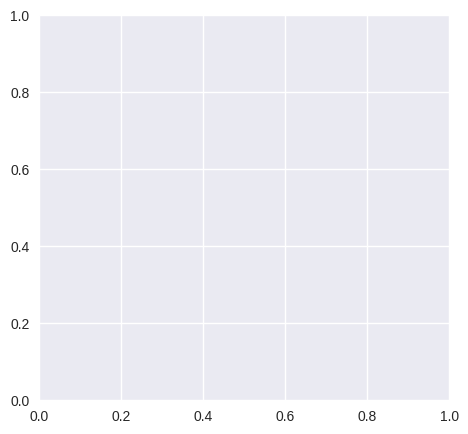

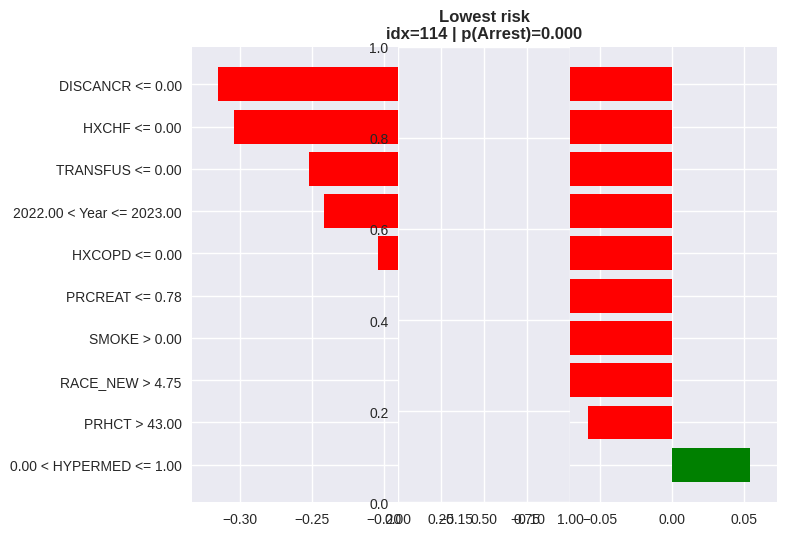

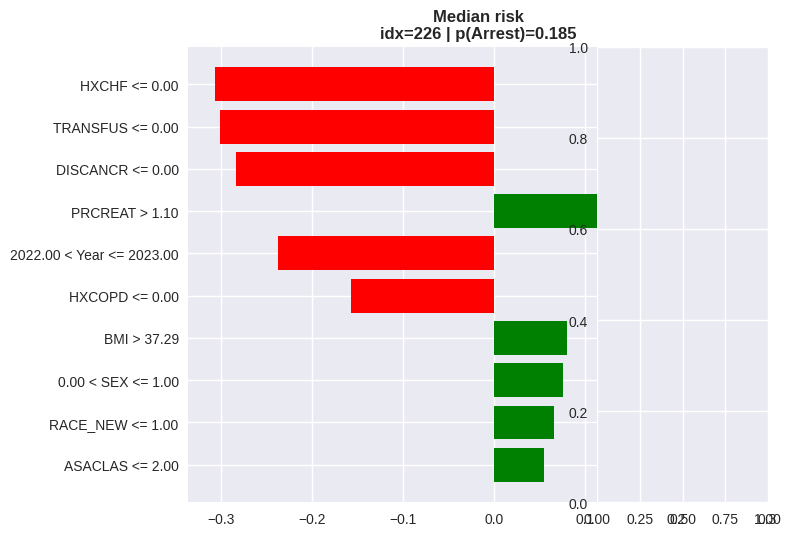

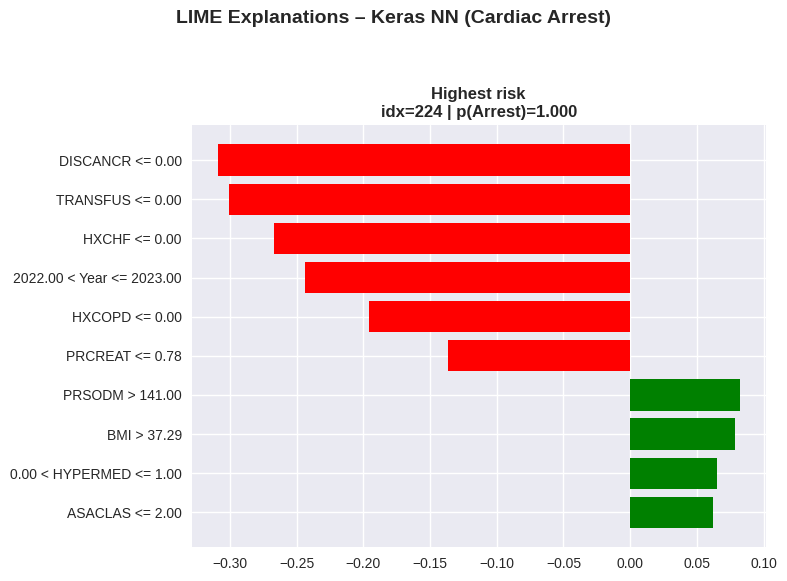

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_tabular

# Feature matrix and names
feature_names = dfca.drop(['CDARREST', 'CDMI'], axis=1).columns.tolist()
X_raw = X_NN_CA

def predict_proba_on_raw(X_raw_batch: np.ndarray) -> np.ndarray:
    X_scaled = scaler_NN_CA.transform(X_raw_batch)
    p1 = model_NN_CA.predict(X_scaled, verbose=0).reshape(-1)
    p0 = 1.0 - p1
    return np.vstack([p0, p1]).T

# Create the LIME explainer
class_names = ["No Arrest", "Arrest"]
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_raw,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True,
    mode="classification",
    random_state=42
)

# Pick representative examples
probs_all = model_NN_CA.predict(X_scaled_NN_CA, verbose=0).reshape(-1)
order = np.argsort(probs_all)
idx_low  = int(order[0])
idx_mid  = int(order[len(order)//2])
idx_high = int(order[-1])
chosen = [("Lowest risk", idx_low), ("Median risk", idx_mid), ("Highest risk", idx_high)]

# Visualize explanations and save HTMLs
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 11})

plt.figure(figsize=(18, 5))
for i, (tag, idx) in enumerate(chosen, 1):
    instance_raw = X_raw[idx]

    exp = explainer.explain_instance(
        data_row=instance_raw,
        predict_fn=predict_proba_on_raw,
        num_features=min(10, len(feature_names))
    )

    # Draw as Matplotlib figure
    ax = plt.subplot(1, 3, i)
    exp.as_pyplot_figure(label=1)
    plt.title(f"{tag}\nidx={idx} | p(Arrest)={probs_all[idx]:.3f}",
              fontsize=12, fontweight="bold")
    plt.tight_layout()

    # Save interactive HTML for deeper inspection
    html_path = f"lime_nn_ca_idx_{idx}.html"
    with open(html_path, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"Saved LIME HTML: {html_path}")

plt.suptitle("LIME Explanations – Keras NN (Cardiac Arrest)", fontsize=14, fontweight="bold", y=1.05)
plt.tight_layout()
plt.show()


## CDMI

[I 2025-12-13 20:41:44,217] A new study created in memory with name: no-name-a9ed42b5-8573-4b8e-936a-18334cf67f14
[I 2025-12-13 20:41:51,703] Trial 0 finished with value: 0.6946929222625233 and parameters: {'hidden_layer_size': 112, 'alpha': 9.133262598424408e-05, 'learning_rate_init': 0.03573450770338205}. Best is trial 0 with value: 0.6946929222625233.
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimiza

Best hyperparameters: {'hidden_layer_size': 140, 'alpha': 7.711304352423176e-05, 'learning_rate_init': 0.00010006260614168225}


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptro

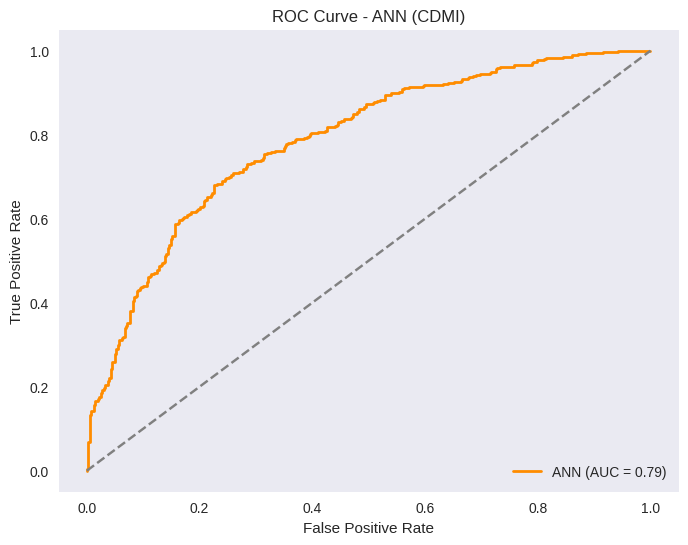

ANN Model Metrics for CDMI:
AUC Score: 0.7874
Accuracy: 0.7178
F1 Score: 0.7157
Recall: 0.7104
Precision: 0.7211


In [ ]:
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score, recall_score, precision_score
import optuna
import matplotlib.pyplot as plt
import numpy as np

# Prepare Feature & Target Data
X_NN_CDMI = dfcdmi.drop(columns=['CDMI', 'CDARREST'])
y_NN_CDMI = dfcdmi['CDMI']

# Impute missing values
imputer_NN_CDMI = SimpleImputer(strategy='mean')
X_imputed_NN_CDMI = imputer_NN_CDMI.fit_transform(X_NN_CDMI)

# Scale the features
scaler_NN_CDMI = StandardScaler()
X_scaled_NN_CDMI = scaler_NN_CDMI.fit_transform(X_imputed_NN_CDMI)

# Define Optuna Objective
def objective_nn_cdmi(trial):
    hidden_layer_size = trial.suggest_int('hidden_layer_size', 50, 200)
    alpha = trial.suggest_float('alpha', 1e-5, 1e-1, log=True)
    learning_rate_init = trial.suggest_float('learning_rate_init', 1e-4, 1e-1, log=True)

    clf = MLPClassifier(
        hidden_layer_sizes=(hidden_layer_size,),
        alpha=alpha,
        learning_rate_init=learning_rate_init,
        max_iter=300,
        random_state=42
    )

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob = cross_val_predict(clf, X_scaled_NN_CDMI, y_NN_CDMI, cv=kf, method="predict_proba")[:, 1]

    fpr, tpr, _ = roc_curve(y_NN_CDMI, y_pred_prob)
    return auc(fpr, tpr)

# Optimize with Optuna
study_nn_cdmi = optuna.create_study(direction='maximize')
study_nn_cdmi.optimize(objective_nn_cdmi, n_trials=50)

# Train Final Model
print("Best hyperparameters:", study_nn_cdmi.best_params)
best_params_nn_cdmi = study_nn_cdmi.best_params

final_nn_model_cdmi = MLPClassifier(
    hidden_layer_sizes=(best_params_nn_cdmi['hidden_layer_size'],),
    alpha=best_params_nn_cdmi['alpha'],
    learning_rate_init=best_params_nn_cdmi['learning_rate_init'],
    max_iter=300,
    random_state=42
)

kf_nn_cdmi = KFold(n_splits=5, shuffle=True, random_state=42)
y_pred_prob_NN_CDMI = cross_val_predict(final_nn_model_cdmi, X_scaled_NN_CDMI, y_NN_CDMI, cv=kf_nn_cdmi, method="predict_proba")[:, 1]
y_pred_NN_CDMI = cross_val_predict(final_nn_model_cdmi, X_scaled_NN_CDMI, y_NN_CDMI, cv=kf_nn_cdmi, method="predict")

# Compute Evaluation Metrics
fpr_NN_CDMI, tpr_NN_CDMI, _ = roc_curve(y_NN_CDMI, y_pred_prob_NN_CDMI)
roc_auc_NN_CDMI = auc(fpr_NN_CDMI, tpr_NN_CDMI)

accuracy_NN_CDMI = accuracy_score(y_NN_CDMI, y_pred_NN_CDMI)
f1_NN_CDMI = f1_score(y_NN_CDMI, y_pred_NN_CDMI)
recall_NN_CDMI = recall_score(y_NN_CDMI, y_pred_NN_CDMI)
precision_NN_CDMI = precision_score(y_NN_CDMI, y_pred_NN_CDMI)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_NN_CDMI, tpr_NN_CDMI, color='darkorange', lw=2, label=f'ANN (AUC = {roc_auc_NN_CDMI:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - ANN (CDMI)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print Model Performance
print(f'ANN Model Metrics for CDMI:')
print(f'AUC Score: {roc_auc_NN_CDMI:.4f}')
print(f'Accuracy: {accuracy_NN_CDMI:.4f}')
print(f'F1 Score: {f1_NN_CDMI:.4f}')
print(f'Recall: {recall_NN_CDMI:.4f}')
print(f'Precision: {precision_NN_CDMI:.4f}')

In [ ]:
# K-fold Cross-validation with additional metrics
def kfold_cross_validation_NN_CDMI(X_NN_CDMI, y_NN_CDMI, model_NN_CDMI, n_splits=5):
    kf_NN_CDMI = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    roc_auc_scores_NN_CDMI = []
    accuracy_scores_NN_CDMI = []
    precision_scores_NN_CDMI = []
    recall_scores_NN_CDMI = []
    f1_scores_NN_CDMI = []

    fpr_list_NN_CDMI, tpr_list_NN_CDMI = [], []

    for train_index, test_index in kf_NN_CDMI.split(X_NN_CDMI):
        X_train_NN_CDMI, X_test_NN_CDMI = X_NN_CDMI[train_index], X_NN_CDMI[test_index]
        y_train_NN_CDMI, y_test_NN_CDMI = y_NN_CDMI[train_index], y_NN_CDMI[test_index]

        model_NN_CDMI.fit(X_train_NN_CDMI, y_train_NN_CDMI, epochs=20, batch_size=32, class_weight=class_weight_NN_CDMI, verbose=0)
        y_prob_NN_CDMI = model_NN_CDMI.predict(X_test_NN_CDMI).flatten()
        y_pred_NN_CDMI = (y_prob_NN_CDMI > 0.5).astype(int)

        # Collect ROC metrics
        fpr_NN_CDMI, tpr_NN_CDMI, _ = roc_curve(y_test_NN_CDMI, y_prob_NN_CDMI)
        roc_auc_NN_CDMI = roc_auc_score(y_test_NN_CDMI, y_prob_NN_CDMI)

        fpr_list_NN_CDMI.append(fpr_NN_CDMI)
        tpr_list_NN_CDMI.append(tpr_NN_CDMI)
        roc_auc_scores_NN_CDMI.append(roc_auc_NN_CDMI)

        # Evaluation metrics
        accuracy_NN_CDMI = accuracy_score(y_test_NN_CDMI, y_pred_NN_CDMI)
        precision_NN_CDMI = precision_score(y_test_NN_CDMI, y_pred_NN_CDMI)
        recall_NN_CDMI = recall_score(y_test_NN_CDMI, y_pred_NN_CDMI)
        f1_NN_CDMI = f1_score(y_test_NN_CDMI, y_pred_NN_CDMI)

        accuracy_scores_NN_CDMI.append(accuracy_NN_CDMI)
        precision_scores_NN_CDMI.append(precision_NN_CDMI)
        recall_scores_NN_CDMI.append(recall_NN_CDMI)
        f1_scores_NN_CDMI.append(f1_NN_CDMI)

        print(f"Fold ROC AUC: {roc_auc_NN_CDMI:.4f} | Accuracy: {accuracy_NN_CDMI:.4f} | Precision: {precision_NN_CDMI:.4f} | Recall: {recall_NN_CDMI:.4f} | F1: {f1_NN_CDMI:.4f}")

    # Average ROC metrics across folds
    mean_fpr_NN_CDMI = np.linspace(0, 1, 100)
    mean_tpr_NN_CDMI = np.zeros_like(mean_fpr_NN_CDMI)

    # Interpolating ROC curves
    for fpr_NN_CDMI, tpr_NN_CDMI in zip(fpr_list_NN_CDMI, tpr_list_NN_CDMI):
        mean_tpr_NN_CDMI += np.interp(mean_fpr_NN_CDMI, fpr_NN_CDMI, tpr_NN_CDMI)

    mean_tpr_NN_CDMI /= len(fpr_list_NN_CDMI)
    mean_roc_auc_NN_CDMI = np.mean(roc_auc_scores_NN_CDMI)

    # Calculate the mean of other metrics
    mean_accuracy_NN_CDMI = np.mean(accuracy_scores_NN_CDMI)
    mean_precision_NN_CDMI = np.mean(precision_scores_NN_CDMI)
    mean_recall_NN_CDMI = np.mean(recall_scores_NN_CDMI)
    mean_f1_NN_CDMI = np.mean(f1_scores_NN_CDMI)

    print(f"\nAverage metrics across all folds:")
    print(f"Average ROC AUC: {mean_roc_auc_NN_CDMI:.4f}")
    print(f"Average Accuracy: {mean_accuracy_NN_CDMI:.4f}")
    print(f"Average Precision: {mean_precision_NN_CDMI:.4f}")
    print(f"Average Recall: {mean_recall_NN_CDMI:.4f}")
    print(f"Average F1 Score: {mean_f1_NN_CDMI:.4f}")

    return mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, mean_roc_auc_NN_CDMI, mean_accuracy_NN_CDMI, mean_precision_NN_CDMI, mean_recall_NN_CDMI, mean_f1_NN_CDMI

[I 2025-12-13 20:55:20,079] A new study created in memory with name: no-name-4a849369-f041-4eeb-9a47-375a02b2aa42
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-12-13 20:55:27,425] Trial 0 finished with value: 0.6197615429859817 and parameters: {'units_1': 129, 'dropout_1': 0.42743801765063694, 'units_2': 42, 'learning_rate': 1.4876752614533426e-05}. Best is trial 0 with value: 0.6197615429859817.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:30,594] Trial 1 finished with value: 0.9000036761101853 and parameters: {'units_1': 183, 'dropout_1': 0.23059117930908316, 'units_2': 53, 'learning_rate': 0.0016029949312028212}. Best is trial 1 with value: 0.9000036761101853.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:35,460] Trial 2 finished with value: 0.8443106068032545 and parameters: {'units_1': 142, 'dropout_1': 0.33640632029700146, 'units_2': 37, 'learning_rate': 0.0007544407079720357}. Best is trial 1 with value: 0.9000036761101853.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:38,062] Trial 3 finished with value: 0.853690814626017 and parameters: {'units_1': 65, 'dropout_1': 0.3071684569593046, 'units_2': 86, 'learning_rate': 0.0012895973562067633}. Best is trial 1 with value: 0.9000036761101853.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:40,552] Trial 4 finished with value: 0.8634447603176159 and parameters: {'units_1': 105, 'dropout_1': 0.2029140080516464, 'units_2': 119, 'learning_rate': 0.0009243802145972596}. Best is trial 1 with value: 0.9000036761101853.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:43,006] Trial 5 finished with value: 0.9139790216645427 and parameters: {'units_1': 88, 'dropout_1': 0.3204473865212746, 'units_2': 102, 'learning_rate': 0.006807919047727632}. Best is trial 5 with value: 0.9139790216645427.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-12-13 20:55:46,178] Trial 6 finished with value: 0.8724144691696891 and parameters: {'units_1': 181, 'dropout_1': 0.4189715165979506, 'units_2': 107, 'learning_rate': 0.001230046306364473}. Best is trial 5 with value: 0.9139790216645427.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:49,251] Trial 7 finished with value: 0.9164542691892952 and parameters: {'units_1': 194, 'dropout_1': 0.3272828297094381, 'units_2': 36, 'learning_rate': 0.0031823090926790232}. Best is trial 7 with value: 0.9164542691892952.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:51,636] Trial 8 finished with value: 0.7131837564944613 and parameters: {'units_1': 97, 'dropout_1': 0.30311026232078575, 'units_2': 49, 'learning_rate': 4.3665628666245536e-05}. Best is trial 7 with value: 0.9164542691892952.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:54,024] Trial 9 finished with value: 0.8095897461033232 and parameters: {'units_1': 78, 'dropout_1': 0.3137212720234348, 'units_2': 100, 'learning_rate': 0.00013568310217940336}. Best is trial 7 with value: 0.9164542691892952.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:55:56,484] Trial 10 finished with value: 0.8998382511518479 and parameters: {'units_1': 251, 'dropout_1': 0.4988478846209054, 'units_2': 68, 'learning_rate': 0.009772830805296845}. Best is trial 7 with value: 0.9164542691892952.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:55:59,527] Trial 11 finished with value: 0.9210279629448094 and parameters: {'units_1': 223, 'dropout_1': 0.3809744379376588, 'units_2': 76, 'learning_rate': 0.009048587932453818}. Best is trial 11 with value: 0.9210279629448094.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:02,905] Trial 12 finished with value: 0.9219561807665915 and parameters: {'units_1': 225, 'dropout_1': 0.38710843238608084, 'units_2': 68, 'learning_rate': 0.004052008409403763}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:05,312] Trial 13 finished with value: 0.8257523772179198 and parameters: {'units_1': 242, 'dropout_1': 0.40235713432377035, 'units_2': 73, 'learning_rate': 0.0002456377545290709}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:07,808] Trial 14 finished with value: 0.9101191059700029 and parameters: {'units_1': 215, 'dropout_1': 0.3797997591922265, 'units_2': 61, 'learning_rate': 0.004907279281649467}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:10,253] Trial 15 finished with value: 0.9042985981766494 and parameters: {'units_1': 216, 'dropout_1': 0.4709582984994355, 'units_2': 85, 'learning_rate': 0.00321090252393561}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:56:13,154] Trial 16 finished with value: 0.8380918537398295 and parameters: {'units_1': 225, 'dropout_1': 0.3717153367997711, 'units_2': 80, 'learning_rate': 0.0004140753200835315}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:16,360] Trial 17 finished with value: 0.8929394177041466 and parameters: {'units_1': 161, 'dropout_1': 0.45059409542957973, 'units_2': 93, 'learning_rate': 0.0027388487592644797}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:18,752] Trial 18 finished with value: 0.918414861288109 and parameters: {'units_1': 199, 'dropout_1': 0.36743717630424855, 'units_2': 62, 'learning_rate': 0.008515129234362278}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:56:21,245] Trial 19 finished with value: 0.8122794333888835 and parameters: {'units_1': 234, 'dropout_1': 0.2680922684185171, 'units_2': 128, 'learning_rate': 9.823899328119735e-05}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:23,677] Trial 20 finished with value: 0.9134276051367513 and parameters: {'units_1': 256, 'dropout_1': 0.39591876958643146, 'units_2': 76, 'learning_rate': 0.0024315150269057675}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:56:26,281] Trial 21 finished with value: 0.90246666993432 and parameters: {'units_1': 201, 'dropout_1': 0.35761571531235953, 'units_2': 63, 'learning_rate': 0.007440914229181422}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:56:30,795] Trial 22 finished with value: 0.9101436133712382 and parameters: {'units_1': 205, 'dropout_1': 0.353703073623859, 'units_2': 54, 'learning_rate': 0.005059748863296034}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:33,389] Trial 23 finished with value: 0.8891101362611509 and parameters: {'units_1': 168, 'dropout_1': 0.4407202996393077, 'units_2': 66, 'learning_rate': 0.009492023066760493}. Best is trial 12 with value: 0.9219561807665915.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:56:35,919] Trial 24 finished with value: 0.9235797960984218 and parameters: {'units_1': 225, 'dropout_1': 0.39080760988698143, 'units_2': 58, 'learning_rate': 0.005041540488455196}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:38,479] Trial 25 finished with value: 0.8441145475933732 and parameters: {'units_1': 232, 'dropout_1': 0.3984016497220564, 'units_2': 72, 'learning_rate': 0.0005092681466556631}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-12-13 20:56:41,929] Trial 26 finished with value: 0.9016885599451034 and parameters: {'units_1': 219, 'dropout_1': 0.468153300468289, 'units_2': 56, 'learning_rate': 0.004039026343024091}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:44,712] Trial 27 finished with value: 0.9105541123419273 and parameters: {'units_1': 243, 'dropout_1': 0.277983903622052, 'units_2': 46, 'learning_rate': 0.0019014210296805331}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:47,229] Trial 28 finished with value: 0.9132560533281051 and parameters: {'units_1': 183, 'dropout_1': 0.40846585395136764, 'units_2': 81, 'learning_rate': 0.0046896419416187825}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:49,656] Trial 29 finished with value: 0.6030229879423586 and parameters: {'units_1': 153, 'dropout_1': 0.43101849509285545, 'units_2': 43, 'learning_rate': 2.4222559045880524e-05}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:52,129] Trial 30 finished with value: 0.9031773845701402 and parameters: {'units_1': 212, 'dropout_1': 0.38093823600043664, 'units_2': 87, 'learning_rate': 0.002143012459754234}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:56:55,425] Trial 31 finished with value: 0.9191807175767083 and parameters: {'units_1': 200, 'dropout_1': 0.36462258718548074, 'units_2': 59, 'learning_rate': 0.006404750526236247}. Best is trial 24 with value: 0.9235797960984218.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:56:58,209] Trial 32 finished with value: 0.929081707675718 and parameters: {'units_1': 229, 'dropout_1': 0.34207073300062674, 'units_2': 55, 'learning_rate': 0.005558335555416697}. Best is trial 32 with value: 0.929081707675718.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:00,629] Trial 33 finished with value: 0.9303989804921087 and parameters: {'units_1': 227, 'dropout_1': 0.33914856573185836, 'units_2': 51, 'learning_rate': 0.004527750146725114}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:57:03,121] Trial 34 finished with value: 0.555625673953534 and parameters: {'units_1': 240, 'dropout_1': 0.3355585587688155, 'units_2': 51, 'learning_rate': 1.0226537182466071e-05}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:06,432] Trial 35 finished with value: 0.8721877757082639 and parameters: {'units_1': 118, 'dropout_1': 0.2806126895850303, 'units_2': 37, 'learning_rate': 0.001617011951982721}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:57:10,182] Trial 36 finished with value: 0.8632609548083523 and parameters: {'units_1': 186, 'dropout_1': 0.3456868706842996, 'units_2': 44, 'learning_rate': 0.001000348591420955}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:12,628] Trial 37 finished with value: 0.8576977747279678 and parameters: {'units_1': 231, 'dropout_1': 0.2975505091727858, 'units_2': 56, 'learning_rate': 0.000639458702727222}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:15,097] Trial 38 finished with value: 0.9010207332614449 and parameters: {'units_1': 133, 'dropout_1': 0.33884150612556413, 'units_2': 68, 'learning_rate': 0.003454552593355596}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:17,536] Trial 39 finished with value: 0.8541870895010293 and parameters: {'units_1': 172, 'dropout_1': 0.4181390817158301, 'units_2': 39, 'learning_rate': 0.0011457062966195432}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:20,008] Trial 40 finished with value: 0.926122438976571 and parameters: {'units_1': 249, 'dropout_1': 0.3202194029374423, 'units_2': 32, 'learning_rate': 0.005941811335118389}. Best is trial 33 with value: 0.9303989804921087.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:25,866] Trial 41 finished with value: 0.9479217723752573 and parameters: {'units_1': 247, 'dropout_1': 0.24944311660205953, 'units_2': 32, 'learning_rate': 0.006019216320835375}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-12-13 20:57:28,316] Trial 42 finished with value: 0.944582638956965 and parameters: {'units_1': 250, 'dropout_1': 0.2197701090400066, 'units_2': 32, 'learning_rate': 0.005650211545311902}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:30,684] Trial 43 finished with value: 0.9379166258209979 and parameters: {'units_1': 250, 'dropout_1': 0.22727463431518585, 'units_2': 35, 'learning_rate': 0.005822695962694369}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:33,073] Trial 44 finished with value: 0.9365442113518283 and parameters: {'units_1': 250, 'dropout_1': 0.22687129940415912, 'units_2': 32, 'learning_rate': 0.006970691595979881}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-12-13 20:57:36,356] Trial 45 finished with value: 0.9283771198902069 and parameters: {'units_1': 253, 'dropout_1': 0.21671493362889227, 'units_2': 33, 'learning_rate': 0.00286100744111246}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:39,228] Trial 46 finished with value: 0.892633075188707 and parameters: {'units_1': 240, 'dropout_1': 0.24554482595458918, 'units_2': 39, 'learning_rate': 0.0014515152186049885}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:43,238] Trial 47 finished with value: 0.943191843936869 and parameters: {'units_1': 247, 'dropout_1': 0.20016896814584018, 'units_2': 47, 'learning_rate': 0.007026950977070374}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-13 20:57:45,799] Trial 48 finished with value: 0.9382474757376728 and parameters: {'units_1': 246, 'dropout_1': 0.20314071634578926, 'units_2': 32, 'learning_rate': 0.007309140473871622}. Best is trial 41 with value: 0.9479217723752573.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-12-13 20:57:48,601] Trial 49 finished with value: 0.9340076953239879 and parameters: {'units_1': 245, 'dropout_1': 0.20694410323862722, 'units_2': 41, 'learning_rate': 0.009359019863903596}. Best is trial 41 with value: 0.9479217723752573.


Running K-fold Cross-validation...



/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Fold ROC AUC: 0.7774 | Accuracy: 0.7284 | Precision: 0.6941 | Recall: 0.7662 | F1: 0.7284
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.8098 | Accuracy: 0.7284 | Precision: 0.7662 | Recall: 0.6941 | F1: 0.7284
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.9258 | Accuracy: 0.8395 | Precision: 0.7722 | Recall: 0.8841 | F1: 0.8243
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.9672 | Accuracy: 0.8882 | Precision: 0.9022 | Recall: 0.9022 | F1: 0.9022
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.9821 | Accuracy: 0.9317 | Precision: 0.9605 | Recall: 0.9012 | F1: 0.9299

Average metrics across all folds:
Average ROC AUC: 0.8925
Average Accuracy: 0.8232
Average Precision: 0.8190
Average Recall: 0.8296
Average F1 Score: 0.8226
Average ROC AUC: 0.8925
Average Accuracy: 0.8232
Average Precision: 0.8190
Average Recall: 0.8296
Average F1 Score: 0.8226


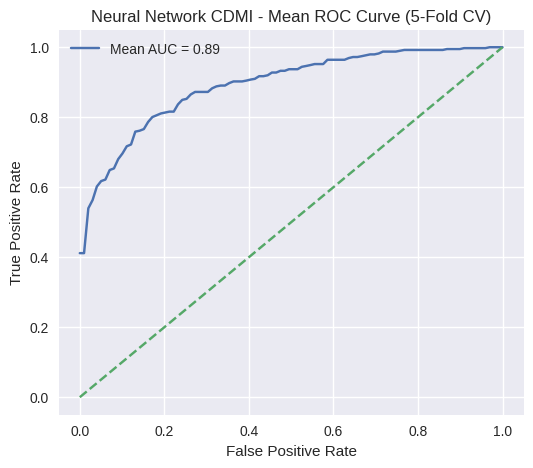

In [ ]:
X_NN_CDMI = dfcdmi.drop(['CDMI', 'CDARREST'], axis=1).values
y_NN_CDMI = dfcdmi['CDMI'].values

# Scale the features
scaler_NN_CDMI = StandardScaler()
X_scaled_NN_CDMI = scaler_NN_CDMI.fit_transform(X_NN_CDMI)

# Define the model creation function
def build_nn_CDMI_Model(input_dim, best_params_NN_CDMI):
    model_NN_CDMI = Sequential()
    model_NN_CDMI.add(Dense(best_params_NN_CDMI['units_1'], input_dim=input_dim, activation='relu'))
    model_NN_CDMI.add(Dropout(best_params_NN_CDMI['dropout_1']))
    model_NN_CDMI.add(Dense(best_params_NN_CDMI['units_2'], activation='relu'))
    model_NN_CDMI.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

    model_NN_CDMI.compile(optimizer=Adam(learning_rate=best_params_NN_CDMI['learning_rate']),
                          loss='binary_crossentropy', metrics=['accuracy'])
    return model_NN_CDMI

# Define the objective function for hyperparameter optimization
def optimize_nn_CDMI_with_optuna():
    def objective(trial):
        units_1 = trial.suggest_int('units_1', 64, 256)
        dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
        units_2 = trial.suggest_int('units_2', 32, 128)
        learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

        model_NN_CDMI = build_nn_CDMI_Model(X_scaled_NN_CDMI.shape[1],
                                            {'units_1': units_1, 'dropout_1': dropout_1, 'units_2': units_2, 'learning_rate': learning_rate})

        model_NN_CDMI.fit(X_scaled_NN_CDMI, y_NN_CDMI, epochs=10, batch_size=32, verbose=0)
        y_prob_NN_CDMI = model_NN_CDMI.predict(X_scaled_NN_CDMI).flatten()
        roc_auc_NN_CDMI = roc_auc_score(y_NN_CDMI, y_prob_NN_CDMI)

        return roc_auc_NN_CDMI

    study_NN_CDMI = optuna.create_study(direction='maximize')
    study_NN_CDMI.optimize(objective, n_trials=50)

    return study_NN_CDMI.best_params

# K-fold Cross-validation with additional metrics
def kfold_cross_validation_NN_CDMI(X_NN_CDMI, y_NN_CDMI, model_NN_CDMI, n_splits=5):
    kf_NN_CDMI = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    roc_auc_scores_NN_CDMI = []
    accuracy_scores_NN_CDMI = []
    precision_scores_NN_CDMI = []
    recall_scores_NN_CDMI = []
    f1_scores_NN_CDMI = []

    fpr_list_NN_CDMI, tpr_list_NN_CDMI = [], []

    for train_index, test_index in kf_NN_CDMI.split(X_NN_CDMI):
        X_train_NN_CDMI, X_test_NN_CDMI = X_NN_CDMI[train_index], X_NN_CDMI[test_index]
        y_train_NN_CDMI, y_test_NN_CDMI = y_NN_CDMI[train_index], y_NN_CDMI[test_index]

        model_NN_CDMI.fit(X_train_NN_CDMI, y_train_NN_CDMI, epochs=20, batch_size=32, verbose=0)
        y_prob_NN_CDMI = model_NN_CDMI.predict(X_test_NN_CDMI).flatten()
        y_pred_NN_CDMI = (y_prob_NN_CDMI > 0.5).astype(int)

        # Collect ROC metrics
        fpr_NN_CDMI, tpr_NN_CDMI, _ = roc_curve(y_test_NN_CDMI, y_prob_NN_CDMI)
        roc_auc_NN_CDMI = roc_auc_score(y_test_NN_CDMI, y_prob_NN_CDMI)

        fpr_list_NN_CDMI.append(fpr_NN_CDMI)
        tpr_list_NN_CDMI.append(tpr_NN_CDMI)
        roc_auc_scores_NN_CDMI.append(roc_auc_NN_CDMI)

        # Evaluation metrics
        accuracy_NN_CDMI = accuracy_score(y_test_NN_CDMI, y_pred_NN_CDMI)
        precision_NN_CDMI = precision_score(y_test_NN_CDMI, y_pred_NN_CDMI)
        recall_NN_CDMI = recall_score(y_test_NN_CDMI, y_pred_NN_CDMI)
        f1_NN_CDMI = f1_score(y_test_NN_CDMI, y_pred_NN_CDMI)

        accuracy_scores_NN_CDMI.append(accuracy_NN_CDMI)
        precision_scores_NN_CDMI.append(precision_NN_CDMI)
        recall_scores_NN_CDMI.append(recall_NN_CDMI)
        f1_scores_NN_CDMI.append(f1_NN_CDMI)

        print(f"Fold ROC AUC: {roc_auc_NN_CDMI:.4f} | Accuracy: {accuracy_NN_CDMI:.4f} | Precision: {precision_NN_CDMI:.4f} | Recall: {recall_NN_CDMI:.4f} | F1: {f1_NN_CDMI:.4f}")

    # Average ROC metrics across folds
    mean_fpr_NN_CDMI = np.linspace(0, 1, 100)
    mean_tpr_NN_CDMI = np.zeros_like(mean_fpr_NN_CDMI)

    # Interpolating ROC curves
    for fpr_NN_CDMI, tpr_NN_CDMI in zip(fpr_list_NN_CDMI, tpr_list_NN_CDMI):
        mean_tpr_NN_CDMI += np.interp(mean_fpr_NN_CDMI, fpr_NN_CDMI, tpr_NN_CDMI)

    mean_tpr_NN_CDMI /= len(fpr_list_NN_CDMI)
    mean_roc_auc_NN_CDMI = np.mean(roc_auc_scores_NN_CDMI)

    # Calculate the mean of other metrics
    mean_accuracy_NN_CDMI = np.mean(accuracy_scores_NN_CDMI)
    mean_precision_NN_CDMI = np.mean(precision_scores_NN_CDMI)
    mean_recall_NN_CDMI = np.mean(recall_scores_NN_CDMI)
    mean_f1_NN_CDMI = np.mean(f1_scores_NN_CDMI)

    print(f"\nAverage metrics across all folds:")
    print(f"Average ROC AUC: {mean_roc_auc_NN_CDMI:.4f}")
    print(f"Average Accuracy: {mean_accuracy_NN_CDMI:.4f}")
    print(f"Average Precision: {mean_precision_NN_CDMI:.4f}")
    print(f"Average Recall: {mean_recall_NN_CDMI:.4f}")
    print(f"Average F1 Score: {mean_f1_NN_CDMI:.4f}")

    return mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, mean_roc_auc_NN_CDMI, mean_accuracy_NN_CDMI, mean_precision_NN_CDMI, mean_recall_NN_CDMI, mean_f1_NN_CDMI


# Running the Final Model with K-fold Cross-validation
def run_nn_CDMI_Model():
    best_params_NN_CDMI = optimize_nn_CDMI_with_optuna()
    model_NN_CDMI = build_nn_CDMI_Model(X_scaled_NN_CDMI.shape[1], best_params_NN_CDMI)

    print("Running K-fold Cross-validation...\n")
    mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, mean_roc_auc_NN_CDMI, mean_accuracy_NN_CDMI, mean_precision_NN_CDMI, mean_recall_NN_CDMI, mean_f1_NN_CDMI = kfold_cross_validation_NN_CDMI(X_scaled_NN_CDMI, y_NN_CDMI, model_NN_CDMI, n_splits=5)

    # Print the results
    print(f"Average ROC AUC: {mean_roc_auc_NN_CDMI:.4f}")
    print(f"Average Accuracy: {mean_accuracy_NN_CDMI:.4f}")
    print(f"Average Precision: {mean_precision_NN_CDMI:.4f}")
    print(f"Average Recall: {mean_recall_NN_CDMI:.4f}")
    print(f"Average F1 Score: {mean_f1_NN_CDMI:.4f}")

    # Plot the mean ROC curve across folds
    plt.figure(figsize=(6, 5))
    plt.plot(mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, label=f'Mean AUC = {mean_roc_auc_NN_CDMI:.2f}')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Neural Network CDMI - Mean ROC Curve (5-Fold CV)')
    plt.legend()
    plt.show()

    return model_NN_CDMI, mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, mean_roc_auc_NN_CDMI


if __name__ == "__main__":
    model_NN_CDMI, mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, mean_roc_auc_NN_CDMI = run_nn_CDMI_Model()


/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_1111
Received: inputs=['Tensor(shape=(200, 21))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_1111
Received: inputs=['Tensor(shape=(400, 21))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_1111
Received: inputs=['Tensor(shape=(500, 21))']
  w

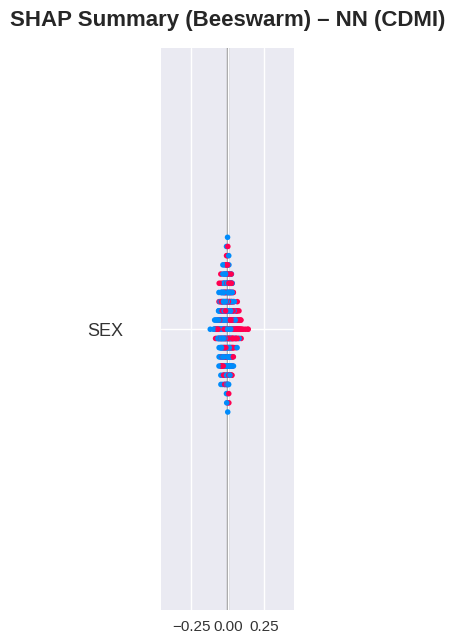

/tmp/ipython-input-3799355597.py:50: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(
/usr/local/lib/python3.12/dist-packages/shap/plots/_beeswarm.py:723: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(


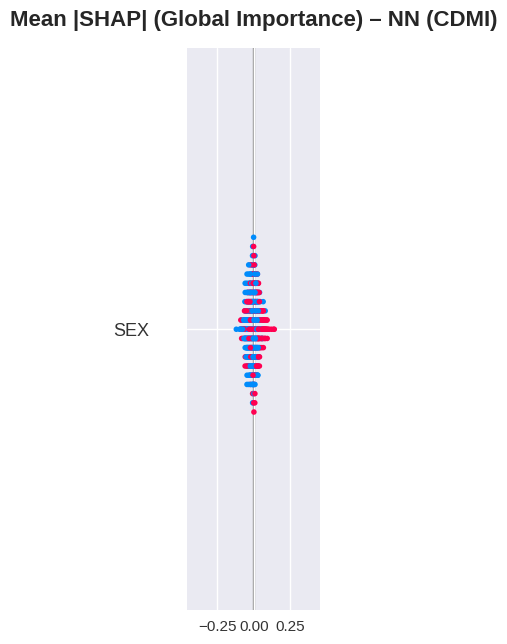

In [ ]:
import numpy as np
import shap
import matplotlib.pyplot as plt

# Feature names
feature_names = dfcdmi.drop(['CDMI', 'CDARREST'], axis=1).columns.tolist()

# Small background set for SHAP
rng = np.random.default_rng(42)
bg_n = min(200, X_scaled_NN_CDMI.shape[0])
bg_idx = rng.choice(X_scaled_NN_CDMI.shape[0], size=bg_n, replace=False)
X_bg = X_scaled_NN_CDMI[bg_idx]

# Choose instances to explain
explain_n = min(500, X_scaled_NN_CDMI.shape[0])
explain_idx = rng.choice(X_scaled_NN_CDMI.shape[0], size=explain_n, replace=False)
X_explain = X_scaled_NN_CDMI[explain_idx]

# Build the SHAP explainer
try:
    explainer = shap.DeepExplainer(model_NN_CDMI, X_bg)
    shap_values = explainer.shap_values(X_explain)
    if isinstance(shap_values, list):
        shap_values = shap_values[0]
except Exception as e:
    print(f"DeepExplainer unavailable ({e}). Falling back to KernelExplainer (slower).")
    f = lambda x: model_NN_CDMI.predict(x, verbose=0).flatten()
    explainer = shap.KernelExplainer(f, X_bg, link="logit")  # logit link fits sigmoid outputs
    shap_values = explainer.shap_values(X_explain, nsamples="auto")
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

# Plot SHAP summary
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 12})

# Beeswarm summary
shap.summary_plot(
    shap_values,
    X_explain,
    feature_names=feature_names,
    plot_size=(12, 6),
    show=False
)
plt.title("SHAP Summary (Beeswarm) – NN (CDMI)", fontsize=16, fontweight="bold", pad=16)
plt.tight_layout()
plt.show()

# Global importance
shap.summary_plot(
    shap_values,
    X_explain,
    feature_names=feature_names,
    plot_type="bar",
    plot_size=(10, 6),
    show=False
)
plt.title("Mean |SHAP| (Global Importance) – NN (CDMI)", fontsize=16, fontweight="bold", pad=16)
plt.tight_layout()
plt.show()


Saved LIME HTML: lime_nn_cdmi_idx_42.html
Saved LIME HTML: lime_nn_cdmi_idx_286.html
Saved LIME HTML: lime_nn_cdmi_idx_404.html


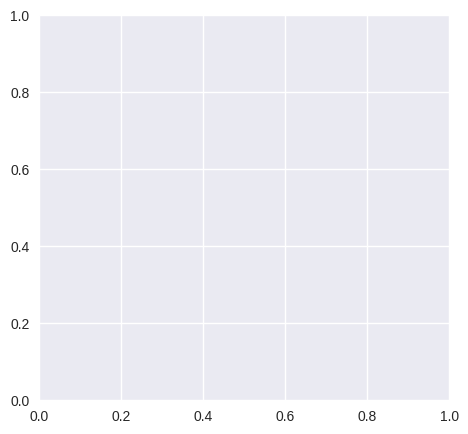

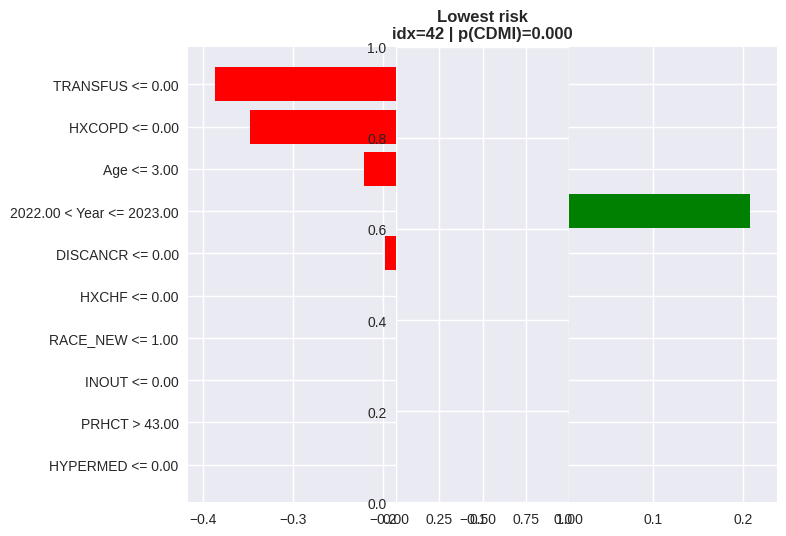

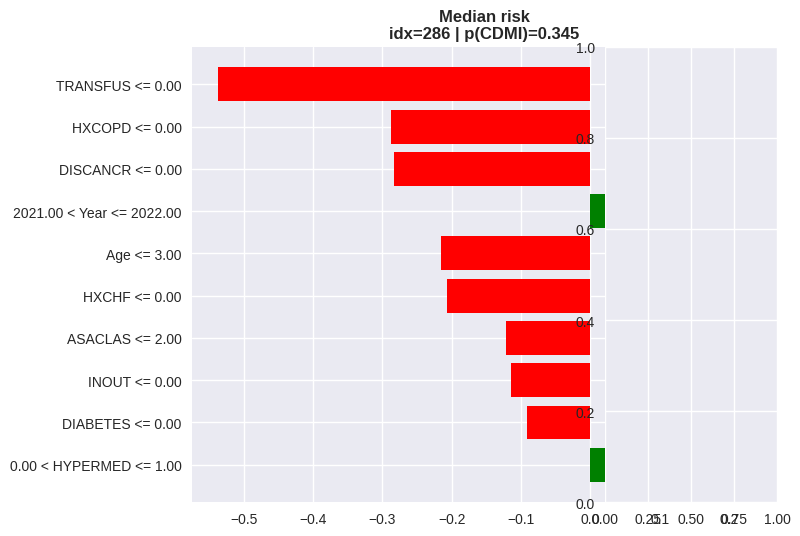

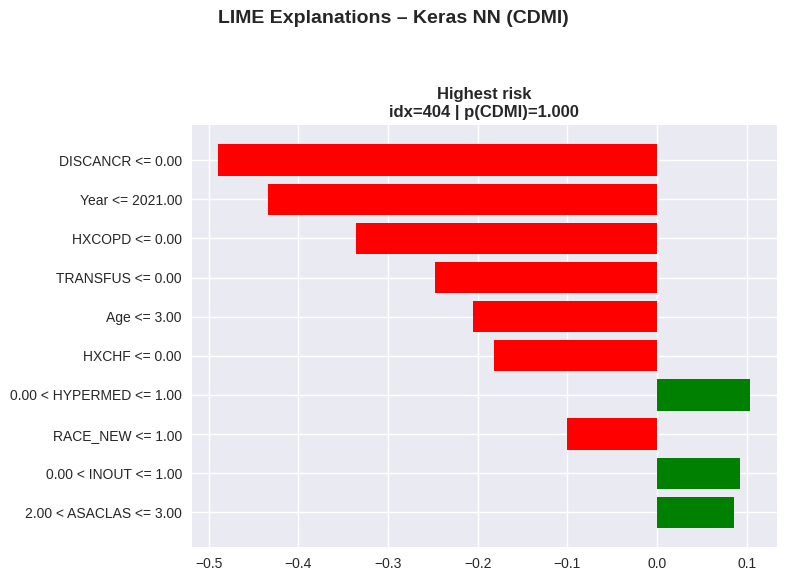

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_tabular

feature_names = dfcdmi.drop(['CDMI', 'CDARREST'], axis=1).columns.tolist()
X_raw = X_NN_CDMI

def predict_proba_on_raw(X_raw_batch: np.ndarray) -> np.ndarray:
    X_scaled = scaler_NN_CDMI.transform(X_raw_batch)
    p1 = model_NN_CDMI.predict(X_scaled, verbose=0).reshape(-1)
    p0 = 1.0 - p1
    return np.vstack([p0, p1]).T

# Create the LIME explainer on original-scale data
class_names = ["No CDMI", "CDMI"]
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_raw,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True,
    mode="classification",
    random_state=42
)

# Pick representative examples
probs_all = model_NN_CDMI.predict(X_scaled_NN_CDMI, verbose=0).reshape(-1)
order = np.argsort(probs_all)
idx_low  = int(order[0])
idx_mid  = int(order[len(order)//2])
idx_high = int(order[-1])
chosen = [("Lowest risk", idx_low), ("Median risk", idx_mid), ("Highest risk", idx_high)]

# Visualize explanations and save HTMLs
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 11})

plt.figure(figsize=(18, 5))
for i, (tag, idx) in enumerate(chosen, 1):
    instance_raw = X_raw[idx]

    exp = explainer.explain_instance(
        data_row=instance_raw,
        predict_fn=predict_proba_on_raw,
        num_features=min(10, len(feature_names))
    )

    # Draw as Matplotlib figure
    ax = plt.subplot(1, 3, i)
    exp.as_pyplot_figure(label=1)
    plt.title(f"{tag}\nidx={idx} | p(CDMI)={probs_all[idx]:.3f}",
              fontsize=12, fontweight="bold")
    plt.tight_layout()

    # Save interactive HTML
    html_path = f"lime_nn_cdmi_idx_{idx}.html"
    with open(html_path, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"Saved LIME HTML: {html_path}")

plt.suptitle("LIME Explanations – Keras NN (CDMI)", fontsize=14, fontweight="bold", y=1.05)
plt.tight_layout()
plt.show()



## Combined

In [ ]:
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import RandomOverSampler
from sklearn.neural_network import MLPClassifier

[I 2025-12-13 21:02:57,020] A new study created in memory with name: no-name-e15acd45-beaa-4cb5-b659-aaf34eddf559
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't co

Best hyperparameters: {'hidden_layer_size': 91, 'alpha': 0.0022451521899022717, 'learning_rate_init': 0.00010173425284362391}


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptro

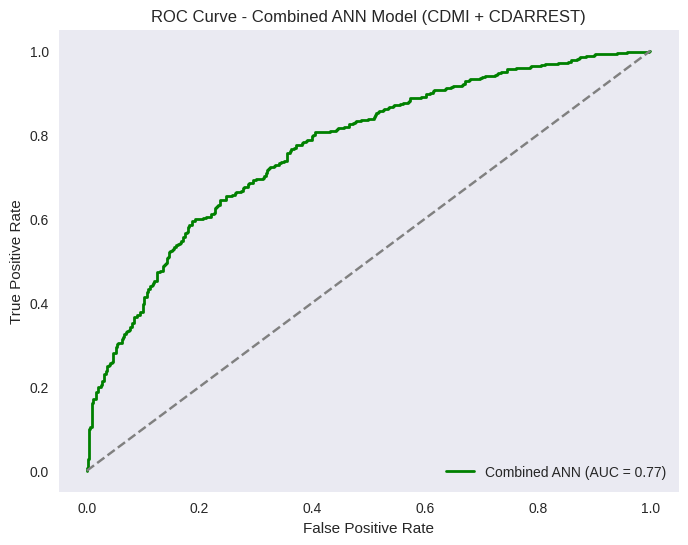

Combined ANN Model Metrics (CDMI + CDARREST):
AUC Score: 0.7690
Accuracy: 0.6985
F1 Score: 0.6916
Recall: 0.6763
Precision: 0.7077


In [ ]:
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score, recall_score, precision_score
import optuna
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Align & Combine Datasets
common_columns = dfcdmi.columns.intersection(dfca.columns)

dfcdmi_aligned = dfcdmi.reindex(columns=common_columns, fill_value=np.nan)
dfca_aligned = dfca.reindex(columns=common_columns, fill_value=np.nan)

X_combined = pd.concat([dfcdmi_aligned.drop(columns=['CDMI', 'CDARREST'], errors='ignore'),
                        dfca_aligned.drop(columns=['CDMI', 'CDARREST'], errors='ignore')],
                       axis=0)

y_combined = pd.concat([dfcdmi_aligned['CDMI'], dfca_aligned['CDARREST']], axis=0)

# Impute & Scale
imputer_combined = SimpleImputer(strategy='mean')
X_combined_imputed = imputer_combined.fit_transform(X_combined)

scaler_combined = StandardScaler()
X_combined_scaled = scaler_combined.fit_transform(X_combined_imputed)

# Optuna Objective Function
def objective_combined_nn(trial):
    hidden_layer_size = trial.suggest_int('hidden_layer_size', 50, 200)
    alpha = trial.suggest_float('alpha', 1e-5, 1e-1, log=True)
    learning_rate_init = trial.suggest_float('learning_rate_init', 1e-4, 1e-1, log=True)

    clf = MLPClassifier(
        hidden_layer_sizes=(hidden_layer_size,),
        alpha=alpha,
        learning_rate_init=learning_rate_init,
        max_iter=300,
        random_state=42
    )

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob = cross_val_predict(clf, X_combined_scaled, y_combined, cv=kf, method="predict_proba")[:, 1]

    fpr, tpr, _ = roc_curve(y_combined, y_pred_prob)
    return auc(fpr, tpr)


# Run Optuna
study_combined_nn = optuna.create_study(direction='maximize')
study_combined_nn.optimize(objective_combined_nn, n_trials=50)

# Train Final ANN Model
print("Best hyperparameters:", study_combined_nn.best_params)
best_params_combined = study_combined_nn.best_params

final_combined_nn = MLPClassifier(
    hidden_layer_sizes=(best_params_combined['hidden_layer_size'],),
    alpha=best_params_combined['alpha'],
    learning_rate_init=best_params_combined['learning_rate_init'],
    max_iter=300,
    random_state=42
)

kf_final = KFold(n_splits=5, shuffle=True, random_state=42)
y_pred_prob_combined = cross_val_predict(final_combined_nn, X_combined_scaled, y_combined, cv=kf_final, method="predict_proba")[:, 1]
y_pred_combined = cross_val_predict(final_combined_nn, X_combined_scaled, y_combined, cv=kf_final, method="predict")

# Metrics
fpr_combined, tpr_combined, _ = roc_curve(y_combined, y_pred_prob_combined)
roc_auc_combined = auc(fpr_combined, tpr_combined)

accuracy_combined = accuracy_score(y_combined, y_pred_combined)
f1_combined = f1_score(y_combined, y_pred_combined)
recall_combined = recall_score(y_combined, y_pred_combined)
precision_combined = precision_score(y_combined, y_pred_combined)

# ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_combined, tpr_combined, color='green', lw=2, label=f'Combined ANN (AUC = {roc_auc_combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined ANN Model (CDMI + CDARREST)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print Metrics
print(f'Combined ANN Model Metrics (CDMI + CDARREST):')
print(f'AUC Score: {roc_auc_combined:.4f}')
print(f'Accuracy: {accuracy_combined:.4f}')
print(f'F1 Score: {f1_combined:.4f}')
print(f'Recall: {recall_combined:.4f}')
print(f'Precision: {precision_combined:.4f}')


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(


Saved LIME HTML: lime_combined_ann_idx_289.html


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(


Saved LIME HTML: lime_combined_ann_idx_183.html


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SimpleImputer was fitted with feature names
  warnings.warn(


Saved LIME HTML: lime_combined_ann_idx_1012.html


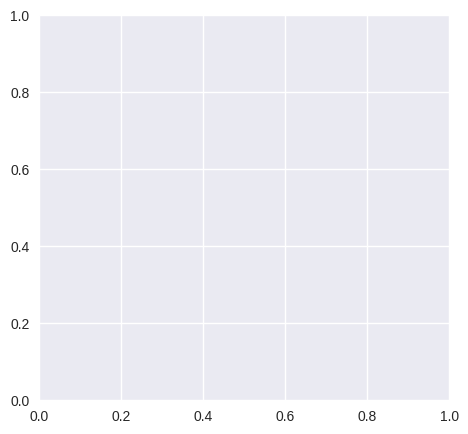

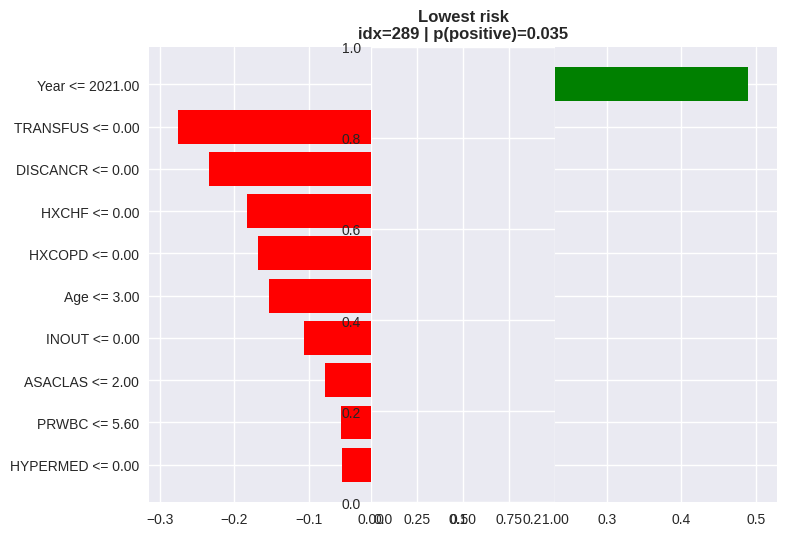

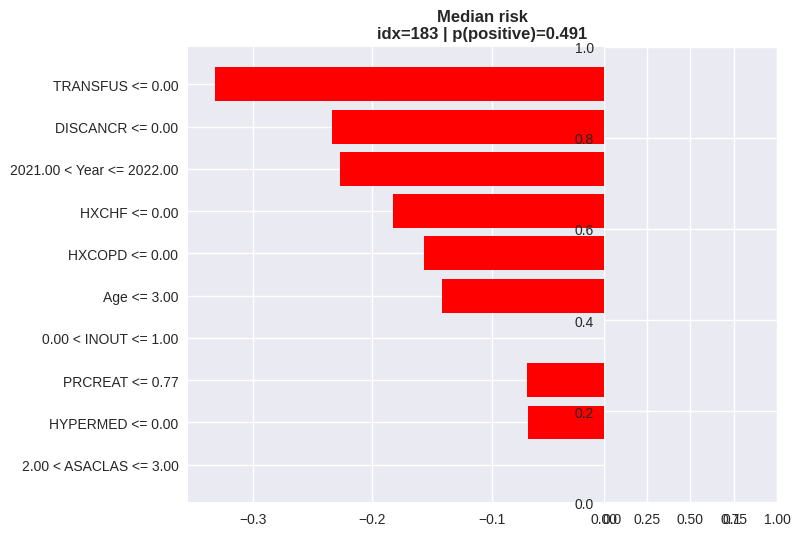

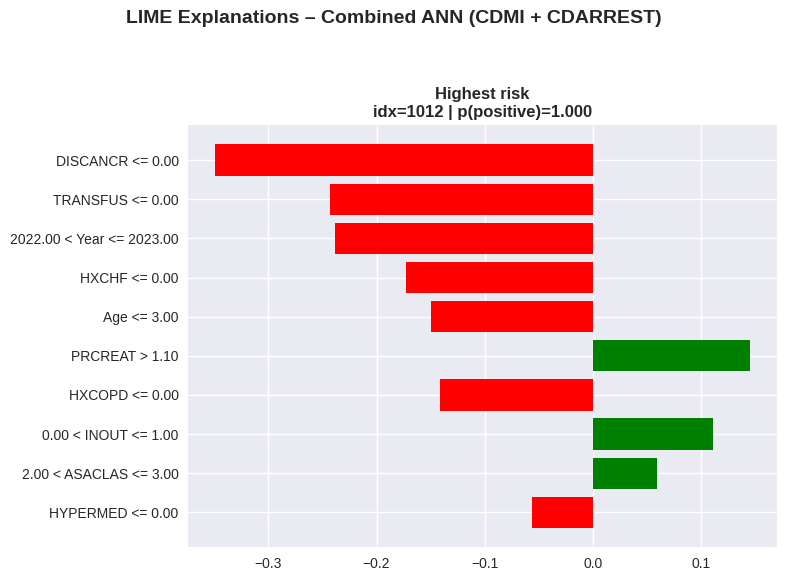

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_tabular

final_combined_nn.fit(X_combined_scaled, y_combined)

# Build original-scale matrix for LIME and get feature names
feature_names = list(X_combined.columns)
X_combined_imputed_unscaled = imputer_combined.transform(X_combined.values)

# LIME expects predict_proba
def predict_proba_on_raw(X_raw: np.ndarray) -> np.ndarray:
    X_imp = imputer_combined.transform(X_raw)
    X_scl = scaler_combined.transform(X_imp)
    p1 = final_combined_nn.predict_proba(X_scl)[:, 1]
    p0 = 1.0 - p1
    return np.vstack([p0, p1]).T

# Create the LIME explainer
class_names = [str(c) for c in np.unique(y_combined)]
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_combined_imputed_unscaled,
    feature_names=feature_names,
    class_names=class_names,
    discretize_continuous=True,
    mode="classification",
    random_state=42
)

# Pick representative instances
probs_all = final_combined_nn.predict_proba(X_combined_scaled)[:, 1]
order = np.argsort(probs_all)
idx_low  = int(order[0])
idx_mid  = int(order[len(order)//2])
idx_high = int(order[-1])
chosen = [("Lowest risk", idx_low), ("Median risk", idx_mid), ("Highest risk", idx_high)]

# Visualize and save interactive HTMLs
plt.style.use("seaborn-v0_8")
plt.rcParams.update({"font.size": 11})

plt.figure(figsize=(18, 5))
for i, (tag, idx) in enumerate(chosen, 1):
    instance_raw = X_combined.iloc[idx].values

    exp = explainer.explain_instance(
        data_row=imputer_combined.transform(instance_raw.reshape(1, -1)).ravel(),
        predict_fn=predict_proba_on_raw,
        num_features=min(10, len(feature_names))
    )

    # Draw as Matplotlib figure
    plt.subplot(1, 3, i)
    pos_idx = class_names.index(sorted(np.unique(y_combined))[-1].__str__())
    exp.as_pyplot_figure(label=pos_idx)
    plt.title(f"{tag}\nidx={idx} | p(positive)={probs_all[idx]:.3f}",
              fontsize=12, fontweight="bold")
    plt.tight_layout()

    # Save interactive HTML
    html_path = f"lime_combined_ann_idx_{idx}.html"
    with open(html_path, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"Saved LIME HTML: {html_path}")

plt.suptitle("LIME Explanations – Combined ANN (CDMI + CDARREST)", fontsize=14, fontweight="bold", y=1.05)
plt.tight_layout()
plt.show()


In [ ]:
# Align the columns of both datasets by adding missing columns with NaN values
common_columns_NN_Combined = dfcdmi.columns.intersection(dfca.columns)

# Add missing columns in each dataset
dfcdmi = dfcdmi.reindex(columns=common_columns_NN_Combined, fill_value=np.nan)
dfca = dfca.reindex(columns=common_columns_NN_Combined, fill_value=np.nan)

# Combine the features from both datasets
X_NN_Combined = pd.concat([dfcdmi.drop(columns=['CDMI']), dfca.drop(columns=['CDARREST'])], axis=0)

# Combine the targets separately
y_NN_Combined = pd.concat([dfcdmi['CDMI'], dfca['CDARREST']], axis=0)

# Impute missing values
imputer_NN_Combined = SimpleImputer(strategy='mean')
X_NN_Combined_imputed = imputer_NN_Combined.fit_transform(X_NN_Combined)
print(f"Shape of imputed combined features: {X_NN_Combined_imputed.shape}")

# Scale the imputed features
scaler_NN_Combined = StandardScaler()
X_NN_Combined_scaled = scaler_NN_Combined.fit_transform(X_NN_Combined_imputed)

# Verify the shape of the scaled features
print(f"Shape of scaled combined features: {X_NN_Combined_scaled.shape}")

# Define and initialize the neural network classifier
nn_classifier_NN_Combined = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)

# Fit the combined model using the scaled, imputed dataset
nn_classifier_NN_Combined.fit(X_NN_Combined_scaled, y_NN_Combined)

# Make predictions using the combined model
y_pred_combined_NN_Combined = nn_classifier_NN_Combined.predict(X_NN_Combined_scaled)

# Compute metrics for the combined model
accuracy_combined_NN_Combined = accuracy_score(y_NN_Combined, y_pred_combined_NN_Combined)
f1_combined_NN_Combined = f1_score(y_NN_Combined, y_pred_combined_NN_Combined)
recall_combined_NN_Combined = recall_score(y_NN_Combined, y_pred_combined_NN_Combined)
precision_combined_NN_Combined = precision_score(y_NN_Combined, y_pred_combined_NN_Combined)

# Print metrics for the combined model
print(f'Combined NN Model Metrics: ')
print(f'Accuracy: {accuracy_combined_NN_Combined:.4f}')
print(f'F1 Score: {f1_combined_NN_Combined:.4f}')
print(f'Recall: {recall_combined_NN_Combined:.4f}')
print(f'Precision: {precision_combined_NN_Combined:.4f}')

Shape of imputed combined features: (1038, 23)
Shape of scaled combined features: (1038, 23)
Combined NN Model Metrics: 
Accuracy: 0.9085
F1 Score: 0.9060
Recall: 0.8825
Precision: 0.9309


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


# Neural Network w/ MC

## Cardiac Arrest

[I 2025-12-13 21:19:36,429] A new study created in memory with name: no-name-28d99c4e-87f2-4aa0-a756-85a5243a9700
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:19:39,907] Trial 0 finished with value: 0.6004784688995215 and parameters: {'units_1': 79, 'dropout_1': 0.4374881198455398, 'units_2': 57, 'learning_rate': 0.00010005182125509749}. Best is trial 0 with value: 0.6004784688995215.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


[I 2025-12-13 21:19:44,318] Trial 1 finished with value: 0.7048302574618365 and parameters: {'units_1': 203, 'dropout_1': 0.479853103238449, 'units_2': 42, 'learning_rate': 0.0011624668533999174}. Best is trial 1 with value: 0.7048302574618365.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:19:48,043] Trial 2 finished with value: 0.7132604237867396 and parameters: {'units_1': 165, 'dropout_1': 0.22965112075523442, 'units_2': 32, 'learning_rate': 0.00017211954483374765}. Best is trial 2 with value: 0.7132604237867396.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-12-13 21:19:51,444] Trial 3 finished with value: 0.7219184324447482 and parameters: {'units_1': 157, 'dropout_1': 0.24761256508637053, 'units_2': 88, 'learning_rate': 0.0002515086334070212}. Best is trial 3 with value: 0.7219184324447482.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:19:54,777] Trial 4 finished with value: 0.7007290954659376 and parameters: {'units_1': 180, 'dropout_1': 0.44076318392583974, 'units_2': 76, 'learning_rate': 0.0022804131906951587}. Best is trial 3 with value: 0.7219184324447482.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:19:59,628] Trial 5 finished with value: 0.7265892002734108 and parameters: {'units_1': 139, 'dropout_1': 0.48205968934021093, 'units_2': 55, 'learning_rate': 0.004234536559046979}. Best is trial 5 with value: 0.7265892002734108.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


[I 2025-12-13 21:20:03,023] Trial 6 finished with value: 0.7528480291638187 and parameters: {'units_1': 73, 'dropout_1': 0.23202216407484794, 'units_2': 120, 'learning_rate': 0.00311328870126334}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:20:06,357] Trial 7 finished with value: 0.7222032353611301 and parameters: {'units_1': 81, 'dropout_1': 0.2401531324467422, 'units_2': 76, 'learning_rate': 0.00029370916060732753}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


[I 2025-12-13 21:20:09,925] Trial 8 finished with value: 0.5961494645705172 and parameters: {'units_1': 76, 'dropout_1': 0.3548882651994778, 'units_2': 65, 'learning_rate': 0.00013190900065376712}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:20:14,278] Trial 9 finished with value: 0.7485190248348143 and parameters: {'units_1': 78, 'dropout_1': 0.3250291818668454, 'units_2': 94, 'learning_rate': 0.0009432859047769597}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:20:17,550] Trial 10 finished with value: 0.7267031214399635 and parameters: {'units_1': 247, 'dropout_1': 0.3085059852115574, 'units_2': 128, 'learning_rate': 0.007829010612145106}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:20:20,801] Trial 11 finished with value: 0.6917862838915471 and parameters: {'units_1': 109, 'dropout_1': 0.31628916351559877, 'units_2': 111, 'learning_rate': 0.000831925669833795}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[I 2025-12-13 21:20:25,163] Trial 12 finished with value: 0.7134313055365687 and parameters: {'units_1': 117, 'dropout_1': 0.2027323561303464, 'units_2': 102, 'learning_rate': 0.000765437671277029}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:20:28,909] Trial 13 finished with value: 0.7181020733652312 and parameters: {'units_1': 112, 'dropout_1': 0.3705124650603656, 'units_2': 127, 'learning_rate': 0.003132147208743687}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:20:32,146] Trial 14 finished with value: 0.7222032353611301 and parameters: {'units_1': 64, 'dropout_1': 0.2900086265834764, 'units_2': 104, 'learning_rate': 0.0014995524109480112}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:20:35,432] Trial 15 finished with value: 0.7092162223741171 and parameters: {'units_1': 97, 'dropout_1': 0.3887050802522994, 'units_2': 113, 'learning_rate': 0.008916754372658623}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:20:40,241] Trial 16 finished with value: 0.7133173843700159 and parameters: {'units_1': 129, 'dropout_1': 0.28246914826319947, 'units_2': 94, 'learning_rate': 0.0004484812833323229}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:20:43,562] Trial 17 finished with value: 0.7396901344269766 and parameters: {'units_1': 93, 'dropout_1': 0.33270138189335735, 'units_2': 117, 'learning_rate': 0.0050085283843255245}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:20:46,893] Trial 18 finished with value: 0.7223171565276828 and parameters: {'units_1': 228, 'dropout_1': 0.41282174738607214, 'units_2': 86, 'learning_rate': 0.001992256882988322}. Best is trial 6 with value: 0.7528480291638187.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


[I 2025-12-13 21:20:50,678] Trial 19 finished with value: 0.6918432444748235 and parameters: {'units_1': 144, 'dropout_1': 0.26913231749326433, 'units_2': 95, 'learning_rate': 0.00058521785753642}. Best is trial 6 with value: 0.7528480291638187.


Running K-fold Cross-validation with MC Dropout...



/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━

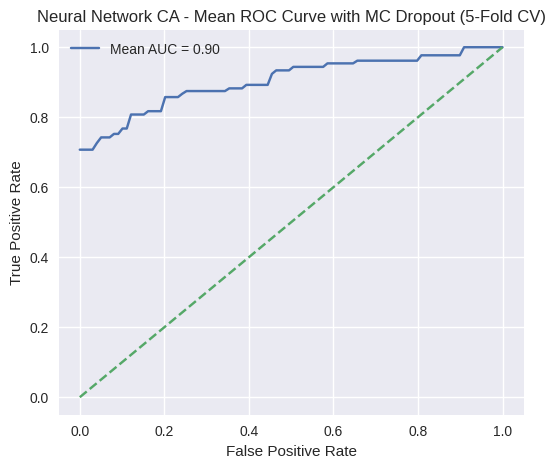

In [ ]:
# Preprocess data
def preprocess_data_NN_CA(df, target):
    if target not in df.columns:
        raise ValueError(f"Target column '{target}' not found in dataframe")

    X_NN_CA = df.drop(columns=[target])
    y_NN_CA = df[target].values
    scaler = StandardScaler()
    X_scaled_NN_CA = scaler.fit_transform(X_NN_CA)

    # Compute class weights to handle imbalanced classes
    class_weights_NN_CA = compute_class_weight('balanced', classes=np.unique(y_NN_CA), y=y_NN_CA)
    class_weight_dict_NN_CA = dict(zip(np.unique(y_NN_CA), class_weights_NN_CA))

    return X_scaled_NN_CA, y_NN_CA, class_weight_dict_NN_CA, X_NN_CA.columns

# Ensure dataset is loaded before function calls
TARGET_COLUMN_NN_CA = 'CDARREST'
X_scaled_NN_CA, y_NN_CA, class_weight_NN_CA, feature_names_NN_CA = preprocess_data_NN_CA(dfca, TARGET_COLUMN_NN_CA)

# MC Dropout enabling function
def enable_dropout_in_inference(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Dropout):
            layer.training = True
    return model

# Optimize Neural Network with Optuna
def optimize_nn_with_optuna():
    def nn_objective(trial):
        """
        Defines the Optuna objective function for tuning NN hyperparameters.
        """
        model = Sequential([
            Dense(trial.suggest_int('units_1', 64, 256), activation='relu', input_shape=(X_scaled_NN_CA.shape[1],)),
            Dropout(trial.suggest_float('dropout_1', 0.2, 0.5)),
            Dense(trial.suggest_int('units_2', 32, 128), activation='relu'),
            Dense(1, activation='sigmoid')
        ])

        model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),
                      loss='binary_crossentropy', metrics=['accuracy'])

        # Perform 3-fold cross-validation for fast optimization
        kf = KFold(n_splits=3, shuffle=True, random_state=42)
        accuracy_scores = []

        for train_index, val_index in kf.split(X_scaled_NN_CA):
            X_train, X_val = X_scaled_NN_CA[train_index], X_scaled_NN_CA[val_index]
            y_train, y_val = y_NN_CA[train_index], y_NN_CA[val_index]

            model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0, class_weight=class_weight_NN_CA)
            y_pred_prob = model.predict(X_val).flatten()
            accuracy = accuracy_score(y_val, (y_pred_prob > 0.5).astype(int))
            accuracy_scores.append(accuracy)

        return np.mean(accuracy_scores)

    # Run Optuna optimization
    study = optuna.create_study(direction='maximize')
    study.optimize(nn_objective, n_trials=20)

    return study.best_params

# Run Monte Carlo Dropout-enabled NN model
def run_nn_with_uncertainty():
    best_params_NN_CA = optimize_nn_with_optuna()
    model_NN_CA = Sequential([
        Dense(best_params_NN_CA['units_1'], activation='relu', input_shape=(X_scaled_NN_CA.shape[1],)),
        Dropout(best_params_NN_CA['dropout_1']),
        Dense(best_params_NN_CA['units_2'], activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model_NN_CA.compile(optimizer=Adam(learning_rate=best_params_NN_CA['learning_rate']),
                         loss='binary_crossentropy', metrics=['accuracy'])

    print("Running K-fold Cross-validation with MC Dropout...\n")

    kf_NN_CA = KFold(n_splits=5, shuffle=True, random_state=42)

    roc_auc_scores_mc_NN_CA = []
    fpr_list_mc_NN_CA, tpr_list_mc_NN_CA = [], []

    for train_index, test_index in kf_NN_CA.split(X_scaled_NN_CA):
        X_train_mc_NN_CA, X_test_mc_NN_CA = X_scaled_NN_CA[train_index], X_scaled_NN_CA[test_index]
        y_train_mc_NN_CA, y_test_mc_NN_CA = y_NN_CA[train_index], y_NN_CA[test_index]

        model_NN_CA.fit(X_train_mc_NN_CA, y_train_mc_NN_CA, epochs=20, batch_size=32, class_weight=class_weight_NN_CA, verbose=0)

        # Enable MC dropout during inference
        model_NN_CA = enable_dropout_in_inference(model_NN_CA)

        # Perform multiple stochastic passes for MC dropout
        n_mc_samples = 50
        y_prob_mc_NN_CA = np.zeros((n_mc_samples, len(y_test_mc_NN_CA)))

        for i in range(n_mc_samples):
            y_prob_mc_NN_CA[i] = model_NN_CA.predict(X_test_mc_NN_CA).flatten()

        # Compute uncertainty
        mean_pred_NN_CA = np.mean(y_prob_mc_NN_CA, axis=0)

        # Calculate metrics
        roc_auc_mc_NN_CA = roc_auc_score(y_test_mc_NN_CA, mean_pred_NN_CA)

        roc_auc_scores_mc_NN_CA.append(roc_auc_mc_NN_CA)

        # Collect ROC metrics
        fpr_mc_NN_CA, tpr_mc_NN_CA, _ = roc_curve(y_test_mc_NN_CA, mean_pred_NN_CA)
        fpr_list_mc_NN_CA.append(fpr_mc_NN_CA)
        tpr_list_mc_NN_CA.append(tpr_mc_NN_CA)

        print(f"Fold ROC AUC: {roc_auc_mc_NN_CA:.4f}")

    # Average ROC metrics across folds
    mean_fpr_mc_NN_CA = np.linspace(0, 1, 100)
    mean_tpr_mc_NN_CA = np.zeros_like(mean_fpr_mc_NN_CA)

    # Interpolating ROC curves
    for fpr_mc_NN_CA, tpr_mc_NN_CA in zip(fpr_list_mc_NN_CA, tpr_list_mc_NN_CA):
        mean_tpr_mc_NN_CA += np.interp(mean_fpr_mc_NN_CA, fpr_mc_NN_CA, tpr_mc_NN_CA)

    mean_tpr_mc_NN_CA /= len(fpr_list_mc_NN_CA)
    avg_roc_auc_mc_NN_CA = np.mean(roc_auc_scores_mc_NN_CA)

    print(f"\nAverage ROC AUC: {avg_roc_auc_mc_NN_CA:.4f}")

    # Plot the mean ROC curve across folds
    plt.figure(figsize=(6, 5))
    plt.plot(mean_fpr_mc_NN_CA, mean_tpr_mc_NN_CA, label=f'Mean AUC = {avg_roc_auc_mc_NN_CA:.2f}')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Neural Network CA - Mean ROC Curve with MC Dropout (5-Fold CV)')
    plt.legend()
    plt.show()

    return model_NN_CA, mean_fpr_mc_NN_CA, mean_tpr_mc_NN_CA, avg_roc_auc_mc_NN_CA

if __name__ == "__main__":
    model_NN_CA, mean_fpr_mc_NN_CA, mean_tpr_mc_NN_CA, avg_roc_auc_mc_NN_CA = run_nn_with_uncertainty()


[I 2025-12-13 21:24:50,984] A new study created in memory with name: no-name-d8dc174d-16ba-4551-bc84-fdfc848ca9b1
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[I 2025-12-13 21:25:00,427] Trial 0 finished with value: 0.7354180906812485 and parameters: {'units_1': 245, 'dropout_1': 0.26485002070909774, 'units_2': 103, 'learning_rate': 0.001848813072567767}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[I 2025-12-13 21:25:06,828] Trial 1 finished with value: 0.7351902483481432 and parameters: {'units_1': 237, 'dropout_1': 0.23067266483113447, 'units_2': 61, 'learning_rate': 0.0002098077848417231}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:25:12,104] Trial 2 finished with value: 0.6960013670539986 and parameters: {'units_1': 66, 'dropout_1': 0.20832047005990223, 'units_2': 89, 'learning_rate': 0.00044521531579890623}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-12-13 21:25:15,555] Trial 3 finished with value: 0.6831852358168148 and parameters: {'units_1': 242, 'dropout_1': 0.3228706398595271, 'units_2': 54, 'learning_rate': 0.00021938007378825557}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:25:18,856] Trial 4 finished with value: 0.717760309865573 and parameters: {'units_1': 244, 'dropout_1': 0.4028548882763319, 'units_2': 33, 'learning_rate': 0.00018034374390398113}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


[I 2025-12-13 21:25:22,756] Trial 5 finished with value: 0.7091592617908408 and parameters: {'units_1': 125, 'dropout_1': 0.4715026855371793, 'units_2': 90, 'learning_rate': 0.001534266280929728}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:25:26,679] Trial 6 finished with value: 0.7004442925495558 and parameters: {'units_1': 105, 'dropout_1': 0.46877509561162334, 'units_2': 61, 'learning_rate': 0.002387346175315877}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:25:29,883] Trial 7 finished with value: 0.6482683982683982 and parameters: {'units_1': 192, 'dropout_1': 0.329138104881058, 'units_2': 32, 'learning_rate': 0.00010379912835631863}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


[I 2025-12-13 21:25:33,078] Trial 8 finished with value: 0.7136021872863978 and parameters: {'units_1': 98, 'dropout_1': 0.31320088894571674, 'units_2': 68, 'learning_rate': 0.0022523268903790476}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


[I 2025-12-13 21:25:37,504] Trial 9 finished with value: 0.7007290954659376 and parameters: {'units_1': 204, 'dropout_1': 0.20904080528092212, 'units_2': 55, 'learning_rate': 0.007982794663840397}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:25:40,978] Trial 10 finished with value: 0.7092731829573934 and parameters: {'units_1': 168, 'dropout_1': 0.270023119356718, 'units_2': 124, 'learning_rate': 0.008786690579025636}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:25:44,215] Trial 11 finished with value: 0.7093301435406699 and parameters: {'units_1': 255, 'dropout_1': 0.2608919776995407, 'units_2': 111, 'learning_rate': 0.000596407652806755}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:25:47,454] Trial 12 finished with value: 0.7179311916154022 and parameters: {'units_1': 218, 'dropout_1': 0.26212707041336775, 'units_2': 107, 'learning_rate': 0.0008455469354596354}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:25:52,242] Trial 13 finished with value: 0.7137161084529505 and parameters: {'units_1': 160, 'dropout_1': 0.3834384916034926, 'units_2': 77, 'learning_rate': 0.004099506849904689}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:25:55,506] Trial 14 finished with value: 0.7308612440191388 and parameters: {'units_1': 218, 'dropout_1': 0.2469018947861066, 'units_2': 100, 'learning_rate': 0.00031688818674007087}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:25:58,773] Trial 15 finished with value: 0.7353041695146958 and parameters: {'units_1': 187, 'dropout_1': 0.3001502250125336, 'units_2': 123, 'learning_rate': 0.0010330109249079315}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[I 2025-12-13 21:26:02,230] Trial 16 finished with value: 0.7310890863522443 and parameters: {'units_1': 171, 'dropout_1': 0.2931390436623152, 'units_2': 123, 'learning_rate': 0.001223243764954024}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:26:06,717] Trial 17 finished with value: 0.7353611300979722 and parameters: {'units_1': 144, 'dropout_1': 0.37348246926563056, 'units_2': 114, 'learning_rate': 0.004215808984719982}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-12-13 21:26:09,978] Trial 18 finished with value: 0.7048872180451128 and parameters: {'units_1': 141, 'dropout_1': 0.36921524491579527, 'units_2': 111, 'learning_rate': 0.0042513590503338505}. Best is trial 0 with value: 0.7354180906812485.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-2591698118.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-12-13 21:26:13,238] Trial 19 finished with value: 0.7092162223741171 and parameters: {'units_1': 141, 'dropout_1': 0.4254950711537194, 'units_2': 98, 'learning_rate': 0.004624012733359806}. Best is trial 0 with value: 0.7354180906812485.


Running K-fold Cross-validation with MC Dropout...



/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1: AUC=0.6712, Accuracy=0.6522, Precision=0.7273, Recall=0.6154, F1=0.6667
Fold 2: AUC=0.9365, Accuracy=0.8261, Precision=0.8000, Recall=0.8000, F1=0.8000
Fold 3: AUC=0.9830, Accuracy=0.9565, Precision=0.9583, Recall=0.9583, F1=0.9583
Fold 4: AUC=0.9867, Accuracy=0.9130, Precision=0.9474, Recall=0.8571, F1=0.9000
Fold 5: AUC=1.0000, Accuracy=1.0000, Precision=1.0000, Recall=1.0000, F1=1.0000

=== Average Metrics Across 5 Folds ===
AUC: 0.9155
Accuracy: 0.8696
Precision: 0.8866
Recall: 0.8462
F1 Score: 0.8650


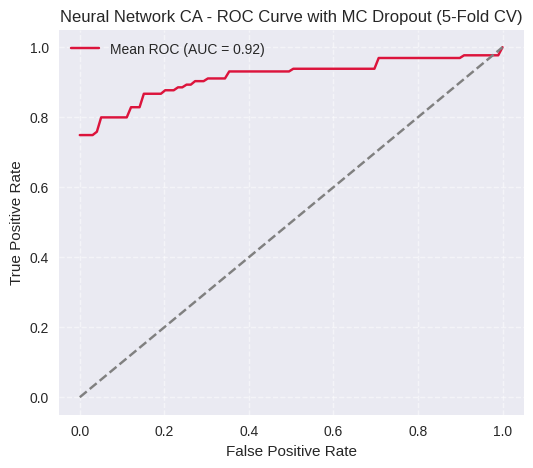

In [ ]:
def run_nn_with_uncertainty():

    best_params_NN_CA = optimize_nn_with_optuna()
    model_NN_CA = Sequential([
        Dense(best_params_NN_CA['units_1'], activation='relu', input_shape=(X_scaled_NN_CA.shape[1],)),
        Dropout(best_params_NN_CA['dropout_1']),
        Dense(best_params_NN_CA['units_2'], activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model_NN_CA.compile(
        optimizer=Adam(learning_rate=best_params_NN_CA['learning_rate']),
        loss='binary_crossentropy', metrics=['accuracy']
    )

    print("Running K-fold Cross-validation with MC Dropout...\n")

    kf_NN_CA = KFold(n_splits=5, shuffle=True, random_state=42)

    # Metrics containers
    roc_auc_scores, accuracy_scores, precision_scores, recall_scores, f1_scores = [], [], [], [], []
    fpr_list, tpr_list = [], []

    for fold_idx, (train_index, test_index) in enumerate(kf_NN_CA.split(X_scaled_NN_CA), start=1):
        X_train, X_test = X_scaled_NN_CA[train_index], X_scaled_NN_CA[test_index]
        y_train, y_test = y_NN_CA[train_index], y_NN_CA[test_index]

        model_NN_CA.fit(
            X_train, y_train, epochs=20, batch_size=32,
            class_weight=class_weight_NN_CA, verbose=0
        )

        # Enable MC dropout during inference
        model_NN_CA = enable_dropout_in_inference(model_NN_CA)

        # Perform multiple stochastic passes for MC dropout
        n_mc_samples = 50
        y_prob_mc = np.zeros((n_mc_samples, len(y_test)))

        for i in range(n_mc_samples):
            y_prob_mc[i] = model_NN_CA.predict(X_test, verbose=0).flatten()

        mean_pred = np.mean(y_prob_mc, axis=0)
        y_pred = (mean_pred > 0.5).astype(int)

        # Metrics
        roc_auc = roc_auc_score(y_test, mean_pred)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)

        roc_auc_scores.append(roc_auc)
        accuracy_scores.append(accuracy)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)

        fpr, tpr, _ = roc_curve(y_test, mean_pred)
        fpr_list.append(fpr)
        tpr_list.append(tpr)

        print(f"Fold {fold_idx}: AUC={roc_auc:.4f}, "
              f"Accuracy={accuracy:.4f}, Precision={precision:.4f}, "
              f"Recall={recall:.4f}, F1={f1:.4f}")

    # Average ROC curve
    mean_fpr = np.linspace(0, 1, 100)
    mean_tpr = np.zeros_like(mean_fpr)
    for fpr, tpr in zip(fpr_list, tpr_list):
        mean_tpr += np.interp(mean_fpr, fpr, tpr)
    mean_tpr /= len(fpr_list)

    # Average metrics
    avg_auc = np.mean(roc_auc_scores)
    avg_acc = np.mean(accuracy_scores)
    avg_prec = np.mean(precision_scores)
    avg_rec = np.mean(recall_scores)
    avg_f1 = np.mean(f1_scores)

    # Print overall averages
    print("\n=== Average Metrics Across 5 Folds ===")
    print(f"AUC: {avg_auc:.4f}")
    print(f"Accuracy: {avg_acc:.4f}")
    print(f"Precision: {avg_prec:.4f}")
    print(f"Recall: {avg_rec:.4f}")
    print(f"F1 Score: {avg_f1:.4f}")

    # Plot ROC
    plt.figure(figsize=(6, 5))
    plt.plot(mean_fpr, mean_tpr, label=f'Mean ROC (AUC = {avg_auc:.2f})', color='crimson')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Neural Network CA - ROC Curve with MC Dropout (5-Fold CV)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

    return model_NN_CA, avg_auc, avg_acc, avg_prec, avg_rec, avg_f1


if __name__ == "__main__":
    model_NN_CA, avg_auc, avg_acc, avg_prec, avg_rec, avg_f1 = run_nn_with_uncertainty()

Monte Carlo Accuracy (NN_CA) - Mean: 0.8696
Monte Carlo Accuracy (NN_CA) - Std Dev: 0.1375
95% Confidence Interval: (0.6989, 1.0403)


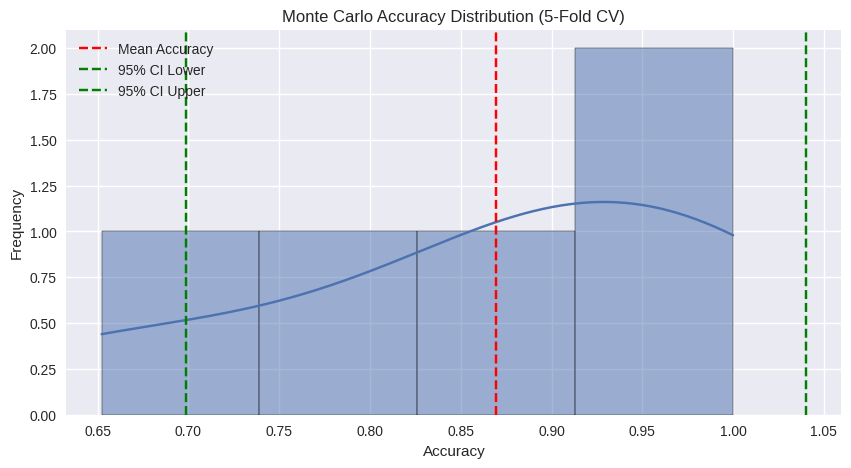

In [ ]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

#  Monte Carlo accuracy results from 5-fold CV
mc_results_NN_CA = np.array([0.6522, 0.8261, 0.9565, 0.9130, 1.0000])

# Mean accuracy
mean_accuracy_NN_CA = np.mean(mc_results_NN_CA)

# Standard deviation
std_dev_NN_CA = np.std(mc_results_NN_CA, ddof=1)  # sample std

# Standard error of the mean
std_error_NN_CA = std_dev_NN_CA / np.sqrt(len(mc_results_NN_CA))

# 95% confidence interval (t-distribution)
confidence_interval_NN_CA = stats.t.interval(
    0.95,
    df=len(mc_results_NN_CA) - 1,
    loc=mean_accuracy_NN_CA,
    scale=std_error_NN_CA
)

# Print statistics
print(f"Monte Carlo Accuracy (NN_CA) - Mean: {mean_accuracy_NN_CA:.4f}")
print(f"Monte Carlo Accuracy (NN_CA) - Std Dev: {std_dev_NN_CA:.4f}")
print(f"95% Confidence Interval: ({confidence_interval_NN_CA[0]:.4f}, "
      f"{confidence_interval_NN_CA[1]:.4f})")

# Visualization
plt.figure(figsize=(10, 5))
sns.histplot(mc_results_NN_CA, kde=True)
plt.axvline(mean_accuracy_NN_CA, color='red', linestyle='--', label='Mean Accuracy')
plt.axvline(confidence_interval_NN_CA[0], color='green', linestyle='--', label='95% CI Lower')
plt.axvline(confidence_interval_NN_CA[1], color='green', linestyle='--', label='95% CI Upper')
plt.title("Monte Carlo Accuracy Distribution (5-Fold CV)")
plt.xlabel("Accuracy")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

## CDMI

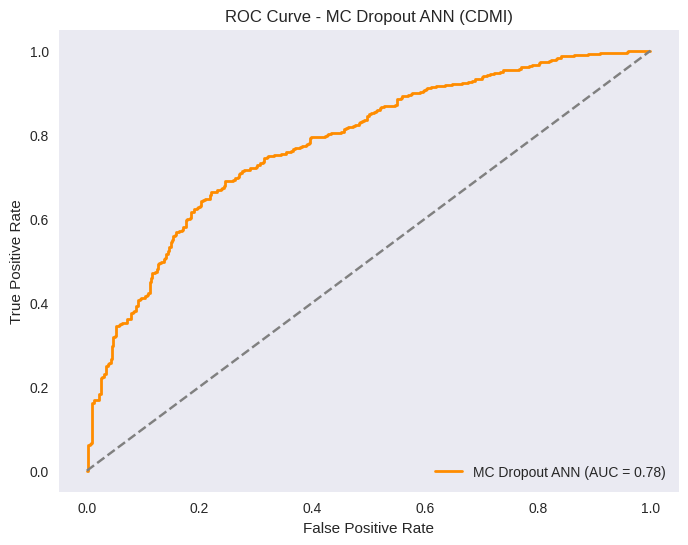

MC Dropout ANN Metrics for CDMI:
AUC Score: 0.7795
Accuracy: 0.7116
F1 Score: 0.7148
Recall: 0.7228
Precision: 0.7070


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score, recall_score, precision_score
import matplotlib.pyplot as plt

# Prepare Data
X_CDMI = dfcdmi.drop(columns=['CDMI', 'CDARREST'])
y_CDMI = dfcdmi['CDMI'].values

# Impute and scale
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X_CDMI)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Define MC Dropout Model
def build_mc_dropout_model(input_dim, dropout_rate=0.5):
    inputs = layers.Input(shape=(input_dim,))
    x = layers.Dense(128, activation='relu')(inputs)
    x = layers.Dropout(dropout_rate)(x, training=True)  # Enable MC Dropout
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x, training=True)
    outputs = layers.Dense(1, activation='sigmoid')(x)
    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# MC Prediction Function
def mc_predict(model, X, T=50):
    predictions = np.array([model(X, training=True).numpy().flatten() for _ in range(T)])
    return predictions.mean(axis=0), predictions.std(axis=0)

# 5-Fold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
y_true_all, y_pred_mean_all = [], []

for train_idx, test_idx in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_CDMI[train_idx], y_CDMI[test_idx]

    model = build_mc_dropout_model(input_dim=X_scaled.shape[1])
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    y_pred_mean, y_pred_std = mc_predict(model, tf.convert_to_tensor(X_test), T=50)

    y_true_all.extend(y_test)
    y_pred_mean_all.extend(y_pred_mean)

# Metrics
y_pred_binary = (np.array(y_pred_mean_all) > 0.5).astype(int)
fpr, tpr, _ = roc_curve(y_true_all, y_pred_mean_all)
roc_auc = auc(fpr, tpr)

accuracy = accuracy_score(y_true_all, y_pred_binary)
f1 = f1_score(y_true_all, y_pred_binary)
recall = recall_score(y_true_all, y_pred_binary)
precision = precision_score(y_true_all, y_pred_binary)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'MC Dropout ANN (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - MC Dropout ANN (CDMI)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print Results
print(f'MC Dropout ANN Metrics for CDMI:')
print(f'AUC Score: {roc_auc:.4f}')
print(f'Accuracy: {accuracy:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Recall: {recall:.4f}')
print(f'Precision: {precision:.4f}')

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
import optuna

# Ensure dataset is loaded before function calls
TARGET_COLUMN_NN_CDMI = 'CDMI'

# Data Preprocessing Function
def preprocess_data_NN_CDMI(df, target):

    if target not in df.columns:
        raise ValueError(f"Target column '{target}' not found in dataframe")

    X_NN_CDMI = df.drop(columns=[target])
    y_NN_CDMI = df[target].values  # Convert y to numpy array
    scaler = StandardScaler()
    X_scaled_NN_CDMI = scaler.fit_transform(X_NN_CDMI)

    # Compute class weights to handle imbalanced classes
    class_weights_NN_CDMI = compute_class_weight('balanced', classes=np.unique(y_NN_CDMI), y=y_NN_CDMI)
    class_weight_dict_NN_CDMI = dict(zip(np.unique(y_NN_CDMI), class_weights_NN_CDMI))

    return X_scaled_NN_CDMI, y_NN_CDMI, class_weight_dict_NN_CDMI, X_NN_CDMI.columns

# Load and Preprocess Data
X_scaled_NN_CDMI, y_NN_CDMI, class_weight_NN_CDMI, feature_names_NN_CDMI = preprocess_data_NN_CDMI(dfcdmi, TARGET_COLUMN_NN_CDMI)

# Enable MC Dropout During Inference
def enable_dropout_in_inference(model):

    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Dropout):
            layer.training = True  # Keep dropout active during inference
    return model

# Optimize Neural Network with Optuna
def optimize_nn_with_optuna():
    def nn_objective(trial):

        model = Sequential([
            Dense(trial.suggest_int('units_1', 64, 256), activation='relu', input_shape=(X_scaled_NN_CDMI.shape[1],)),
            Dropout(trial.suggest_float('dropout_1', 0.2, 0.5)),
            Dense(trial.suggest_int('units_2', 32, 128), activation='relu'),
            Dense(1, activation='sigmoid')
        ])

        model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),
                      loss='binary_crossentropy', metrics=['accuracy'])

        # Perform 3-fold cross-validation
        kf = KFold(n_splits=3, shuffle=True, random_state=42)
        accuracy_scores = []

        for train_index, val_index in kf.split(X_scaled_NN_CDMI):
            X_train, X_val = X_scaled_NN_CDMI[train_index], X_scaled_NN_CDMI[val_index]
            y_train, y_val = y_NN_CDMI[train_index], y_NN_CDMI[val_index]

            model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0, class_weight=class_weight_NN_CDMI)
            y_pred_prob = model.predict(X_val).flatten()
            accuracy = accuracy_score(y_val, (y_pred_prob > 0.5).astype(int))
            accuracy_scores.append(accuracy)

        return np.mean(accuracy_scores)

    # Run Optuna optimization
    study = optuna.create_study(direction='maximize')
    study.optimize(nn_objective, n_trials=20)

    return study.best_params

# Run Monte Carlo Dropout-Enabled NN Model
def run_nn_with_uncertainty():

    best_params_NN_CDMI = optimize_nn_with_optuna()
    model_NN_CDMI = Sequential([
        Dense(best_params_NN_CDMI['units_1'], activation='relu', input_shape=(X_scaled_NN_CDMI.shape[1],)),
        Dropout(best_params_NN_CDMI['dropout_1']),
        Dense(best_params_NN_CDMI['units_2'], activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model_NN_CDMI.compile(optimizer=Adam(learning_rate=best_params_NN_CDMI['learning_rate']),
                         loss='binary_crossentropy', metrics=['accuracy'])

    print("Running K-fold Cross-validation with MC Dropout...\n")

    kf_NN_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)

    roc_auc_scores_mc_NN_CDMI = []
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []

    for train_index, test_index in kf_NN_CDMI.split(X_scaled_NN_CDMI):
        X_train_mc_NN_CDMI, X_test_mc_NN_CDMI = X_scaled_NN_CDMI[train_index], X_scaled_NN_CDMI[test_index]
        y_train_mc_NN_CDMI, y_test_mc_NN_CDMI = y_NN_CDMI[train_index], y_NN_CDMI[test_index]

        model_NN_CDMI.fit(X_train_mc_NN_CDMI, y_train_mc_NN_CDMI, epochs=20, batch_size=32, class_weight=class_weight_NN_CDMI, verbose=0)

        # Enable MC dropout during inference
        model_NN_CDMI = enable_dropout_in_inference(model_NN_CDMI)

        # Perform multiple stochastic passes for MC dropout
        n_mc_samples = 50
        y_prob_mc_NN_CDMI = np.zeros((n_mc_samples, len(y_test_mc_NN_CDMI)))

        for i in range(n_mc_samples):
            y_prob_mc_NN_CDMI[i] = model_NN_CDMI.predict(X_test_mc_NN_CDMI).flatten()

        # Compute uncertainty
        mean_pred_NN_CDMI = np.mean(y_prob_mc_NN_CDMI, axis=0)

        # Convert probabilities to binary predictions
        y_pred = (mean_pred_NN_CDMI > 0.5).astype(int)

        # Calculate evaluation metrics
        roc_auc_mc_NN_CDMI = roc_auc_score(y_test_mc_NN_CDMI, mean_pred_NN_CDMI)
        accuracy = accuracy_score(y_test_mc_NN_CDMI, y_pred)
        precision = precision_score(y_test_mc_NN_CDMI, y_pred)
        recall = recall_score(y_test_mc_NN_CDMI, y_pred)
        f1 = f1_score(y_test_mc_NN_CDMI, y_pred)

        # Append metrics to lists
        roc_auc_scores_mc_NN_CDMI.append(roc_auc_mc_NN_CDMI)
        accuracy_scores.append(accuracy)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)

        print(f"Fold ROC AUC: {roc_auc_mc_NN_CDMI:.4f}")
        print(f"Fold Accuracy: {accuracy:.4f}")
        print(f"Fold Precision: {precision:.4f}")
        print(f"Fold Recall: {recall:.4f}")
        print(f"Fold F1 Score: {f1:.4f}\n")

    # Compute mean scores across all folds
    avg_roc_auc_mc_NN_CDMI = np.mean(roc_auc_scores_mc_NN_CDMI)
    avg_accuracy = np.mean(accuracy_scores)
    avg_precision = np.mean(precision_scores)
    avg_recall = np.mean(recall_scores)
    avg_f1 = np.mean(f1_scores)

    print(f"\nOverall Performance (Average across 5-Fold CV):")
    print(f"Mean ROC AUC: {avg_roc_auc_mc_NN_CDMI:.4f}")
    print(f"Mean Accuracy: {avg_accuracy:.4f}")
    print(f"Mean Precision: {avg_precision:.4f}")
    print(f"Mean Recall: {avg_recall:.4f}")
    print(f"Mean F1 Score: {avg_f1:.4f}")

    return model_NN_CDMI, avg_accuracy, avg_precision, avg_recall, avg_f1, avg_roc_auc_mc_NN_CDMI

if __name__ == "__main__":
    model_NN_CDMI, avg_accuracy, avg_precision, avg_recall, avg_f1, avg_roc_auc_mc_NN_CDMI = run_nn_with_uncertainty()

[I 2025-12-13 21:52:33,092] A new study created in memory with name: no-name-5703523b-607e-469b-8c6c-bc6bfe6571b9
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:52:38,513] Trial 0 finished with value: 0.7537335352700905 and parameters: {'units_1': 163, 'dropout_1': 0.2382062866762492, 'units_2': 38, 'learning_rate': 0.00046996331222912135}. Best is trial 0 with value: 0.7537335352700905.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:52:42,509] Trial 1 finished with value: 0.7450777915461931 and parameters: {'units_1': 145, 'dropout_1': 0.38852380929666486, 'units_2': 126, 'learning_rate': 0.0004876137267764563}. Best is trial 0 with value: 0.7537335352700905.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:52:46,569] Trial 2 finished with value: 0.7512689889393731 and parameters: {'units_1': 129, 'dropout_1': 0.32346166587934966, 'units_2': 123, 'learning_rate': 0.0014459015017562013}. Best is trial 0 with value: 0.7537335352700905.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:52:54,291] Trial 3 finished with value: 0.761159300564505 and parameters: {'units_1': 229, 'dropout_1': 0.26264517151781264, 'units_2': 51, 'learning_rate': 0.00030395093148186374}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:52:59,764] Trial 4 finished with value: 0.7450915599614484 and parameters: {'units_1': 199, 'dropout_1': 0.21285420887492587, 'units_2': 43, 'learning_rate': 0.0006616239513668517}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:53:05,548] Trial 5 finished with value: 0.7165955298545138 and parameters: {'units_1': 147, 'dropout_1': 0.3059206681117489, 'units_2': 100, 'learning_rate': 0.00011156157989922441}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:53:11,757] Trial 6 finished with value: 0.7191105603745008 and parameters: {'units_1': 127, 'dropout_1': 0.2950572918010801, 'units_2': 60, 'learning_rate': 0.00011973632653714706}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


[I 2025-12-13 21:53:17,024] Trial 7 finished with value: 0.7264950204231493 and parameters: {'units_1': 224, 'dropout_1': 0.27751268998654305, 'units_2': 51, 'learning_rate': 0.00011849333340039265}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:53:21,528] Trial 8 finished with value: 0.747551516820414 and parameters: {'units_1': 157, 'dropout_1': 0.49200754170499034, 'units_2': 123, 'learning_rate': 0.0002139821727540701}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:53:25,746] Trial 9 finished with value: 0.7228096746064528 and parameters: {'units_1': 173, 'dropout_1': 0.41707807994555723, 'units_2': 66, 'learning_rate': 0.0001918585488845644}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


[I 2025-12-13 21:53:30,956] Trial 10 finished with value: 0.7488044426086556 and parameters: {'units_1': 81, 'dropout_1': 0.2527661198150255, 'units_2': 84, 'learning_rate': 0.006230080247150577}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:53:35,298] Trial 11 finished with value: 0.7475698747074211 and parameters: {'units_1': 245, 'dropout_1': 0.2172301523117943, 'units_2': 33, 'learning_rate': 0.0016073207896348462}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:53:39,394] Trial 12 finished with value: 0.750025242094635 and parameters: {'units_1': 199, 'dropout_1': 0.23409708714090605, 'units_2': 34, 'learning_rate': 0.00038823284275457144}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


[I 2025-12-13 21:53:44,408] Trial 13 finished with value: 0.7302859240901373 and parameters: {'units_1': 253, 'dropout_1': 0.36003661542996934, 'units_2': 73, 'learning_rate': 0.0035070414514195626}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:53:48,734] Trial 14 finished with value: 0.7463169489191794 and parameters: {'units_1': 80, 'dropout_1': 0.2647381372364156, 'units_2': 52, 'learning_rate': 0.00029375899831806523}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-13 21:53:52,805] Trial 15 finished with value: 0.7537564826288494 and parameters: {'units_1': 192, 'dropout_1': 0.20125489600091073, 'units_2': 83, 'learning_rate': 0.0008710607759399634}. Best is trial 3 with value: 0.761159300564505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


[I 2025-12-13 21:53:57,610] Trial 16 finished with value: 0.7624214052962505 and parameters: {'units_1': 213, 'dropout_1': 0.20060104551921717, 'units_2': 89, 'learning_rate': 0.0009416386636136282}. Best is trial 16 with value: 0.7624214052962505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:54:02,262] Trial 17 finished with value: 0.7611960163385194 and parameters: {'units_1': 223, 'dropout_1': 0.33009844833357993, 'units_2': 96, 'learning_rate': 0.002377595990489031}. Best is trial 16 with value: 0.7624214052962505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


[I 2025-12-13 21:54:06,398] Trial 18 finished with value: 0.7438615815319657 and parameters: {'units_1': 218, 'dropout_1': 0.44745583333474387, 'units_2': 100, 'learning_rate': 0.002711982575829309}. Best is trial 16 with value: 0.7624214052962505.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/tmp/ipython-input-1376616270.py:54: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 0.0001, 0.01)),


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


[I 2025-12-13 21:54:11,174] Trial 19 finished with value: 0.7302354399008674 and parameters: {'units_1': 184, 'dropout_1': 0.33688606743855726, 'units_2': 100, 'learning_rate': 0.008207175397191947}. Best is trial 16 with value: 0.7624214052962505.


Running K-fold Cross-validation with MC Dropout...



/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
6/6 ━━━━━━━━

Monte Carlo Accuracy (NN_CA) - Mean: 0.8146
Monte Carlo Accuracy (NN_CA) - Std Dev: 0.0781
95% Confidence Interval: (0.7176, 0.9115)


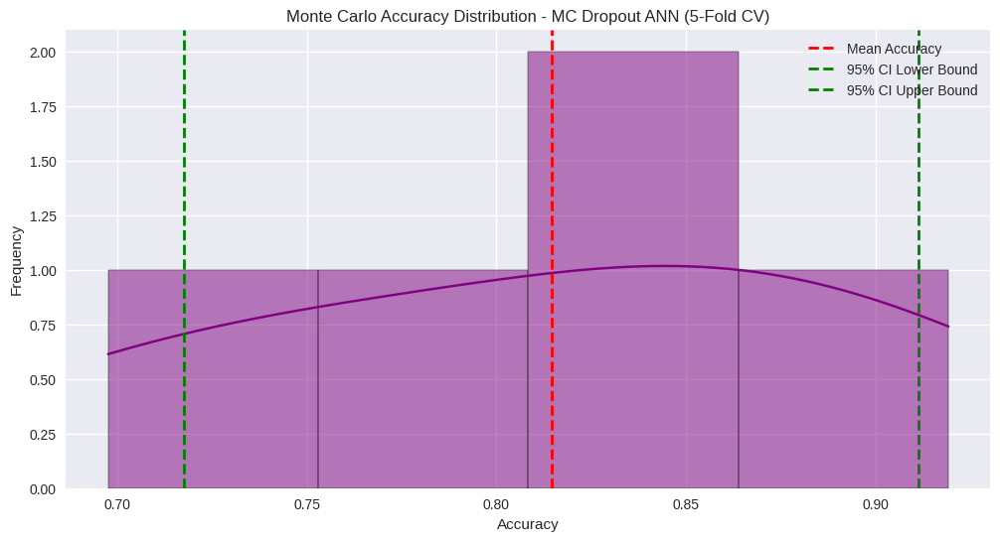

In [ ]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# Accuracies from each fold
mc_results_NN_CA = np.array([0.6975, 0.7593, 0.8333, 0.8634, 0.9193])

# Calculate mean, std error, and confidence interval for accuracy
mean_accuracy_NN_CA = np.mean(mc_results_NN_CA)

std_error_NN_CA = np.std(mc_results_NN_CA) / np.sqrt(len(mc_results_NN_CA))

confidence_interval_NN_CA = stats.t.interval(
    0.95,
    len(mc_results_NN_CA) - 1,
    loc=mean_accuracy_NN_CA,
    scale=std_error_NN_CA
)

# Print statistics
print("Monte Carlo Accuracy (NN_CA) - Mean: {:.4f}".format(mean_accuracy_NN_CA))
print("Monte Carlo Accuracy (NN_CA) - Std Dev: {:.4f}".format(np.std(mc_results_NN_CA)))
print("95% Confidence Interval: ({:.4f}, {:.4f})".format(
    confidence_interval_NN_CA[0], confidence_interval_NN_CA[1]
))

# Visualize Accuracy Distribution
plt.figure(figsize=(12, 6))
sns.histplot(mc_results_NN_CA, kde=True, color='purple')
plt.axvline(mean_accuracy_NN_CA, color='red', linestyle='dashed', linewidth=2, label="Mean Accuracy")
plt.axvline(confidence_interval_NN_CA[0], color='green', linestyle='dashed', linewidth=2, label="95% CI Lower Bound")
plt.axvline(confidence_interval_NN_CA[1], color='green', linestyle='dashed', linewidth=2, label="95% CI Upper Bound")
plt.title("Monte Carlo Accuracy Distribution - MC Dropout ANN (5-Fold CV)")
plt.xlabel("Accuracy")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()


## Combined

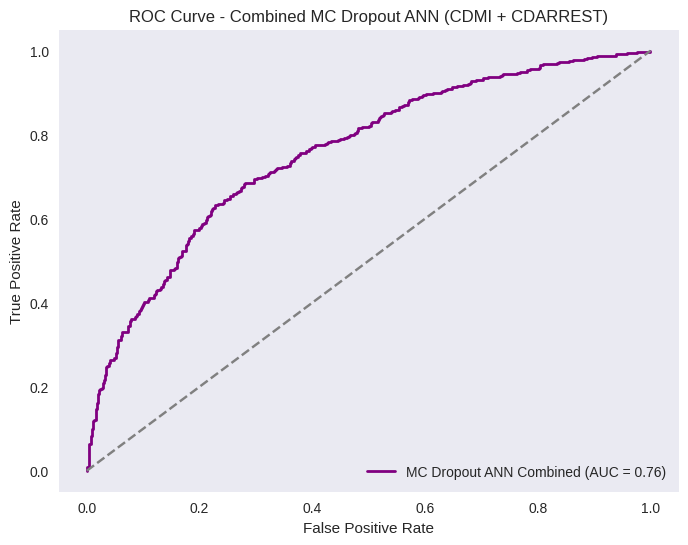

Combined MC Dropout ANN Metrics (CDMI + CDARREST):
AUC Score: 0.7585
Accuracy: 0.6975
F1 Score: 0.6934
Recall: 0.6840
Precision: 0.7030


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score, recall_score, precision_score
import matplotlib.pyplot as plt

# Align and Combine Datasets
common_columns = dfcdmi.columns.intersection(dfca.columns)

dfcdmi_aligned = dfcdmi.reindex(columns=common_columns, fill_value=np.nan)
dfca_aligned = dfca.reindex(columns=common_columns, fill_value=np.nan)

X_combined = pd.concat([dfcdmi_aligned.drop(columns=['CDMI', 'CDARREST'], errors='ignore'),
                        dfca_aligned.drop(columns=['CDMI', 'CDARREST'], errors='ignore')],
                       axis=0)

y_combined = pd.concat([
    (dfcdmi_aligned['CDMI'] == 1).astype(int),
    (dfca_aligned['CDARREST'] == 1).astype(int)
], axis=0).values

# Impute & Scale
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X_combined)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Define MC Dropout Model
def build_mc_dropout_model(input_dim, dropout_rate=0.5):
    inputs = layers.Input(shape=(input_dim,))
    x = layers.Dense(128, activation='relu')(inputs)
    x = layers.Dropout(dropout_rate)(x, training=True)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x, training=True)
    outputs = layers.Dense(1, activation='sigmoid')(x)
    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# MC Prediction Function
def mc_predict(model, X, T=50):
    predictions = np.array([model(X, training=True).numpy().flatten() for _ in range(T)])
    return predictions.mean(axis=0), predictions.std(axis=0)

# 5-Fold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
y_true_all, y_pred_mean_all, y_uncertainty_all = [], [], []

for train_idx, test_idx in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_combined[train_idx], y_combined[test_idx]

    model = build_mc_dropout_model(input_dim=X_scaled.shape[1])
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    y_pred_mean, y_pred_std = mc_predict(model, tf.convert_to_tensor(X_test), T=50)

    y_true_all.extend(y_test)
    y_pred_mean_all.extend(y_pred_mean)
    y_uncertainty_all.extend(y_pred_std)

# Metrics
y_pred_binary = (np.array(y_pred_mean_all) > 0.5).astype(int)
fpr, tpr, _ = roc_curve(y_true_all, y_pred_mean_all)
roc_auc = auc(fpr, tpr)

accuracy = accuracy_score(y_true_all, y_pred_binary)
f1 = f1_score(y_true_all, y_pred_binary)
recall = recall_score(y_true_all, y_pred_binary)
precision = precision_score(y_true_all, y_pred_binary)

# ROC Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='purple', lw=2, label=f'MC Dropout ANN Combined (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined MC Dropout ANN (CDMI + CDARREST)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Results
print(f'Combined MC Dropout ANN Metrics (CDMI + CDARREST):')
print(f'AUC Score: {roc_auc:.4f}')
print(f'Accuracy: {accuracy:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Recall: {recall:.4f}')
print(f'Precision: {precision:.4f}')

uncertainties = np.array(y_uncertainty_all)

In [ ]:
# 5-Fold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

y_true_all, y_pred_mean_all, y_uncertainty_all = [], [], []
fold_results = []

for fold, (train_idx, test_idx) in enumerate(kf.split(X_scaled), start=1):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y_combined[train_idx], y_combined[test_idx]

    model = build_mc_dropout_model(input_dim=X_scaled.shape[1])
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    y_pred_mean, y_pred_std = mc_predict(model, tf.convert_to_tensor(X_test), T=50)

    y_pred_bin_fold = (y_pred_mean > 0.5).astype(int)

    fpr_fold, tpr_fold, _ = roc_curve(y_test, y_pred_mean)
    auc_fold = auc(fpr_fold, tpr_fold)

    acc_fold = accuracy_score(y_test, y_pred_bin_fold)
    f1_fold = f1_score(y_test, y_pred_bin_fold, zero_division=0)
    rec_fold = recall_score(y_test, y_pred_bin_fold, zero_division=0)
    prec_fold = precision_score(y_test, y_pred_bin_fold, zero_division=0)

    fold_results.append([auc_fold, acc_fold, prec_fold, rec_fold, f1_fold])

    print(
        f"Fold {fold}: AUC={auc_fold:.4f}, Accuracy={acc_fold:.4f}, "
        f"Precision={prec_fold:.4f}, Recall={rec_fold:.4f}, F1={f1_fold:.4f}"
    )

    y_true_all.extend(y_test)
    y_pred_mean_all.extend(y_pred_mean)
    y_uncertainty_all.extend(y_pred_std)

# Convert fold results to array for mean/std summary
fold_results = np.array(fold_results)
print("\nAverage Metrics Across 5 Folds")
print(f"AUC:      {fold_results[:,0].mean():.4f} ± {fold_results[:,0].std(ddof=1):.4f}")
print(f"Accuracy: {fold_results[:,1].mean():.4f} ± {fold_results[:,1].std(ddof=1):.4f}")
print(f"Precision:{fold_results[:,2].mean():.4f} ± {fold_results[:,2].std(ddof=1):.4f}")
print(f"Recall:   {fold_results[:,3].mean():.4f} ± {fold_results[:,3].std(ddof=1):.4f}")
print(f"F1:       {fold_results[:,4].mean():.4f} ± {fold_results[:,4].std(ddof=1):.4f}")

Fold 1: AUC=0.7960, Accuracy=0.7596, Precision=0.7500, Recall=0.7647, F1=0.7573
Fold 2: AUC=0.6986, Accuracy=0.6587, Precision=0.6600, Recall=0.6408, F1=0.6502
Fold 3: AUC=0.7337, Accuracy=0.6635, Precision=0.6809, Recall=0.6154, F1=0.6465
Fold 4: AUC=0.8278, Accuracy=0.7246, Precision=0.6875, Recall=0.7778, F1=0.7299
Fold 5: AUC=0.7656, Accuracy=0.6522, Precision=0.7010, Recall=0.6126, F1=0.6538

Average Metrics Across 5 Folds
AUC:      0.7643 ± 0.0507
Accuracy: 0.6917 ± 0.0478
Precision:0.6959 ± 0.0337
Recall:   0.6823 ± 0.0821
F1:       0.6875 ± 0.0521


Monte Carlo Accuracy - Mean: 0.6917
Monte Carlo Accuracy - Std Dev: 0.0478
Monte Carlo Accuracy - Std Error: 0.0214
95% Confidence Interval: (0.6324, 0.7511)


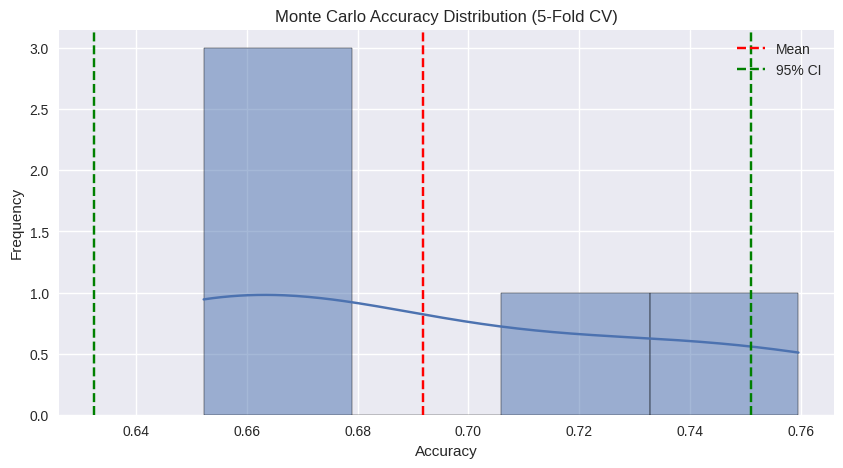

In [ ]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

mc_results = np.array([0.7596, 0.6587, 0.6635, 0.7246, 0.6522])

mean_acc = mc_results.mean()
std_acc = mc_results.std(ddof=1)
stderr = std_acc / np.sqrt(len(mc_results))

ci_low, ci_high = stats.t.interval(
    0.95, df=len(mc_results)-1, loc=mean_acc, scale=stderr
)

print(f"Monte Carlo Accuracy - Mean: {mean_acc:.4f}")
print(f"Monte Carlo Accuracy - Std Dev: {std_acc:.4f}")
print(f"Monte Carlo Accuracy - Std Error: {stderr:.4f}")
print(f"95% Confidence Interval: ({ci_low:.4f}, {ci_high:.4f})")

# Plot
plt.figure(figsize=(10, 5))
sns.histplot(mc_results, kde=True)
plt.axvline(mean_acc, color="red", linestyle="--", label="Mean")
plt.axvline(ci_low, color="green", linestyle="--", label="95% CI")
plt.axvline(ci_high, color="green", linestyle="--")
plt.title("Monte Carlo Accuracy Distribution (5-Fold CV)")
plt.xlabel("Accuracy")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Align the columns of both datasets by adding missing columns with NaN values
common_columns_NN_MC_Combined = dfcdmi.columns.intersection(dfca.columns)

# Add missing columns in each dataset
dfcdmi = dfcdmi.reindex(columns=common_columns_NN_MC_Combined, fill_value=np.nan)
dfca = dfca.reindex(columns=common_columns_NN_MC_Combined, fill_value=np.nan)

# Combine the features from both datasets
X_NN_MC_Combined = pd.concat([dfcdmi.drop(columns=['CDMI', 'CDARREST']), dfca.drop(columns=['CDARREST','CDMI'])], axis=0)

# Combine the targets separately
y_NN_MC_Combined = pd.concat([dfcdmi['CDMI'], dfca['CDARREST']], axis=0)

# Impute missing values using SimpleImputer
imputer_NN_MC_Combined = SimpleImputer(strategy='mean')
X_NN_MC_Combined_imputed = imputer_NN_MC_Combined.fit_transform(X_NN_MC_Combined)

# Verify the shape of the imputed data
print(f"Shape of imputed combined features: {X_NN_MC_Combined_imputed.shape}")

# Scale the imputed features
scaler_NN_MC_Combined = StandardScaler()
X_NN_MC_Combined_scaled = scaler_NN_MC_Combined.fit_transform(X_NN_MC_Combined_imputed)

# Verify the shape of the scaled features
print(f"Shape of scaled combined features: {X_NN_MC_Combined_scaled.shape}")

# Define and initialize the neural network classifier
nn_classifier_NN_MC_Combined = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)

# Fit the combined model using the scaled, imputed dataset
nn_classifier_NN_MC_Combined.fit(X_NN_MC_Combined_scaled, y_NN_MC_Combined)

# Make predictions using the combined model
y_pred_combined_NN_MC_Combined = nn_classifier_NN_MC_Combined.predict(X_NN_MC_Combined_scaled)

# Compute metrics for the combined model
accuracy_combined_NN_MC_Combined = accuracy_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)
f1_combined_NN_MC_Combined = f1_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)
recall_combined_NN_MC_Combined = recall_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)
precision_combined_NN_MC_Combined = precision_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)

# Print metrics for the combined model
print(f'Combined NN_MC_Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined_NN_MC_Combined:.4f}')
print(f'F1 Score: {f1_combined_NN_MC_Combined:.4f}')
print(f'Recall: {recall_combined_NN_MC_Combined:.4f}')
print(f'Precision: {precision_combined_NN_MC_Combined:.4f}')

Shape of imputed combined features: (1038, 21)
Shape of scaled combined features: (1038, 21)
Combined NN_MC_Combined Model Metrics: 
Accuracy: 0.8815
F1 Score: 0.8786
Recall: 0.8574
Precision: 0.9008


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


# ROC Vizualization Curve

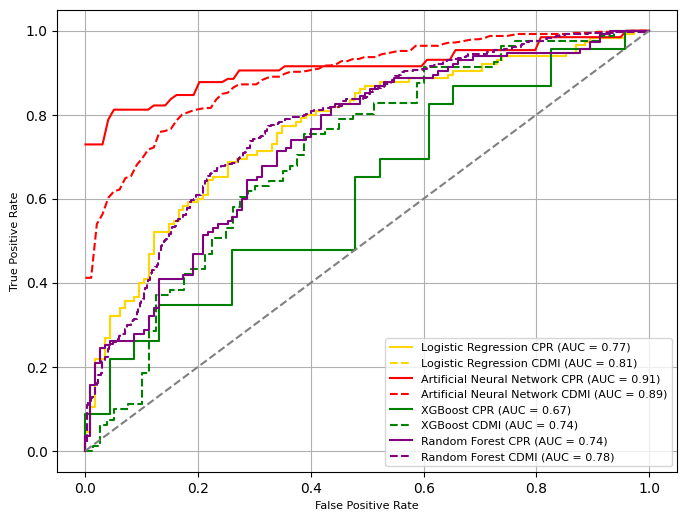

In [ ]:
plt.style.use('default')  # ensures white background and default colors
fig, ax = plt.subplots(figsize=(8, 6), facecolor='white')
ax.set_facecolor('white')


# Logistic Regression
plt.plot(LR_CA_fpr, LR_CA_tpr, linestyle='-', color='gold', label=f'Logistic Regression CPR (AUC = {roc_auc_LR_CA:.2f})')
plt.plot(LR_CA_fpr, LR_CA_tpr, linestyle='--', color='gold', label=f'Logistic Regression CDMI (AUC = {roc_auc_LR_CDMI:.2f})')

# Plot ROC curves
plt.plot(mean_fpr_NN_CA, mean_tpr_NN_CA, linestyle='-', color='red', label=f'Artificial Neural Network CPR (AUC = {mean_roc_auc_NN_CA:.2f})')
plt.plot(mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, linestyle='--', color='red', label=f'Artificial Neural Network CDMI (AUC = {mean_roc_auc_NN_CDMI:.2f})')

# XGBoost
plt.plot(fpr_XG_CA, tpr_XG_CA, linestyle='-', color='green', label=f'XGBoost CPR (AUC = {avg_roc_auc_XG_CA:.2f})')
plt.plot(fpr_XG_CDMI, tpr_XG_CDMI, linestyle='--', color='green', label=f'XGBoost CDMI (AUC = {avg_roc_auc_XG_CDMI:.2f})')

# Random Forest
plt.plot(fpr_RF_CA, tpr_RF_CA, linestyle='-', color='purple', label=f'Random Forest CPR (AUC = {roc_auc_RF_CA:.2f})')
plt.plot(fpr_RF_CDMI, tpr_RF_CDMI, linestyle='--', color='purple', label=f'Random Forest CDMI (AUC = {roc_auc_RF_CDMI:.2f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal reference line

# Formatting

plt.xlabel('False Positive Rate', fontsize=8)
plt.ylabel('True Positive Rate', fontsize=8)
plt.legend(loc='lower right', fontsize=8)
plt.grid(True)

# Show plot
plt.show()

NameError: name 'LR_CDMI_fpr' is not defined

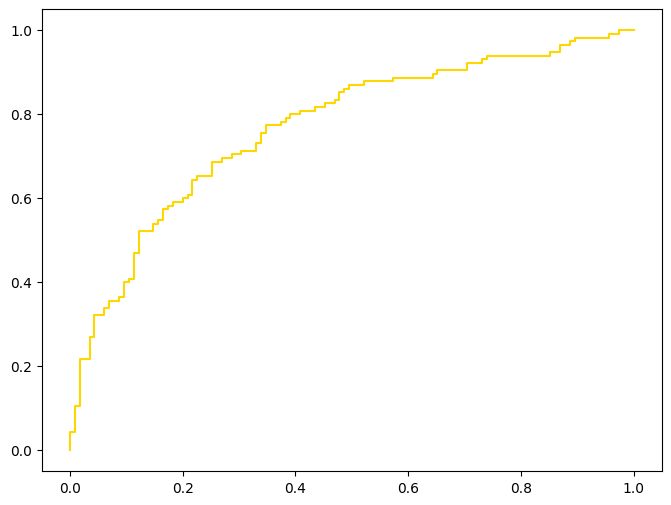

In [ ]:
import matplotlib.pyplot as plt

# Set white background for figure and axes
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 6), facecolor='white')
ax.set_facecolor('white')

# Logistic Regression
ax.plot(LR_CA_fpr, LR_CA_tpr, linestyle='-', color='gold',
        label=f'Logistic Regression CPR (AUC = {roc_auc_LR_CA:.2f})')
ax.plot(LR_CDMI_fpr, LR_CDMI_tpr, linestyle='--', color='gold',
        label=f'Logistic Regression CDMI (AUC = {roc_auc_LR_CDMI:.2f})')

# Artificial Neural Network
ax.plot(fpr_NN_CA, tpr_NN_CA, linestyle='-', color='red',
        label=f'Artificial Neural Network CPR (AUC = {0.96:.2f})')
ax.plot(fpr_NN_CDMI, tpr_NN_CDMI, linestyle='--', color='red',
        label=f'Artificial Neural Network CDMI (AUC = {0.86:.2f})')

# XGBoost
ax.plot(fpr_XG_CA, tpr_XG_CA, linestyle='-', color='green',
        label=f'XGBoost CPR (AUC = {avg_roc_auc_XG_CA:.2f})')
ax.plot(fpr_XG_CDMI, tpr_XG_CDMI, linestyle='--', color='green',
        label=f'XGBoost CDMI (AUC = {avg_roc_auc_XG_CDMI:.2f})')

# Random Forest
ax.plot(fpr_RF_CA, tpr_RF_CA, linestyle='-', color='purple',
        label=f'Random Forest CPR (AUC = {roc_auc_RF_CA:.2f})')
ax.plot(fpr_RF_CDMI, tpr_RF_CDMI, linestyle='--', color='purple',
        label=f'Random Forest CDMI (AUC = {roc_auc_RF_CDMI:.2f})')

# Reference diagonal line
ax.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)

# Formatting
ax.set_title('ROC Curve for CPR and CDMI across Models', fontsize=13, fontweight='bold')
ax.set_xlabel('False Positive Rate', fontsize=11)
ax.set_ylabel('True Positive Rate', fontsize=11)
ax.legend(loc='lower right', fontsize=9, frameon=True, facecolor='white', edgecolor='gray')
ax.grid(alpha=0.3, linestyle='--')

# Final touches
plt.tight_layout()
plt.show()

In [ ]:
# Scale the features
scaler_NN_CA = StandardScaler()
X_scaled_NN_CA = scaler_NN_CA.fit_transform(X_NN_CA)  # Fit and transform on the entire dataset

# Define hyperparameter optimization for the model
best_params_NN_CA = optimize_nn_CA_with_optuna()

# Build the model with the best parameters
model_NN_CA = Sequential()
model_NN_CA.add(Dense(best_params_NN_CA['units_1'], input_dim=X_scaled_NN_CA.shape[1], activation='relu'))
model_NN_CA.add(Dropout(best_params_NN_CA['dropout_1']))
model_NN_CA.add(Dense(best_params_NN_CA['units_2'], activation='relu'))
model_NN_CA.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

model_NN_CA.compile(optimizer=Adam(learning_rate=best_params_NN_CA['learning_rate']),
                     loss='binary_crossentropy', metrics=['accuracy'])

# K-fold Cross-validation
kf_NN_CA = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_CA = []
accuracy_scores_NN_CA = []
precision_scores_NN_CA = []
recall_scores_NN_CA = []
f1_scores_NN_CA = []

fpr_list_NN_CA, tpr_list_NN_CA = [], []

for train_index, test_index in kf_NN_CA.split(X_scaled_NN_CA):
    X_train_NN_CA, X_test_NN_CA = X_scaled_NN_CA[train_index], X_scaled_NN_CA[test_index]
    y_train_NN_CA, y_test_NN_CA = y_NN_CA[train_index], y_NN_CA[test_index]

    # Fit the model
    model_NN_CA.fit(X_train_NN_CA, y_train_NN_CA, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    y_prob_NN_CA = model_NN_CA.predict(X_test_NN_CA).flatten()
    y_pred_NN_CA = (y_prob_NN_CA > 0.5).astype(int)

    # Collect ROC metrics
    fpr_NN_CA, tpr_NN_CA, _ = roc_curve(y_test_NN_CA, y_prob_NN_CA)
    roc_auc_NN_CA = roc_auc_score(y_test_NN_CA, y_prob_NN_CA)

    fpr_list_NN_CA.append(fpr_NN_CA)
    tpr_list_NN_CA.append(tpr_NN_CA)
    roc_auc_scores_NN_CA.append(roc_auc_NN_CA)

    # Evaluation metrics
    accuracy_NN_CA = accuracy_score(y_test_NN_CA, y_pred_NN_CA)
    precision_NN_CA = precision_score(y_test_NN_CA, y_pred_NN_CA)
    recall_NN_CA = recall_score(y_test_NN_CA, y_pred_NN_CA)
    f1_NN_CA = f1_score(y_test_NN_CA, y_pred_NN_CA)

    accuracy_scores_NN_CA.append(accuracy_NN_CA)
    precision_scores_NN_CA.append(precision_NN_CA)
    recall_scores_NN_CA.append(recall_NN_CA)
    f1_scores_NN_CA.append(f1_NN_CA)

    print(f"Fold ROC AUC: {roc_auc_NN_CA:.4f} | Accuracy: {accuracy_NN_CA:.4f} | Precision: {precision_NN_CA:.4f} | Recall: {recall_NN_CA:.4f} | F1: {f1_NN_CA:.4f}")

# Average ROC metrics across folds
mean_fpr_NN_CA = np.linspace(0, 1, 100)  # Same length for all folds
mean_tpr_NN_CA = np.zeros_like(mean_fpr_NN_CA)

# Interpolating ROC curves
for fpr_NN_CA, tpr_NN_CA in zip(fpr_list_NN_CA, tpr_list_NN_CA):
    mean_tpr_NN_CA += np.interp(mean_fpr_NN_CA, fpr_NN_CA, tpr_NN_CA)

mean_tpr_NN_CA /= len(fpr_list_NN_CA)
mean_roc_auc_NN_CA = np.mean(roc_auc_scores_NN_CA)


[I 2025-11-02 20:23:09,380] A new study created in memory with name: no-name-ab4404e7-2ec5-4d08-90d0-2c16b91db9dd
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:11,469] Trial 0 finished with value: 0.7803402646502836 and parameters: {'units_1': 249, 'dropout_1': 0.40010855737398177, 'units_2': 107, 'learning_rate': 4.402380852513071e-05}. Best is trial 0 with value: 0.7803402646502836.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:13,551] Trial 1 finished with value: 0.9348204158790171 and parameters: {'units_1': 191, 'dropout_1': 0.2506450260303287, 'units_2': 50, 'learning_rate': 0.0005490358009194562}. Best is trial 1 with value: 0.9348204158790171.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:15,635] Trial 2 finished with value: 0.8893005671077504 and parameters: {'units_1': 175, 'dropout_1': 0.3079429735592548, 'units_2': 36, 'learning_rate': 0.00027645202616021945}. Best is trial 1 with value: 0.9348204158790171.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:17,732] Trial 3 finished with value: 0.8574669187145557 and parameters: {'units_1': 95, 'dropout_1': 0.4117661208218083, 'units_2': 56, 'learning_rate': 0.0003070626211154655}. Best is trial 1 with value: 0.9348204158790171.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-11-02 20:23:20,710] Trial 4 finished with value: 0.6604158790170133 and parameters: {'units_1': 232, 'dropout_1': 0.29007967664632167, 'units_2': 122, 'learning_rate': 1.1448865634716742e-05}. Best is trial 1 with value: 0.9348204158790171.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


[I 2025-11-02 20:23:23,293] Trial 5 finished with value: 0.9702079395085066 and parameters: {'units_1': 173, 'dropout_1': 0.44287743723607176, 'units_2': 39, 'learning_rate': 0.0019647599876915687}. Best is trial 5 with value: 0.9702079395085066.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:25,514] Trial 6 finished with value: 0.9840453686200378 and parameters: {'units_1': 212, 'dropout_1': 0.23315356057830253, 'units_2': 74, 'learning_rate': 0.0019248451468005762}. Best is trial 6 with value: 0.9840453686200378.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:27,650] Trial 7 finished with value: 0.943742911153119 and parameters: {'units_1': 251, 'dropout_1': 0.3979886208362726, 'units_2': 118, 'learning_rate': 0.000680183075252199}. Best is trial 6 with value: 0.9840453686200378.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:29,727] Trial 8 finished with value: 0.9852551984877127 and parameters: {'units_1': 132, 'dropout_1': 0.34358837854365554, 'units_2': 44, 'learning_rate': 0.0038592136402107197}. Best is trial 8 with value: 0.9852551984877127.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


[I 2025-11-02 20:23:32,006] Trial 9 finished with value: 0.7725519848771266 and parameters: {'units_1': 165, 'dropout_1': 0.36380261217970633, 'units_2': 97, 'learning_rate': 2.4194349067500436e-05}. Best is trial 8 with value: 0.9852551984877127.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-11-02 20:23:35,408] Trial 10 finished with value: 0.9923629489603025 and parameters: {'units_1': 111, 'dropout_1': 0.49719377980951995, 'units_2': 72, 'learning_rate': 0.008351033542552403}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-11-02 20:23:37,574] Trial 11 finished with value: 0.9818525519848771 and parameters: {'units_1': 115, 'dropout_1': 0.46218368324896003, 'units_2': 75, 'learning_rate': 0.009354033872845825}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:39,624] Trial 12 finished with value: 0.990321361058601 and parameters: {'units_1': 129, 'dropout_1': 0.4957590148848077, 'units_2': 61, 'learning_rate': 0.00833851539647476}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-11-02 20:23:44,826] Trial 13 finished with value: 0.9772400756143668 and parameters: {'units_1': 71, 'dropout_1': 0.49596949944334656, 'units_2': 62, 'learning_rate': 0.009519611413511202}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


[I 2025-11-02 20:23:48,131] Trial 14 finished with value: 0.9758790170132325 and parameters: {'units_1': 137, 'dropout_1': 0.49864510777377724, 'units_2': 91, 'learning_rate': 0.0035050843146045563}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:50,702] Trial 15 finished with value: 0.6703969754253309 and parameters: {'units_1': 92, 'dropout_1': 0.4489894079625628, 'units_2': 69, 'learning_rate': 9.909520989920384e-05}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:52,942] Trial 16 finished with value: 0.9757277882797731 and parameters: {'units_1': 139, 'dropout_1': 0.4717333772599673, 'units_2': 64, 'learning_rate': 0.003735319968819286}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-11-02 20:23:55,153] Trial 17 finished with value: 0.9504725897920604 and parameters: {'units_1': 107, 'dropout_1': 0.4337931320655279, 'units_2': 85, 'learning_rate': 0.0013559541331375638}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:23:57,397] Trial 18 finished with value: 0.9781474480151229 and parameters: {'units_1': 67, 'dropout_1': 0.3639591832180007, 'units_2': 82, 'learning_rate': 0.006673877204709912}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


[I 2025-11-02 20:24:00,170] Trial 19 finished with value: 0.7829111531190925 and parameters: {'units_1': 147, 'dropout_1': 0.20656665745346536, 'units_2': 55, 'learning_rate': 0.0001192920353533163}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:03,070] Trial 20 finished with value: 0.9425330812854442 and parameters: {'units_1': 118, 'dropout_1': 0.47652567055306716, 'units_2': 105, 'learning_rate': 0.0013059019203411411}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:05,217] Trial 21 finished with value: 0.9874480151228734 and parameters: {'units_1': 123, 'dropout_1': 0.3314507302146876, 'units_2': 45, 'learning_rate': 0.004402781045856206}. Best is trial 10 with value: 0.9923629489603025.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


[I 2025-11-02 20:24:07,472] Trial 22 finished with value: 0.9928166351606806 and parameters: {'units_1': 88, 'dropout_1': 0.32360657624596284, 'units_2': 46, 'learning_rate': 0.005558522751256994}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-11-02 20:24:09,605] Trial 23 finished with value: 0.9925897920604916 and parameters: {'units_1': 86, 'dropout_1': 0.28836595576274704, 'units_2': 62, 'learning_rate': 0.006316444955971347}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:11,712] Trial 24 finished with value: 0.9661247637051039 and parameters: {'units_1': 85, 'dropout_1': 0.28700973077096975, 'units_2': 33, 'learning_rate': 0.0026014412533962284}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-11-02 20:24:14,669] Trial 25 finished with value: 0.9919848771266541 and parameters: {'units_1': 84, 'dropout_1': 0.26110250209167774, 'units_2': 70, 'learning_rate': 0.005552586822806941}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:17,237] Trial 26 finished with value: 0.9229489603024575 and parameters: {'units_1': 104, 'dropout_1': 0.3148530323756773, 'units_2': 50, 'learning_rate': 0.0008641401791909377}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:19,319] Trial 27 finished with value: 0.9638563327032136 and parameters: {'units_1': 75, 'dropout_1': 0.2846375518333031, 'units_2': 57, 'learning_rate': 0.0024788960058741735}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:21,381] Trial 28 finished with value: 0.9882041587901702 and parameters: {'units_1': 100, 'dropout_1': 0.37612308353861873, 'units_2': 79, 'learning_rate': 0.005541388657706589}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


[I 2025-11-02 20:24:23,422] Trial 29 finished with value: 0.9103213610586012 and parameters: {'units_1': 79, 'dropout_1': 0.3202394393404681, 'units_2': 67, 'learning_rate': 0.0012080828604109257}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:25,453] Trial 30 finished with value: 0.7351984877126654 and parameters: {'units_1': 64, 'dropout_1': 0.3873432504949107, 'units_2': 46, 'learning_rate': 0.00018018890199127048}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


[I 2025-11-02 20:24:28,336] Trial 31 finished with value: 0.9852551984877127 and parameters: {'units_1': 86, 'dropout_1': 0.2606297840295638, 'units_2': 70, 'learning_rate': 0.006220742199667945}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:30,909] Trial 32 finished with value: 0.9903969754253309 and parameters: {'units_1': 105, 'dropout_1': 0.2668027002874972, 'units_2': 88, 'learning_rate': 0.0048378742173108245}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:33,029] Trial 33 finished with value: 0.9862381852551986 and parameters: {'units_1': 150, 'dropout_1': 0.24075360174769891, 'units_2': 77, 'learning_rate': 0.0029108579002902093}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:35,060] Trial 34 finished with value: 0.8986767485822307 and parameters: {'units_1': 87, 'dropout_1': 0.2140506222832386, 'units_2': 53, 'learning_rate': 0.00043926719322982084}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-11-02 20:24:37,167] Trial 35 finished with value: 0.9905482041587903 and parameters: {'units_1': 114, 'dropout_1': 0.3026062175911563, 'units_2': 60, 'learning_rate': 0.006593507106058114}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:39,307] Trial 36 finished with value: 0.9487334593572779 and parameters: {'units_1': 95, 'dropout_1': 0.2719013852833165, 'units_2': 38, 'learning_rate': 0.0018404516455643217}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-11-02 20:24:42,293] Trial 37 finished with value: 0.9779962192816636 and parameters: {'units_1': 95, 'dropout_1': 0.3412860628569141, 'units_2': 50, 'learning_rate': 0.0051793340600274134}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:44,755] Trial 38 finished with value: 0.7432136105860113 and parameters: {'units_1': 193, 'dropout_1': 0.2298357707241318, 'units_2': 71, 'learning_rate': 3.706209832898893e-05}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:46,818] Trial 39 finished with value: 0.9177315689981097 and parameters: {'units_1': 76, 'dropout_1': 0.4131828363010559, 'units_2': 66, 'learning_rate': 0.0009248908510574607}. Best is trial 22 with value: 0.9928166351606806.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:48,878] Trial 40 finished with value: 0.9970510396975425 and parameters: {'units_1': 235, 'dropout_1': 0.2978992606412963, 'units_2': 94, 'learning_rate': 0.009910092774932926}. Best is trial 40 with value: 0.9970510396975425.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:50,941] Trial 41 finished with value: 0.9984877126654065 and parameters: {'units_1': 235, 'dropout_1': 0.298693667267453, 'units_2': 98, 'learning_rate': 0.009614337218298182}. Best is trial 41 with value: 0.9984877126654065.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:53,082] Trial 42 finished with value: 0.9982608695652174 and parameters: {'units_1': 233, 'dropout_1': 0.3034533926967098, 'units_2': 100, 'learning_rate': 0.009706974331714453}. Best is trial 41 with value: 0.9984877126654065.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


[I 2025-11-02 20:24:55,904] Trial 43 finished with value: 0.9965217391304346 and parameters: {'units_1': 236, 'dropout_1': 0.29974587972507066, 'units_2': 108, 'learning_rate': 0.009569925796539322}. Best is trial 41 with value: 0.9984877126654065.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:24:58,343] Trial 44 finished with value: 1.0 and parameters: {'units_1': 237, 'dropout_1': 0.29948098255294475, 'units_2': 112, 'learning_rate': 0.009742695726035986}. Best is trial 44 with value: 1.0.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:25:00,424] Trial 45 finished with value: 0.9995463137996219 and parameters: {'units_1': 238, 'dropout_1': 0.30359452860815467, 'units_2': 113, 'learning_rate': 0.008972210135096234}. Best is trial 44 with value: 1.0.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:25:02,496] Trial 46 finished with value: 0.5831379962192818 and parameters: {'units_1': 219, 'dropout_1': 0.3052118849427495, 'units_2': 113, 'learning_rate': 1.0518386060421898e-05}. Best is trial 44 with value: 1.0.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:25:04,556] Trial 47 finished with value: 0.9996219281663516 and parameters: {'units_1': 237, 'dropout_1': 0.27529243702946815, 'units_2': 99, 'learning_rate': 0.007956350185857022}. Best is trial 44 with value: 1.0.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


[I 2025-11-02 20:25:06,616] Trial 48 finished with value: 0.9990926275992438 and parameters: {'units_1': 255, 'dropout_1': 0.2763303790874444, 'units_2': 127, 'learning_rate': 0.0035344283456568365}. Best is trial 44 with value: 1.0.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


[I 2025-11-02 20:25:09,702] Trial 49 finished with value: 1.0 and parameters: {'units_1': 256, 'dropout_1': 0.2475183069754262, 'units_2': 127, 'learning_rate': 0.0035652048141242747}. Best is trial 44 with value: 1.0.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Fold ROC AUC: 0.8269 | Accuracy: 0.7609 | Precision: 0.8000 | Recall: 0.7692 | F1: 0.7843
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Fold ROC AUC: 0.9769 | Accuracy: 0.9130 | Precision: 0.8636 | Recall: 0.9500 | F1: 0.9048
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Fold ROC AUC: 0.9905 | Accuracy: 0.9130 | Precision: 1.0000 | Recall: 0.8333 | F1: 0.9091
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Fold ROC AUC: 1.0000 | Accuracy: 1.0000 | Precision: 1.0000 | Recall: 1.0000 | F1: 1.0000
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Fold ROC AUC: 1.0000 | Accuracy: 0.9348 | Precision: 1.0000 | Recall: 0.8750 | F1: 0.9333


[I 2025-11-02 20:25:29,008] A new study created in memory with name: no-name-14c46e5f-b520-4c8e-adec-945a8ac4cefb
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:31,446] Trial 0 finished with value: 0.9223728065875894 and parameters: {'units_1': 237, 'dropout_1': 0.3853093853837598, 'units_2': 35, 'learning_rate': 0.0016063538775323892}. Best is trial 0 with value: 0.9223728065875894.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-11-02 20:25:34,121] Trial 1 finished with value: 0.846608175669052 and parameters: {'units_1': 70, 'dropout_1': 0.2865369957115964, 'units_2': 96, 'learning_rate': 0.0001247812114888479}. Best is trial 0 with value: 0.9223728065875894.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:37,579] Trial 2 finished with value: 0.8834918145279874 and parameters: {'units_1': 105, 'dropout_1': 0.24709648658209507, 'units_2': 52, 'learning_rate': 0.0004370812615240492}. Best is trial 0 with value: 0.9223728065875894.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:40,040] Trial 3 finished with value: 0.8833263895696499 and parameters: {'units_1': 237, 'dropout_1': 0.2885217328936538, 'units_2': 124, 'learning_rate': 0.00023215186951349543}. Best is trial 0 with value: 0.9223728065875894.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:42,505] Trial 4 finished with value: 0.7431011665522987 and parameters: {'units_1': 222, 'dropout_1': 0.36359771618150455, 'units_2': 93, 'learning_rate': 2.7065072251702762e-05}. Best is trial 0 with value: 0.9223728065875894.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:45,011] Trial 5 finished with value: 0.9297862954612293 and parameters: {'units_1': 202, 'dropout_1': 0.3923402066007654, 'units_2': 122, 'learning_rate': 0.0014999567860695085}. Best is trial 5 with value: 0.9297862954612293.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:25:47,739] Trial 6 finished with value: 0.9148796686599354 and parameters: {'units_1': 126, 'dropout_1': 0.21694472342815088, 'units_2': 39, 'learning_rate': 0.0011296209465383028}. Best is trial 5 with value: 0.9297862954612293.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:51,258] Trial 7 finished with value: 0.8097980590138223 and parameters: {'units_1': 130, 'dropout_1': 0.3429902261771235, 'units_2': 89, 'learning_rate': 4.5642826544280265e-05}. Best is trial 5 with value: 0.9297862954612293.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:53,699] Trial 8 finished with value: 0.9653342809528477 and parameters: {'units_1': 189, 'dropout_1': 0.2133947600356772, 'units_2': 41, 'learning_rate': 0.007463556641072384}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:25:56,094] Trial 9 finished with value: 0.8256788550142142 and parameters: {'units_1': 151, 'dropout_1': 0.27779238764908654, 'units_2': 71, 'learning_rate': 4.362643137857236e-05}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-11-02 20:26:03,150] Trial 10 finished with value: 0.9363236447407117 and parameters: {'units_1': 191, 'dropout_1': 0.4842074757819337, 'units_2': 65, 'learning_rate': 0.007841261576217328}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:26:06,253] Trial 11 finished with value: 0.9384496617978629 and parameters: {'units_1': 186, 'dropout_1': 0.49952763655489535, 'units_2': 63, 'learning_rate': 0.0056602099574305205}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:08,954] Trial 12 finished with value: 0.9388295265170081 and parameters: {'units_1': 178, 'dropout_1': 0.49974661760906, 'units_2': 52, 'learning_rate': 0.0096579602911884}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:11,577] Trial 13 finished with value: 0.9347429173610431 and parameters: {'units_1': 167, 'dropout_1': 0.44844043992342275, 'units_2': 49, 'learning_rate': 0.00987273798195555}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:14,262] Trial 14 finished with value: 0.9305827860013725 and parameters: {'units_1': 166, 'dropout_1': 0.4252375467102797, 'units_2': 49, 'learning_rate': 0.0033481117352591613}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:18,321] Trial 15 finished with value: 0.9440496029801 and parameters: {'units_1': 207, 'dropout_1': 0.20171710934974638, 'units_2': 34, 'learning_rate': 0.0025603843846067815}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:20,904] Trial 16 finished with value: 0.9515488677580628 and parameters: {'units_1': 208, 'dropout_1': 0.2177364784081898, 'units_2': 32, 'learning_rate': 0.0030298050818449323}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:23,506] Trial 17 finished with value: 0.9076806195471032 and parameters: {'units_1': 248, 'dropout_1': 0.32119303299907037, 'units_2': 79, 'learning_rate': 0.0006007851302051137}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:26,064] Trial 18 finished with value: 0.9578350161748848 and parameters: {'units_1': 216, 'dropout_1': 0.2362190643625543, 'units_2': 108, 'learning_rate': 0.0036945422956755547}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-11-02 20:26:29,550] Trial 19 finished with value: 0.9204979903930988 and parameters: {'units_1': 224, 'dropout_1': 0.24571571180899404, 'units_2': 110, 'learning_rate': 0.0008540710247899989}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:32,670] Trial 20 finished with value: 0.7393515341633173 and parameters: {'units_1': 255, 'dropout_1': 0.256526403300321, 'units_2': 106, 'learning_rate': 1.2686706911619533e-05}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:35,145] Trial 21 finished with value: 0.9585212234094697 and parameters: {'units_1': 212, 'dropout_1': 0.22345865815209068, 'units_2': 42, 'learning_rate': 0.0030621062391882332}. Best is trial 8 with value: 0.9653342809528477.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:26:37,647] Trial 22 finished with value: 0.967729879423586 and parameters: {'units_1': 218, 'dropout_1': 0.22720196121575825, 'units_2': 44, 'learning_rate': 0.005420914134706062}. Best is trial 22 with value: 0.967729879423586.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:40,223] Trial 23 finished with value: 0.9591829232428193 and parameters: {'units_1': 194, 'dropout_1': 0.31225975130121614, 'units_2': 44, 'learning_rate': 0.0053766932537978466}. Best is trial 22 with value: 0.967729879423586.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


[I 2025-11-02 20:26:43,476] Trial 24 finished with value: 0.9486386138613861 and parameters: {'units_1': 195, 'dropout_1': 0.3200351964750347, 'units_2': 62, 'learning_rate': 0.005729207162634211}. Best is trial 22 with value: 0.967729879423586.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:46,401] Trial 25 finished with value: 0.926238849132438 and parameters: {'units_1': 150, 'dropout_1': 0.3137358877019971, 'units_2': 45, 'learning_rate': 0.0018983615822374602}. Best is trial 22 with value: 0.967729879423586.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:48,900] Trial 26 finished with value: 0.9584538280560729 and parameters: {'units_1': 186, 'dropout_1': 0.2656188560830047, 'units_2': 56, 'learning_rate': 0.0055167120783451975}. Best is trial 22 with value: 0.967729879423586.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:51,352] Trial 27 finished with value: 0.8788966767963925 and parameters: {'units_1': 176, 'dropout_1': 0.3007000969684846, 'units_2': 57, 'learning_rate': 0.000257524284502473}. Best is trial 22 with value: 0.967729879423586.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:26:53,925] Trial 28 finished with value: 0.96867341437114 and parameters: {'units_1': 233, 'dropout_1': 0.20171875964245434, 'units_2': 75, 'learning_rate': 0.005196676533971043}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:26:57,547] Trial 29 finished with value: 0.9448706009214783 and parameters: {'units_1': 235, 'dropout_1': 0.2017585277886546, 'units_2': 75, 'learning_rate': 0.0015287611444507112}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:00,335] Trial 30 finished with value: 0.9130967552200765 and parameters: {'units_1': 234, 'dropout_1': 0.22734936079969348, 'units_2': 71, 'learning_rate': 0.000749952717762422}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:02,756] Trial 31 finished with value: 0.96263233996667 and parameters: {'units_1': 224, 'dropout_1': 0.2664128992884426, 'units_2': 38, 'learning_rate': 0.005697512758747615}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:05,190] Trial 32 finished with value: 0.9613395745515145 and parameters: {'units_1': 228, 'dropout_1': 0.26417684760130694, 'units_2': 39, 'learning_rate': 0.004486919579278291}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:07,862] Trial 33 finished with value: 0.9602673757474758 and parameters: {'units_1': 248, 'dropout_1': 0.2036956887296057, 'units_2': 87, 'learning_rate': 0.0023150194080922984}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:27:11,306] Trial 34 finished with value: 0.9495515145573964 and parameters: {'units_1': 84, 'dropout_1': 0.24162796642802678, 'units_2': 35, 'learning_rate': 0.008173945261616123}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:14,158] Trial 35 finished with value: 0.8743689344181943 and parameters: {'units_1': 240, 'dropout_1': 0.27822094580768475, 'units_2': 57, 'learning_rate': 0.00015589165268510243}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:16,694] Trial 36 finished with value: 0.9040780315655328 and parameters: {'units_1': 221, 'dropout_1': 0.23167354690926753, 'units_2': 100, 'learning_rate': 0.0004513385060964081}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:19,129] Trial 37 finished with value: 0.9193890304872071 and parameters: {'units_1': 205, 'dropout_1': 0.2537160806498806, 'units_2': 39, 'learning_rate': 0.00117139608647138}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:21,588] Trial 38 finished with value: 0.9609535829820606 and parameters: {'units_1': 243, 'dropout_1': 0.217003209105137, 'units_2': 47, 'learning_rate': 0.007205299798922704}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:27:25,143] Trial 39 finished with value: 0.9411577296343496 and parameters: {'units_1': 230, 'dropout_1': 0.3577764437067022, 'units_2': 84, 'learning_rate': 0.002080785044128435}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:27,850] Trial 40 finished with value: 0.9610148514851485 and parameters: {'units_1': 217, 'dropout_1': 0.29127044143121206, 'units_2': 52, 'learning_rate': 0.004141812505705396}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:30,256] Trial 41 finished with value: 0.9585457308107048 and parameters: {'units_1': 227, 'dropout_1': 0.26710514133680097, 'units_2': 38, 'learning_rate': 0.004674107008931467}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:32,657] Trial 42 finished with value: 0.960733016370944 and parameters: {'units_1': 201, 'dropout_1': 0.2626696120148639, 'units_2': 41, 'learning_rate': 0.006653909579816082}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:35,058] Trial 43 finished with value: 0.9599058915792569 and parameters: {'units_1': 254, 'dropout_1': 0.24034451884545296, 'units_2': 36, 'learning_rate': 0.004116568485246085}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


[I 2025-11-02 20:27:38,465] Trial 44 finished with value: 0.9529029016763061 and parameters: {'units_1': 226, 'dropout_1': 0.378977976056474, 'units_2': 32, 'learning_rate': 0.009912766327556284}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:41,329] Trial 45 finished with value: 0.9308523674149594 and parameters: {'units_1': 238, 'dropout_1': 0.2117716628722871, 'units_2': 43, 'learning_rate': 0.0012199900947349003}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:43,833] Trial 46 finished with value: 0.950182580139202 and parameters: {'units_1': 214, 'dropout_1': 0.28038451888886207, 'units_2': 67, 'learning_rate': 0.002705019366249115}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:46,322] Trial 47 finished with value: 0.9528783942750711 and parameters: {'units_1': 181, 'dropout_1': 0.33477594256271737, 'units_2': 51, 'learning_rate': 0.0068902038592151245}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-11-02 20:27:48,797] Trial 48 finished with value: 0.8634815214194687 and parameters: {'units_1': 199, 'dropout_1': 0.22971912437523564, 'units_2': 61, 'learning_rate': 0.00010824700513183727}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2025-11-02 20:27:52,259] Trial 49 finished with value: 0.9586376335653368 and parameters: {'units_1': 154, 'dropout_1': 0.2495782251991549, 'units_2': 47, 'learning_rate': 0.00423113047905689}. Best is trial 28 with value: 0.96867341437114.
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Fold ROC AUC: 0.7771 | Accuracy: 0.7099 | Precision: 0.7143 | Recall: 0.6494 | F1: 0.6803
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.9282 | Accuracy: 0.8457 | Precision: 0.8409 | Recall: 0.8706 | F1: 0.8555
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.9751 | Accuracy: 0.9198 | Precision: 0.8784 | Recall: 0.9420 | F1: 0.9091
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Fold ROC AUC: 0.9981 | Accuracy: 0.9752 | Precision: 0.9783 | Recall: 0.9783 | F1: 0.9783
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.9977 | Accuracy: 0.9752 | Precision: 0.9873 | Recall: 0.9630 | F1: 0.9750

Average metrics across all folds for CDMI:
Average ROC AUC: 0.9352
Average Accuracy: 0.8851
Average Precision: 0.8798
Average Recall: 0.8806
Average F1 Score: 0.8796


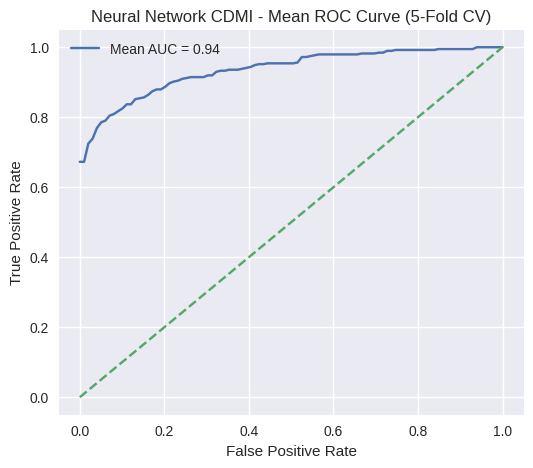

In [ ]:
# Scale the features for CDMI
scaler_NN_CDMI = StandardScaler()
X_scaled_NN_CDMI = scaler_NN_CDMI.fit_transform(X_NN_CDMI)  # Fit and transform on the entire dataset

# Define hyperparameter optimization for the model (assuming you've optimized it for CDMI)
best_params_NN_CDMI = optimize_nn_CDMI_with_optuna()

# Build the model with the best parameters
model_NN_CDMI = Sequential()
model_NN_CDMI.add(Dense(best_params_NN_CDMI['units_1'], input_dim=X_scaled_NN_CDMI.shape[1], activation='relu'))
model_NN_CDMI.add(Dropout(best_params_NN_CDMI['dropout_1']))
model_NN_CDMI.add(Dense(best_params_NN_CDMI['units_2'], activation='relu'))
model_NN_CDMI.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

model_NN_CDMI.compile(optimizer=Adam(learning_rate=best_params_NN_CDMI['learning_rate']),
                       loss='binary_crossentropy', metrics=['accuracy'])

# K-fold Cross-validation for CDMI
kf_NN_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_CDMI = []
accuracy_scores_NN_CDMI = []
precision_scores_NN_CDMI = []
recall_scores_NN_CDMI = []
f1_scores_NN_CDMI = []

fpr_list_NN_CDMI, tpr_list_NN_CDMI = [], []

for train_index, test_index in kf_NN_CDMI.split(X_scaled_NN_CDMI):
    X_train_NN_CDMI, X_test_NN_CDMI = X_scaled_NN_CDMI[train_index], X_scaled_NN_CDMI[test_index]
    y_train_NN_CDMI, y_test_NN_CDMI = y_NN_CDMI[train_index], y_NN_CDMI[test_index]

    # Fit the model
    model_NN_CDMI.fit(X_train_NN_CDMI, y_train_NN_CDMI, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    y_prob_NN_CDMI = model_NN_CDMI.predict(X_test_NN_CDMI).flatten()
    y_pred_NN_CDMI = (y_prob_NN_CDMI > 0.5).astype(int)

    # Collect ROC metrics
    fpr_NN_CDMI, tpr_NN_CDMI, _ = roc_curve(y_test_NN_CDMI, y_prob_NN_CDMI)
    roc_auc_NN_CDMI = roc_auc_score(y_test_NN_CDMI, y_prob_NN_CDMI)

    fpr_list_NN_CDMI.append(fpr_NN_CDMI)
    tpr_list_NN_CDMI.append(tpr_NN_CDMI)
    roc_auc_scores_NN_CDMI.append(roc_auc_NN_CDMI)

    # Evaluation metrics
    accuracy_NN_CDMI = accuracy_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    precision_NN_CDMI = precision_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    recall_NN_CDMI = recall_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    f1_NN_CDMI = f1_score(y_test_NN_CDMI, y_pred_NN_CDMI)

    accuracy_scores_NN_CDMI.append(accuracy_NN_CDMI)
    precision_scores_NN_CDMI.append(precision_NN_CDMI)
    recall_scores_NN_CDMI.append(recall_NN_CDMI)
    f1_scores_NN_CDMI.append(f1_NN_CDMI)

    print(f"Fold ROC AUC: {roc_auc_NN_CDMI:.4f} | Accuracy: {accuracy_NN_CDMI:.4f} | Precision: {precision_NN_CDMI:.4f} | Recall: {recall_NN_CDMI:.4f} | F1: {f1_NN_CDMI:.4f}")

# Average ROC metrics across folds for CDMI
mean_fpr_NN_CDMI = np.linspace(0, 1, 100)  # Same length for all folds
mean_tpr_NN_CDMI = np.zeros_like(mean_fpr_NN_CDMI)

# Interpolating ROC curves for CDMI
for fpr_NN_CDMI, tpr_NN_CDMI in zip(fpr_list_NN_CDMI, tpr_list_NN_CDMI):
    mean_tpr_NN_CDMI += np.interp(mean_fpr_NN_CDMI, fpr_NN_CDMI, tpr_NN_CDMI)

mean_tpr_NN_CDMI /= len(fpr_list_NN_CDMI)
mean_roc_auc_NN_CDMI = np.mean(roc_auc_scores_NN_CDMI)

# Calculate the mean of other metrics for CDMI
mean_accuracy_NN_CDMI = np.mean(accuracy_scores_NN_CDMI)
mean_precision_NN_CDMI = np.mean(precision_scores_NN_CDMI)
mean_recall_NN_CDMI = np.mean(recall_scores_NN_CDMI)
mean_f1_NN_CDMI = np.mean(f1_scores_NN_CDMI)

print(f"\nAverage metrics across all folds for CDMI:")
print(f"Average ROC AUC: {mean_roc_auc_NN_CDMI:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_CDMI:.4f}")
print(f"Average Precision: {mean_precision_NN_CDMI:.4f}")
print(f"Average Recall: {mean_recall_NN_CDMI:.4f}")
print(f"Average F1 Score: {mean_f1_NN_CDMI:.4f}")

# Plot the mean ROC curve across folds for CDMI
plt.figure(figsize=(6, 5))
plt.plot(mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, label=f'Mean AUC = {mean_roc_auc_NN_CDMI:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Neural Network CDMI - Mean ROC Curve (5-Fold CV)')
plt.legend()
plt.show()